In [2]:
# Basic GAN Notebook

# Read a fun article about GANS that I wrote in medium:
# https://towardsdatascience.com/leonardo-and-the-gan-dream-f69e8553e0af?sk=c1fdf85e94c48acd61df451babc41dfe

# import the libraries
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [3]:
# visualization function
def show(tensor, ch=1, size=(28,28), num=16):
  # tensor: 128 x 784
  data=tensor.detach().cpu().view(-1,ch,*size) # 128 x 1 x 28 x 28
  grid = make_grid(data[:num], nrow=4).permute(1,2,0)   # 1 x 28 x 28  = 28 x 28 x 1
  plt.imshow(grid)
  plt.show()

In [4]:
# setup of the main parameters and hyperparameters
epochs = 500
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),shuffle=True, batch_size=bs)

# number of steps = 60000 / 128 = 468.75

100%|██████████| 9912422/9912422 [00:00<00:00, 258922547.17it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 96753749.06it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 61626877.05it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 18824633.17it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [5]:
# Generator
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim), # 64, 128
        genBlock(h_dim, h_dim*2), # 128, 256
        genBlock(h_dim*2, h_dim*4), # 256 x 512
        genBlock(h_dim*4, h_dim*8), # 512, 1024
        nn.Linear(h_dim*8, i_dim), # 1024, 784 (28x28)
        nn.Sigmoid(),
    )

  def forward(self, noise):
       return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

## Discriminator
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc=nn.Sequential(
        discBlock(i_dim, h_dim*4), # 784, 1024
        discBlock(h_dim*4, h_dim*2), # 1024, 512
        discBlock(h_dim*2, h_dim), # 512, 256
        nn.Linear(h_dim, 1) # 256, 1
    )

  def forward(self, image):
      return self.disc(image)

In [6]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [7]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [8]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([4, 9, 2, 9, 1, 7, 1, 2, 2, 0])


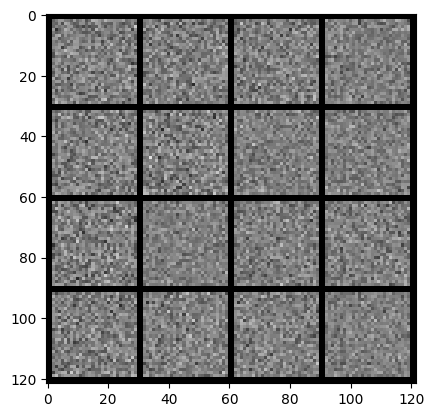

In [9]:
x,y=next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [10]:
# calculating the loss

# generator loss
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   pred = disc(fake)
   targets=torch.ones_like(pred)
   gen_loss=loss_func(pred,targets)

   return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   disc_fake = disc(fake.detach())
   disc_fake_targets=torch.zeros_like(disc_fake)
   disc_fake_loss=loss_func(disc_fake, disc_fake_targets)

   disc_real = disc(real)
   disc_real_targets=torch.ones_like(disc_real)
   disc_real_loss=loss_func(disc_real, disc_real_targets)

   disc_loss=(disc_fake_loss+disc_real_loss)/2

   return disc_loss

  0%|          | 0/469 [00:00<?, ?it/s]

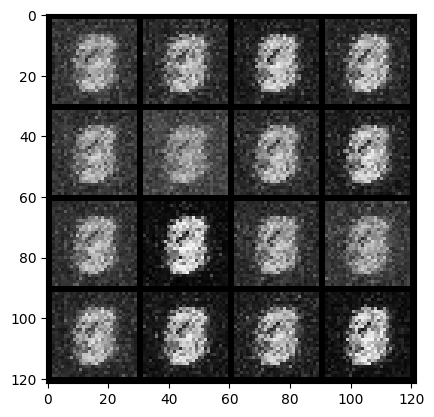

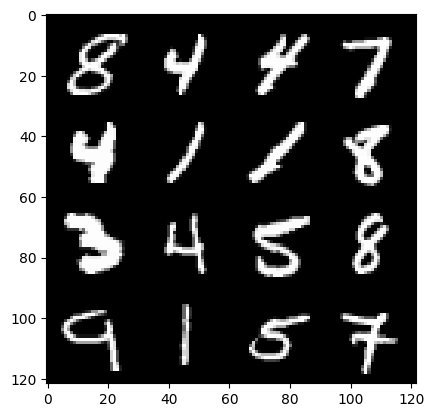

0: step 300 / Gen loss: 2.014098554849624 / disc_loss: 0.33624409442146624


  0%|          | 0/469 [00:00<?, ?it/s]

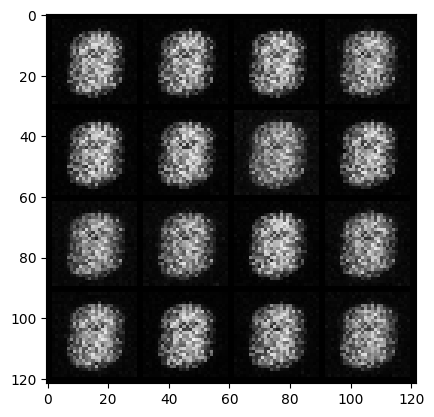

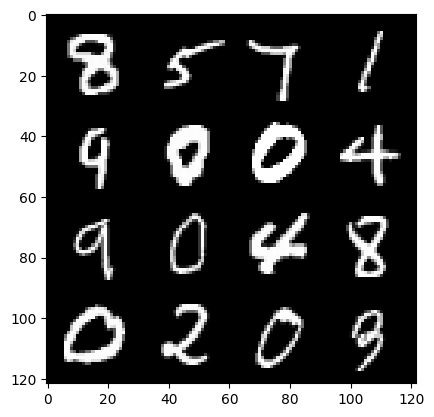

1: step 600 / Gen loss: 3.5484232791264843 / disc_loss: 0.11380313401420916


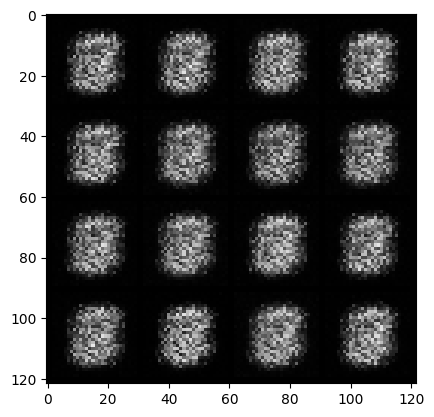

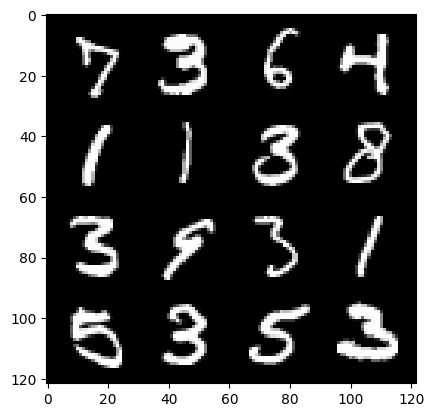

1: step 900 / Gen loss: 3.601057536602022 / disc_loss: 0.04953070957213641


  0%|          | 0/469 [00:00<?, ?it/s]

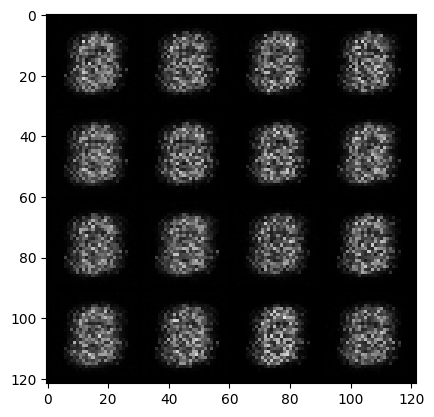

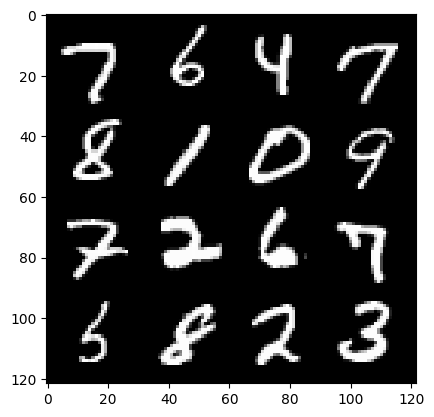

2: step 1200 / Gen loss: 3.68746524810791 / disc_loss: 0.0312735865265131


  0%|          | 0/469 [00:00<?, ?it/s]

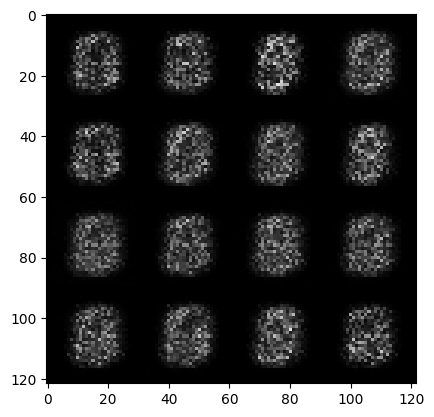

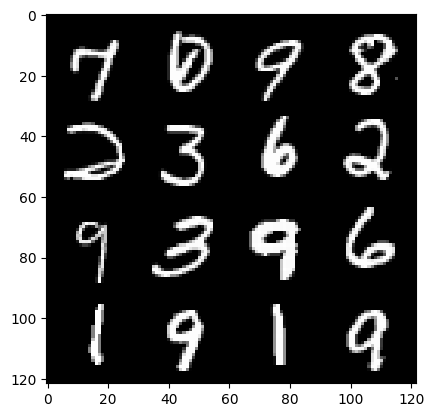

3: step 1500 / Gen loss: 3.5055555518468227 / disc_loss: 0.038195156982789455


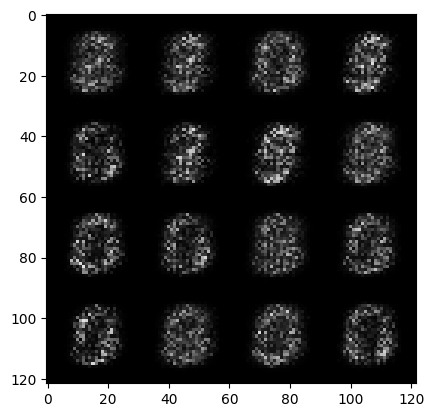

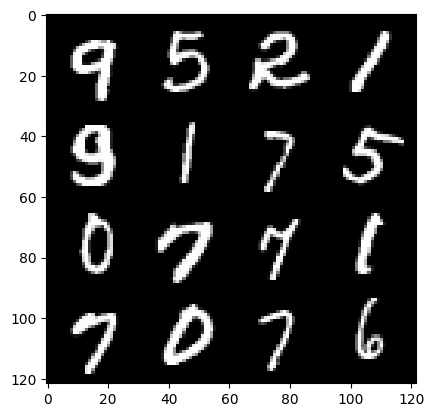

3: step 1800 / Gen loss: 3.3481302348772655 / disc_loss: 0.05453632054229577


  0%|          | 0/469 [00:00<?, ?it/s]

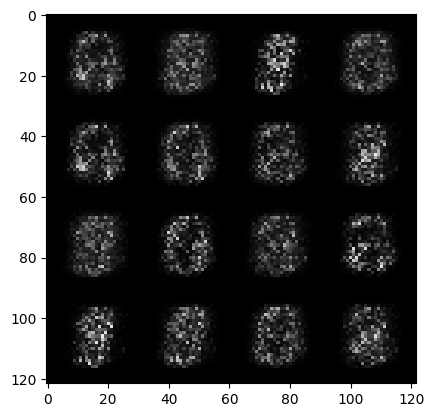

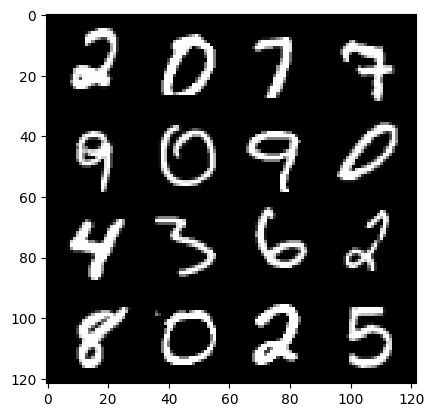

4: step 2100 / Gen loss: 3.546308953762054 / disc_loss: 0.0484223757125437


  0%|          | 0/469 [00:00<?, ?it/s]

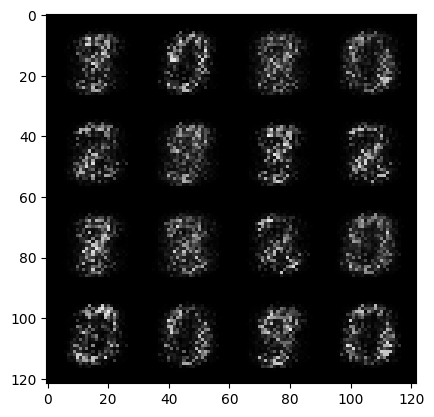

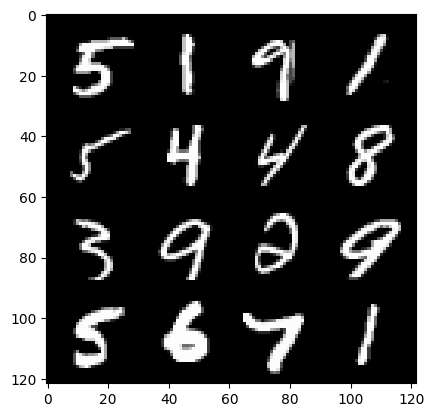

5: step 2400 / Gen loss: 3.8883942969640093 / disc_loss: 0.037569964087257796


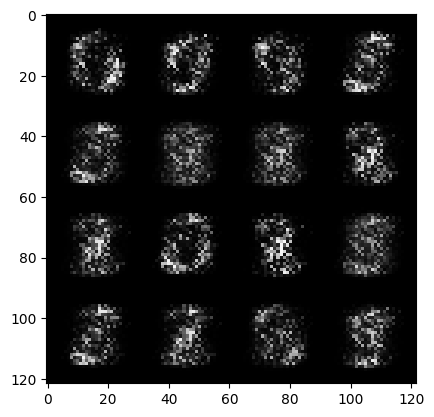

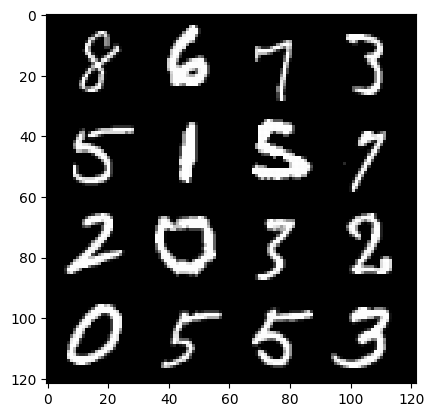

5: step 2700 / Gen loss: 4.410261034965516 / disc_loss: 0.029919853977238127


  0%|          | 0/469 [00:00<?, ?it/s]

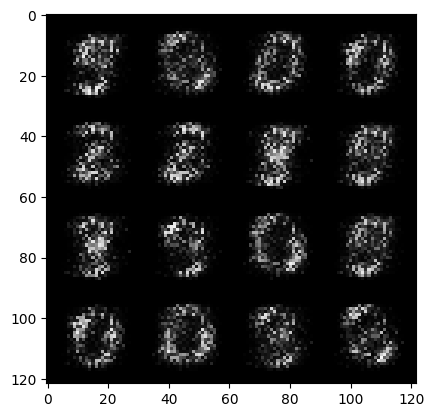

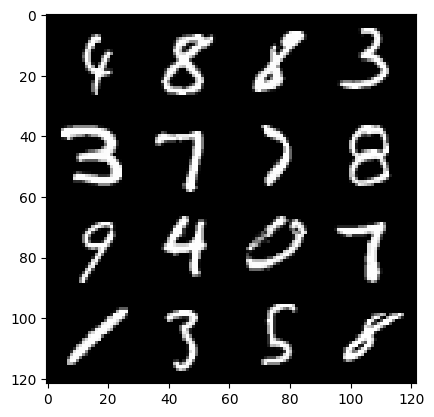

6: step 3000 / Gen loss: 4.575347647666935 / disc_loss: 0.027830445157984888


  0%|          | 0/469 [00:00<?, ?it/s]

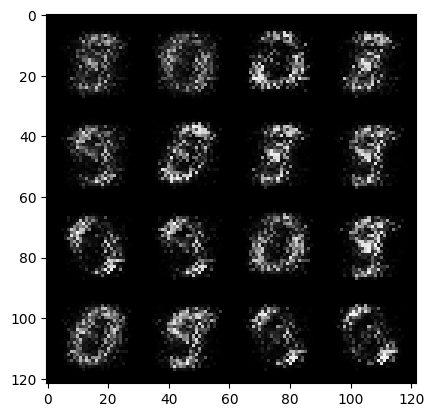

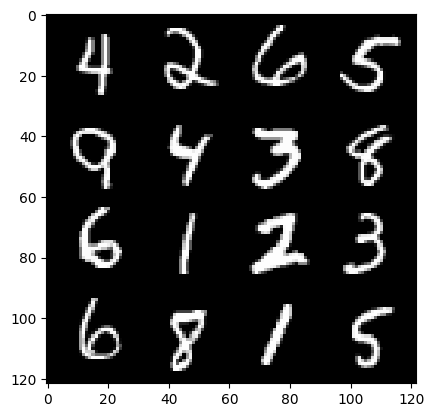

7: step 3300 / Gen loss: 4.953769427935285 / disc_loss: 0.023440544102340925


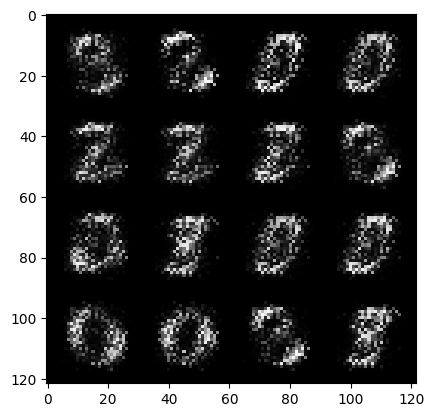

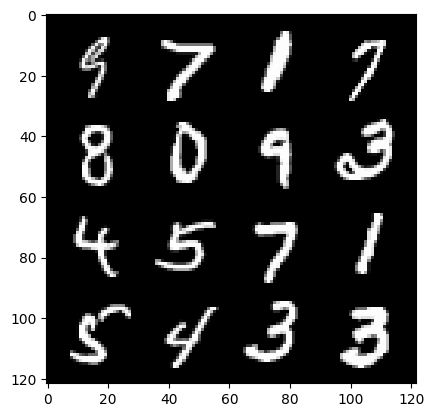

7: step 3600 / Gen loss: 5.020267300605775 / disc_loss: 0.022132765591765427


  0%|          | 0/469 [00:00<?, ?it/s]

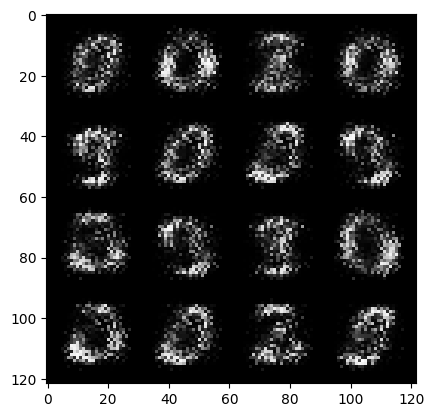

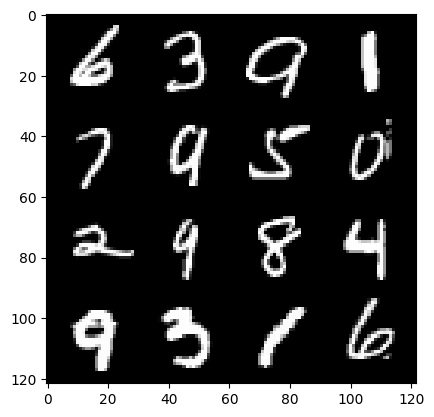

8: step 3900 / Gen loss: 5.209099364280697 / disc_loss: 0.019856994651878873


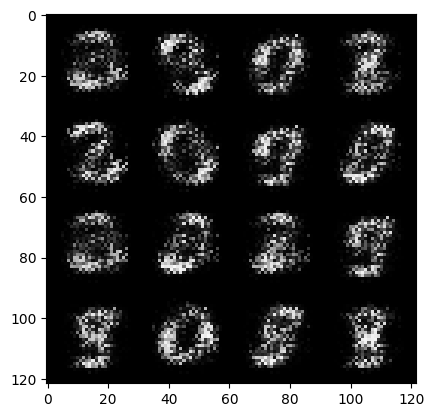

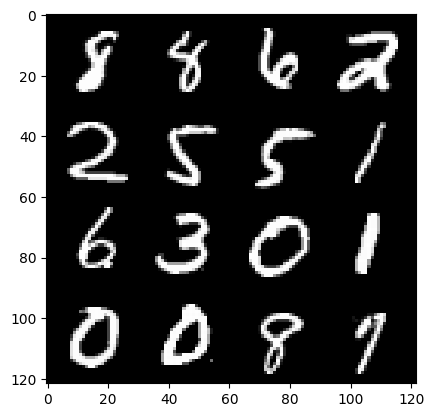

8: step 4200 / Gen loss: 5.820355251630146 / disc_loss: 0.016054564073371393


  0%|          | 0/469 [00:00<?, ?it/s]

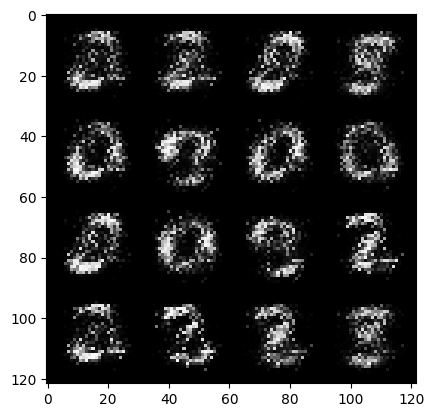

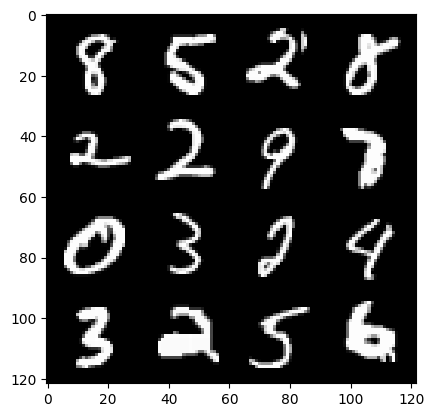

9: step 4500 / Gen loss: 6.261625871658325 / disc_loss: 0.013339874084728467


  0%|          | 0/469 [00:00<?, ?it/s]

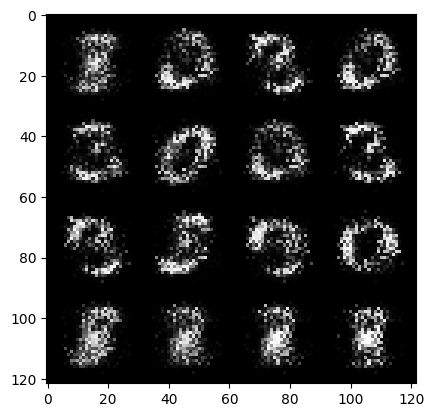

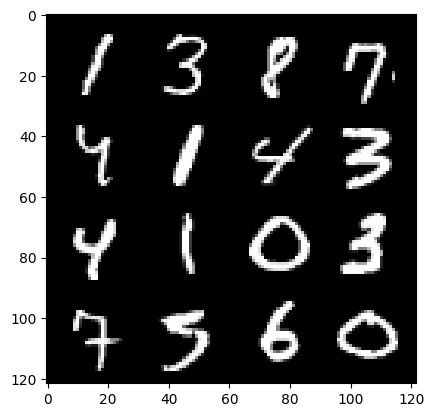

10: step 4800 / Gen loss: 6.136406135559081 / disc_loss: 0.01266983580775559


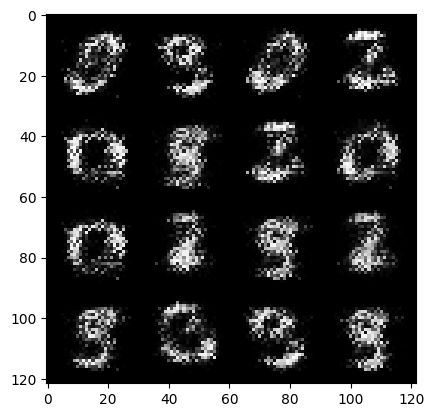

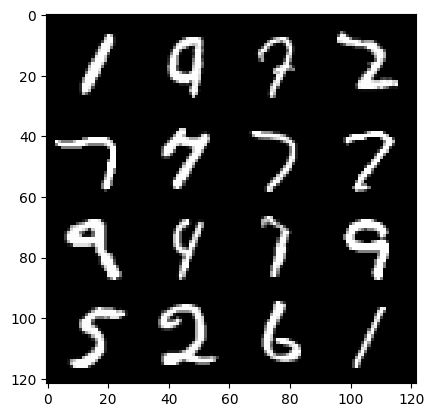

10: step 5100 / Gen loss: 6.445540653864543 / disc_loss: 0.012621647533960641


  0%|          | 0/469 [00:00<?, ?it/s]

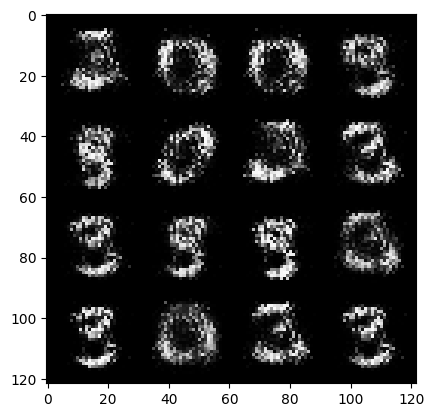

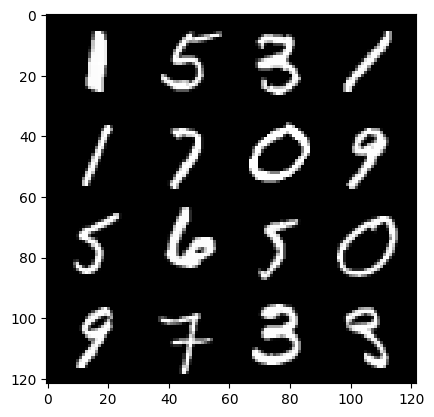

11: step 5400 / Gen loss: 6.372721071243286 / disc_loss: 0.014217128132780383


  0%|          | 0/469 [00:00<?, ?it/s]

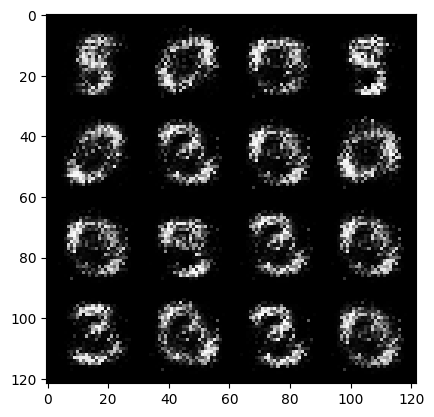

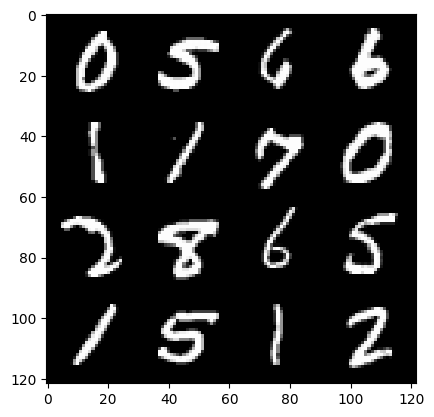

12: step 5700 / Gen loss: 6.260346226692199 / disc_loss: 0.014062180916468303


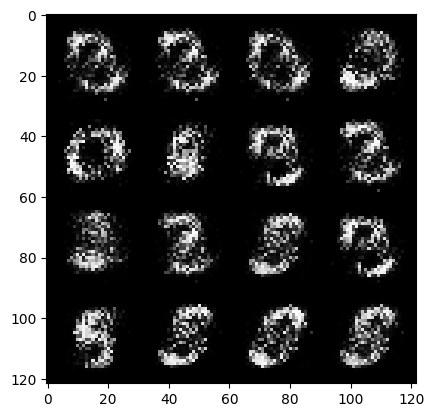

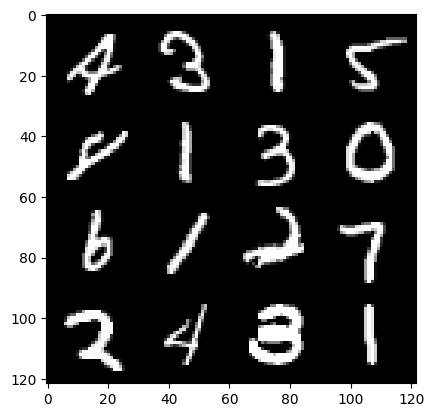

12: step 6000 / Gen loss: 6.329453488985696 / disc_loss: 0.01290057974324251


  0%|          | 0/469 [00:00<?, ?it/s]

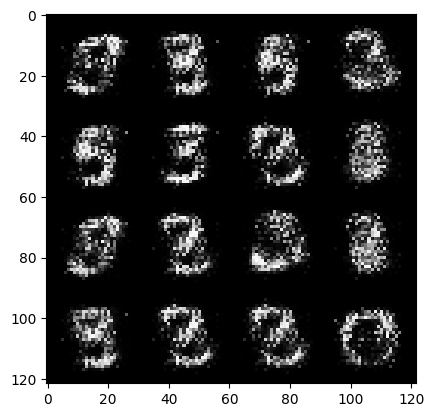

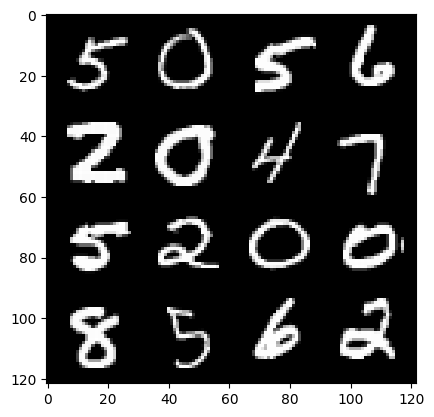

13: step 6300 / Gen loss: 6.465363319714862 / disc_loss: 0.011482966624510793


  0%|          | 0/469 [00:00<?, ?it/s]

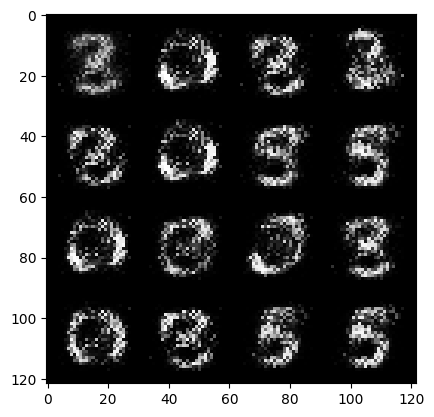

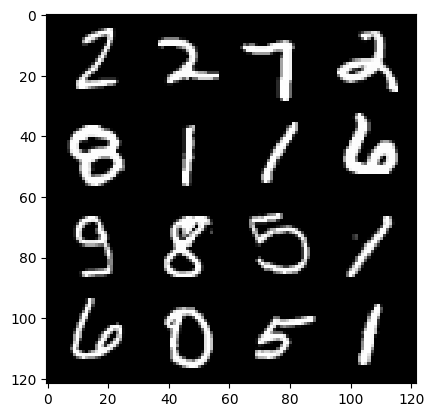

14: step 6600 / Gen loss: 6.956172126134235 / disc_loss: 0.010193999303349596


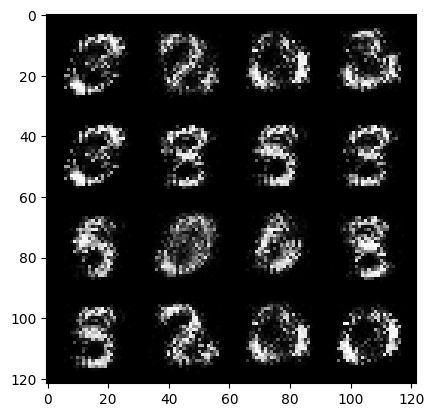

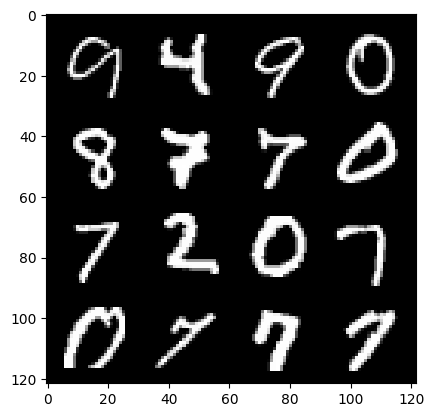

14: step 6900 / Gen loss: 6.550594361623123 / disc_loss: 0.012190001629448185


  0%|          | 0/469 [00:00<?, ?it/s]

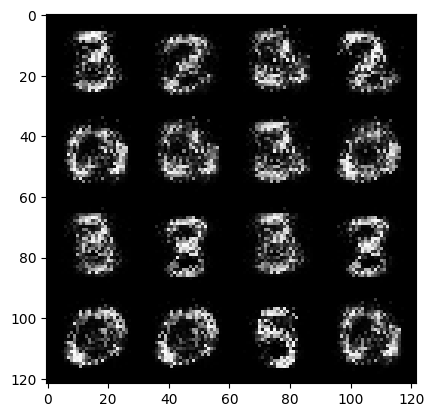

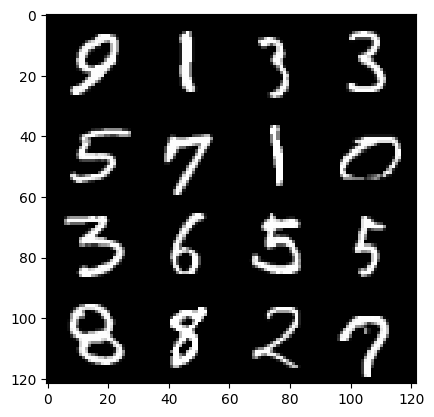

15: step 7200 / Gen loss: 6.464338827133183 / disc_loss: 0.010358030879093956


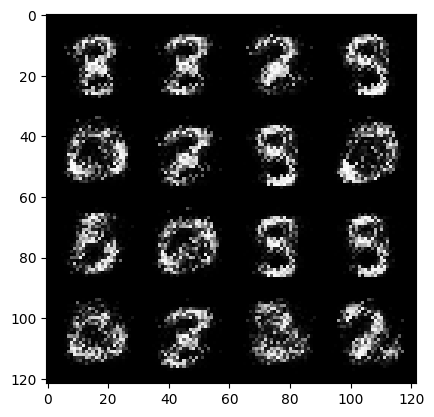

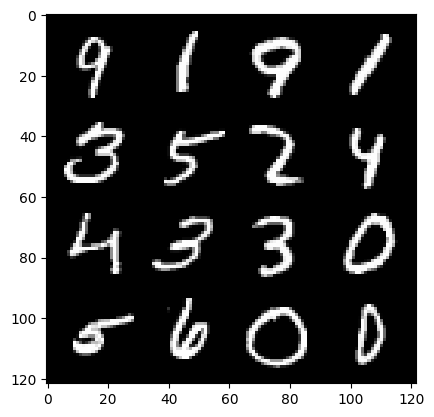

15: step 7500 / Gen loss: 6.815604198773705 / disc_loss: 0.008556685224175452


  0%|          | 0/469 [00:00<?, ?it/s]

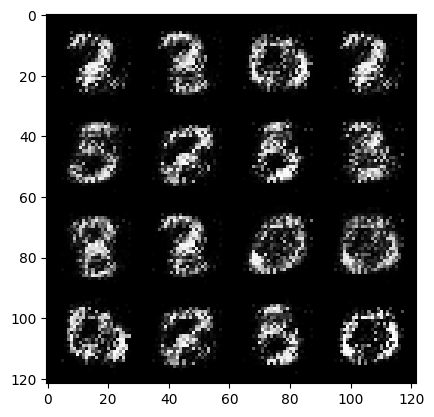

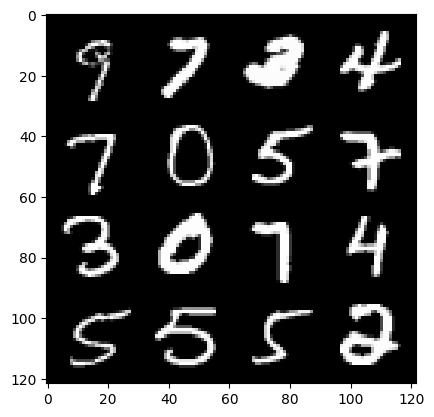

16: step 7800 / Gen loss: 7.235798392295838 / disc_loss: 0.00937309531650195


  0%|          | 0/469 [00:00<?, ?it/s]

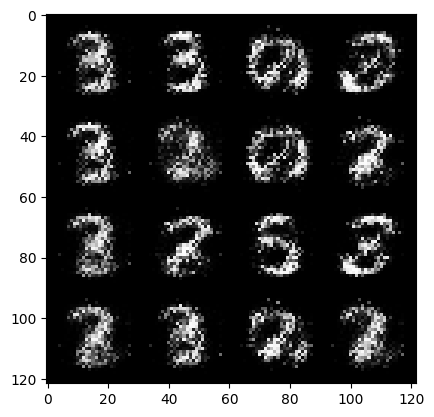

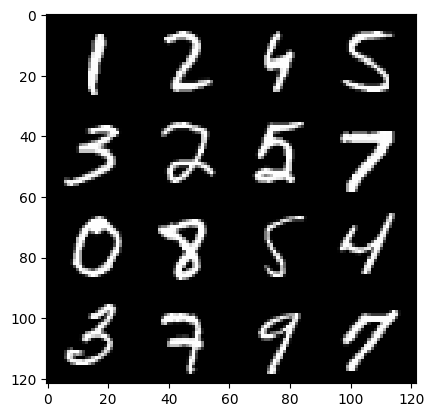

17: step 8100 / Gen loss: 7.249181582132972 / disc_loss: 0.0082983877727141


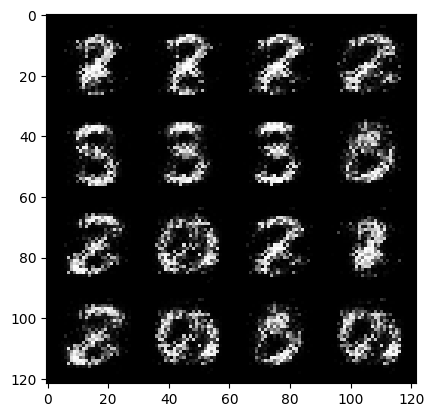

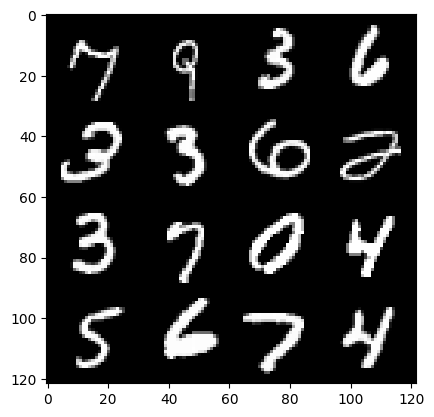

17: step 8400 / Gen loss: 7.303406016031903 / disc_loss: 0.008029993382127332


  0%|          | 0/469 [00:00<?, ?it/s]

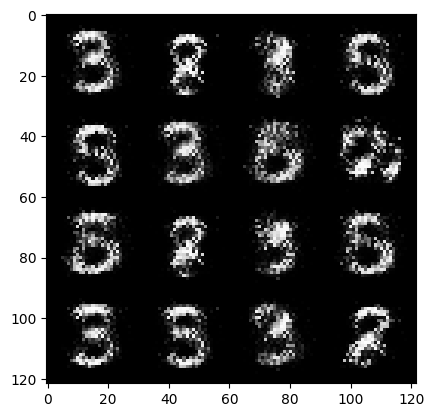

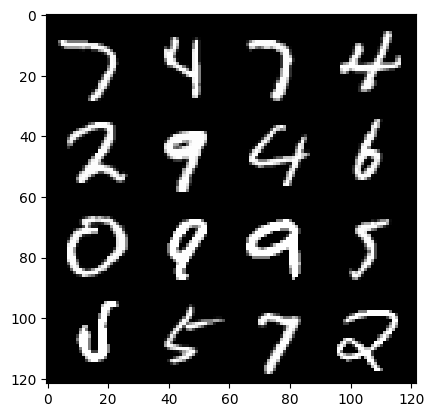

18: step 8700 / Gen loss: 6.639752364158626 / disc_loss: 0.010560134175854418


  0%|          | 0/469 [00:00<?, ?it/s]

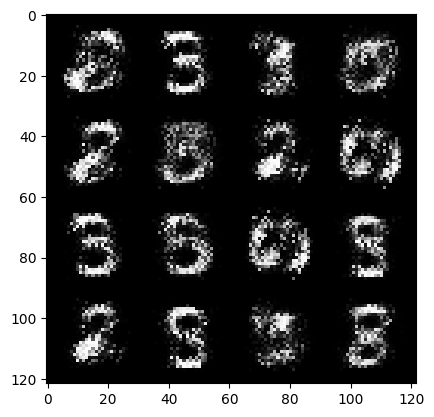

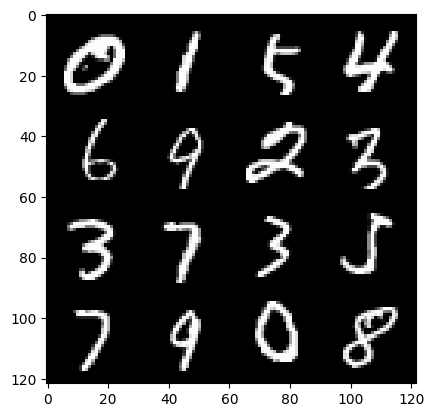

19: step 9000 / Gen loss: 7.253874225616457 / disc_loss: 0.009372043305775152


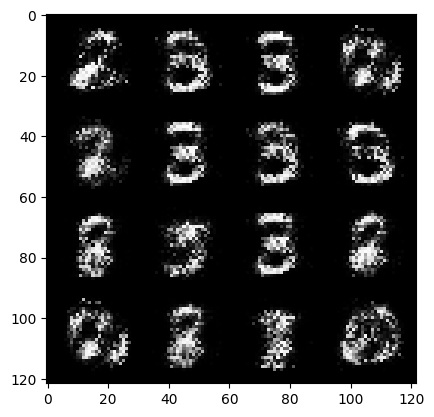

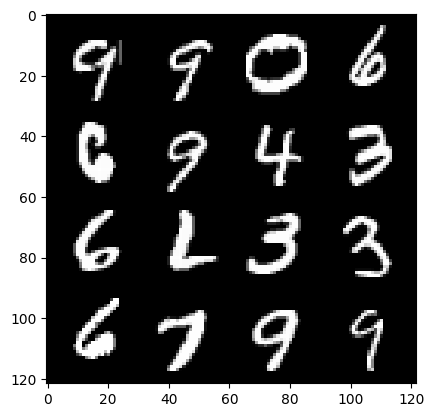

19: step 9300 / Gen loss: 6.9424079751968355 / disc_loss: 0.010285853803313025


  0%|          | 0/469 [00:00<?, ?it/s]

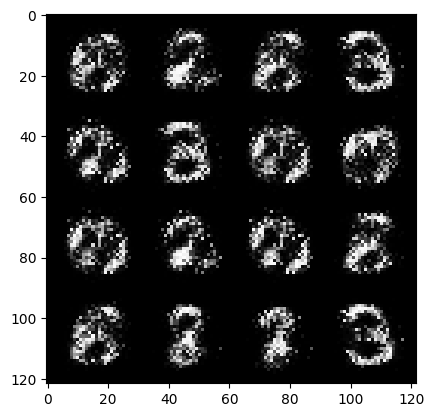

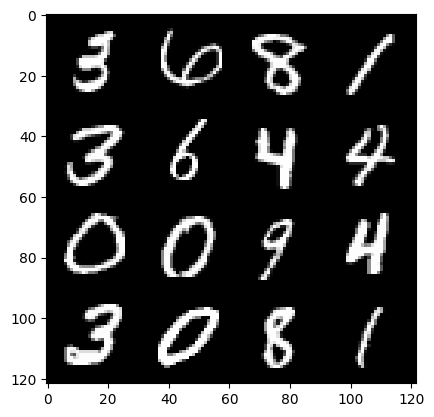

20: step 9600 / Gen loss: 6.647001835505168 / disc_loss: 0.01033783736250674


  0%|          | 0/469 [00:00<?, ?it/s]

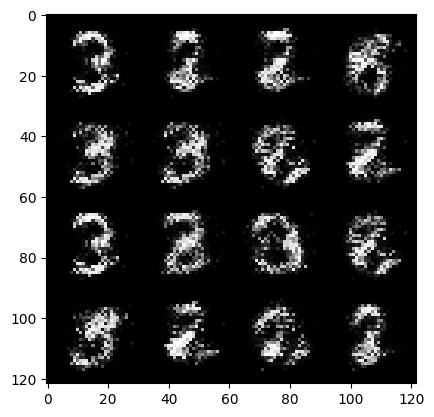

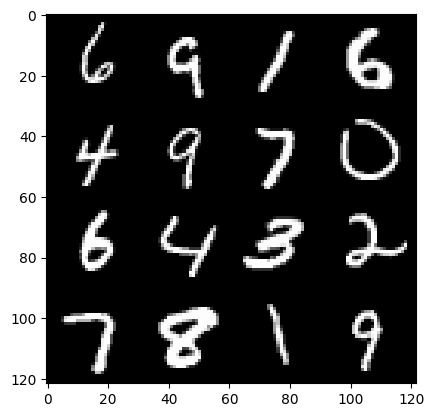

21: step 9900 / Gen loss: 6.751101959546406 / disc_loss: 0.011763309893043092


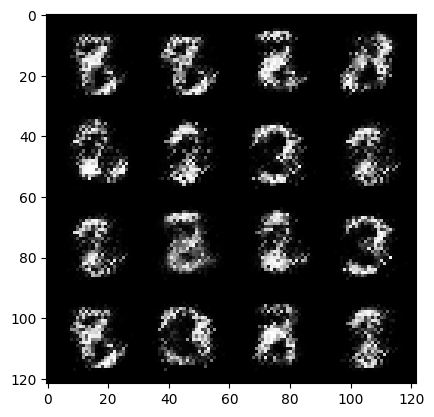

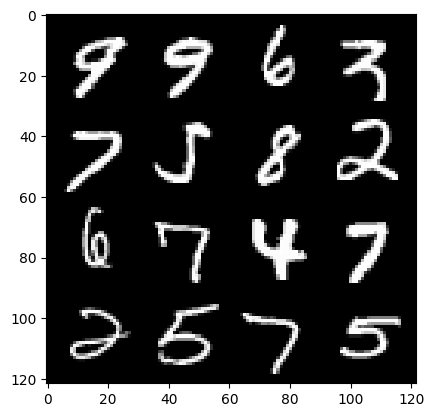

21: step 10200 / Gen loss: 6.366262818972268 / disc_loss: 0.01455733912996948


  0%|          | 0/469 [00:00<?, ?it/s]

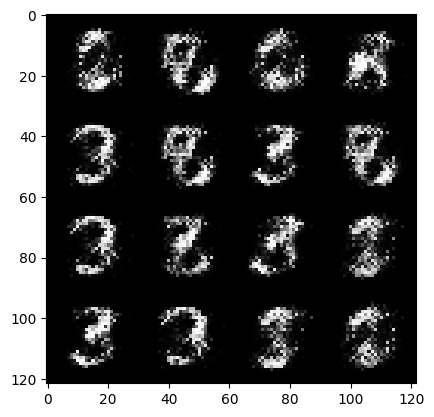

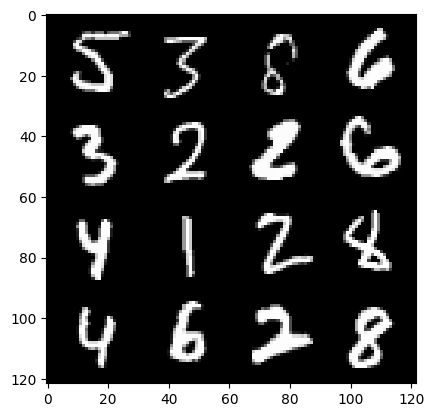

22: step 10500 / Gen loss: 6.335920011202496 / disc_loss: 0.01370939426977807


  0%|          | 0/469 [00:00<?, ?it/s]

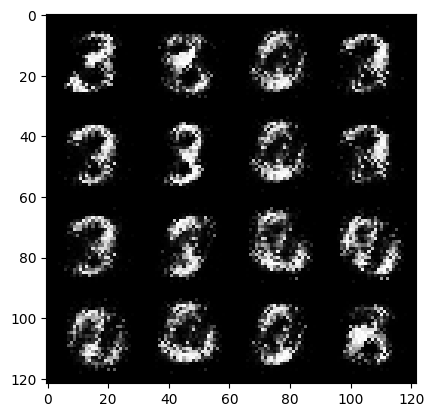

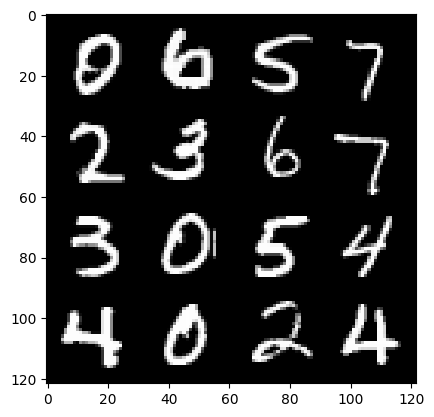

23: step 10800 / Gen loss: 6.685816156069439 / disc_loss: 0.012845117611965787


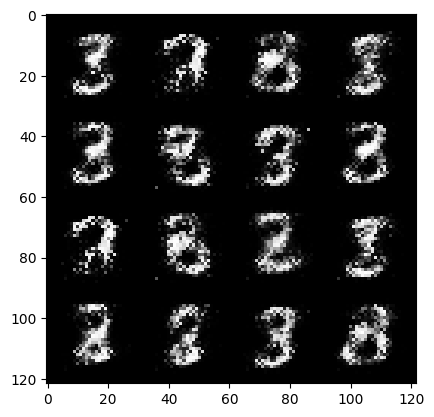

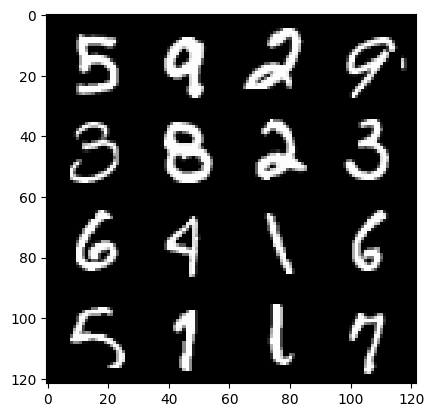

23: step 11100 / Gen loss: 6.554678948720299 / disc_loss: 0.010486697737748426


  0%|          | 0/469 [00:00<?, ?it/s]

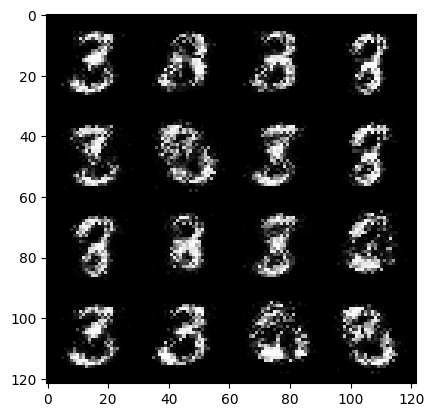

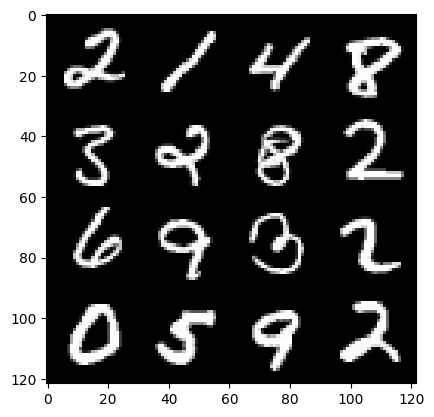

24: step 11400 / Gen loss: 6.847110522588093 / disc_loss: 0.009092635317938412


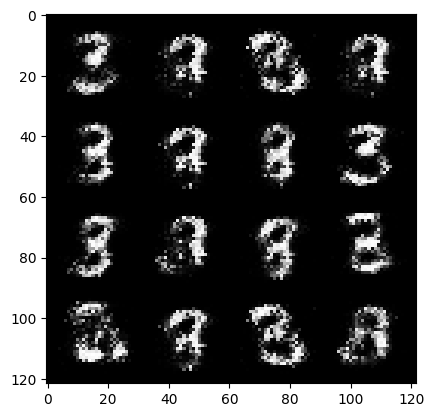

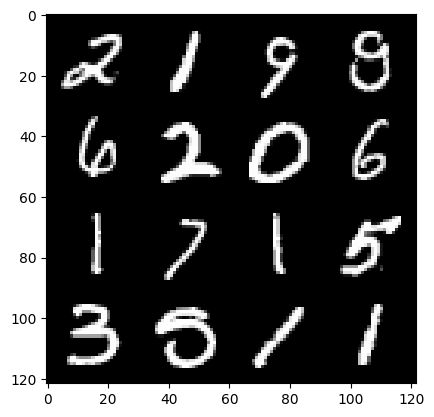

24: step 11700 / Gen loss: 6.464294656117751 / disc_loss: 0.012327493081490197


  0%|          | 0/469 [00:00<?, ?it/s]

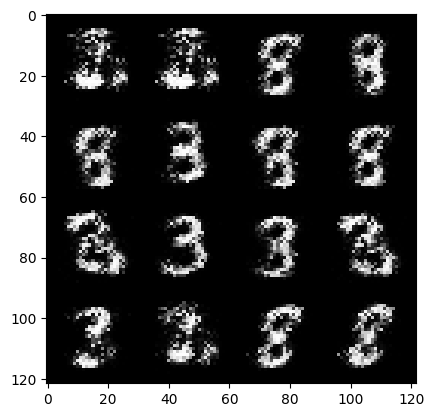

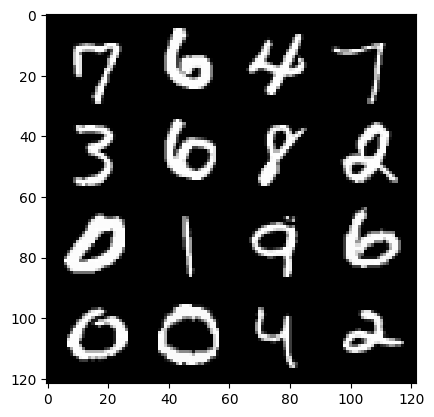

25: step 12000 / Gen loss: 6.13905763308207 / disc_loss: 0.013783002016134558


  0%|          | 0/469 [00:00<?, ?it/s]

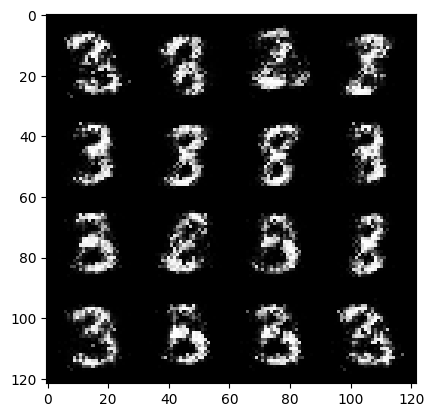

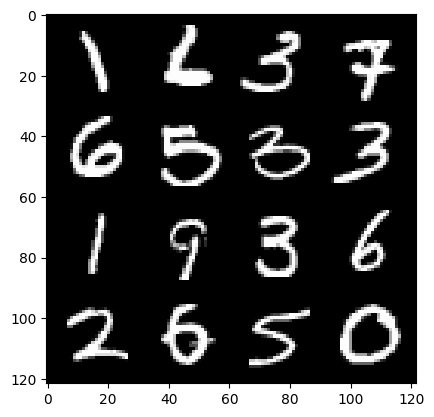

26: step 12300 / Gen loss: 6.1948692687352525 / disc_loss: 0.01301821412052959


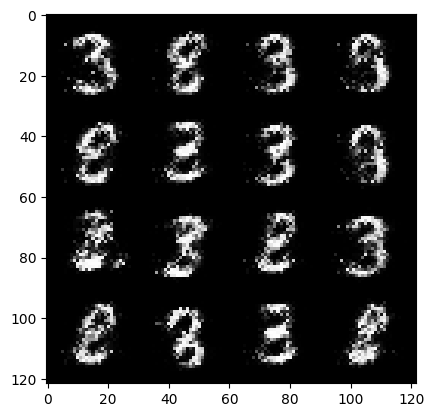

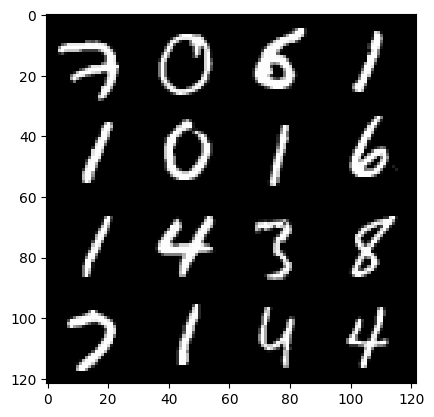

26: step 12600 / Gen loss: 6.1740191634496036 / disc_loss: 0.014897648010713355


  0%|          | 0/469 [00:00<?, ?it/s]

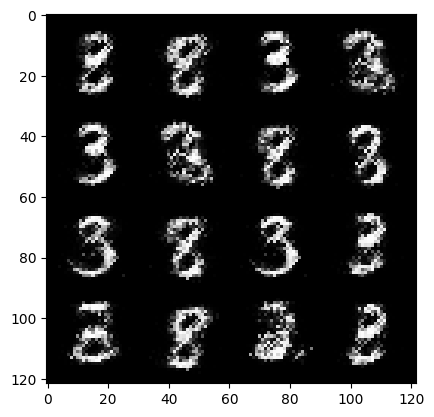

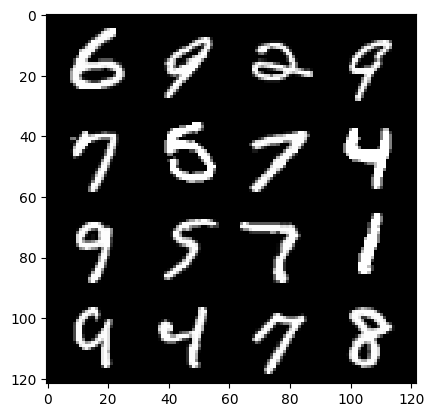

27: step 12900 / Gen loss: 6.24217352867127 / disc_loss: 0.014469012320041651


  0%|          | 0/469 [00:00<?, ?it/s]

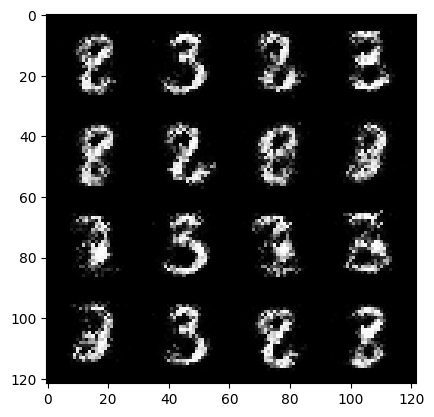

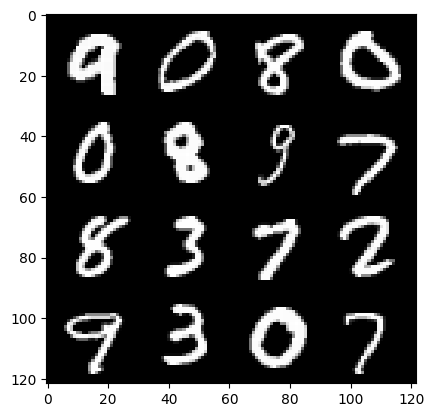

28: step 13200 / Gen loss: 6.541142020225523 / disc_loss: 0.02120552172651515


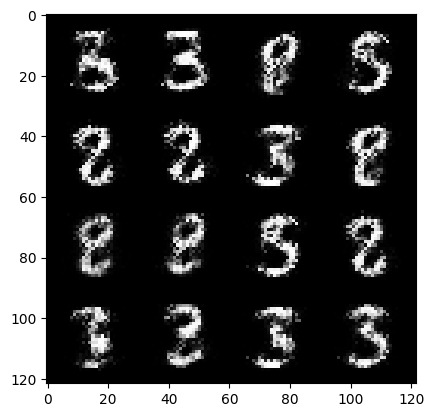

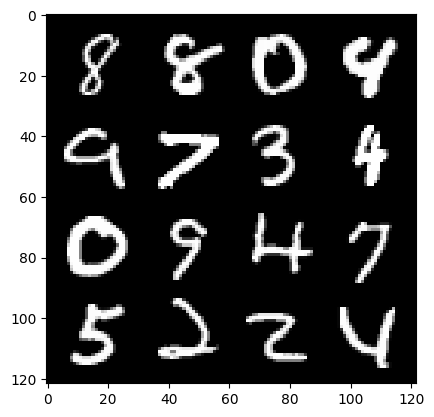

28: step 13500 / Gen loss: 6.090784880320227 / disc_loss: 0.021676460524710523


  0%|          | 0/469 [00:00<?, ?it/s]

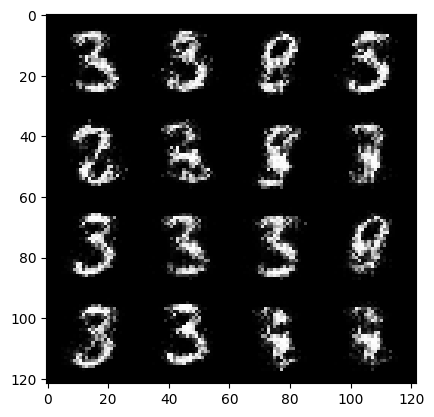

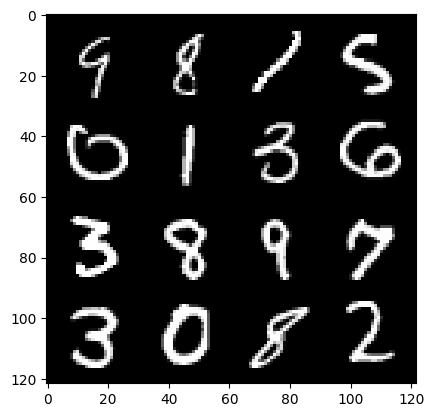

29: step 13800 / Gen loss: 5.86054265658061 / disc_loss: 0.021579172213096177


  0%|          | 0/469 [00:00<?, ?it/s]

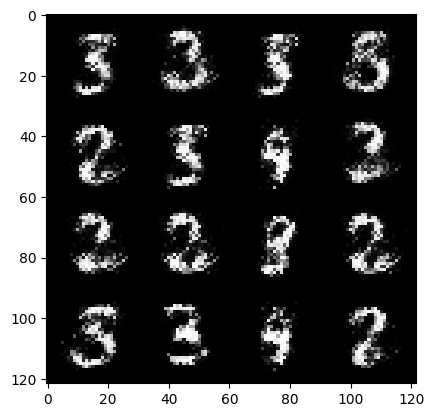

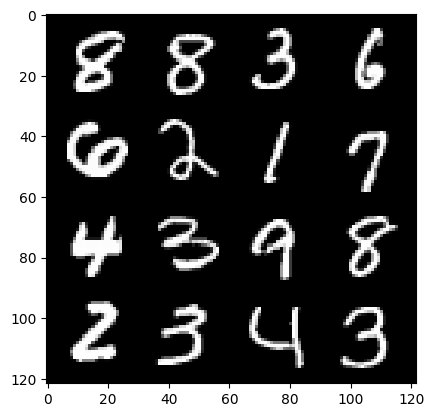

30: step 14100 / Gen loss: 6.012501255671181 / disc_loss: 0.017373311138556648


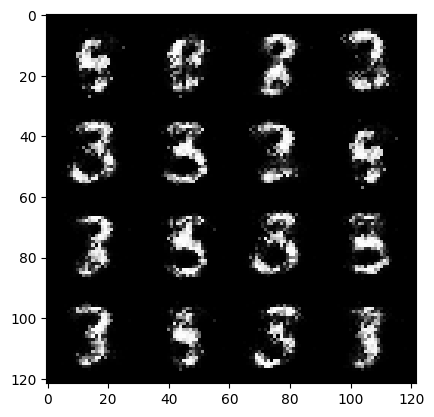

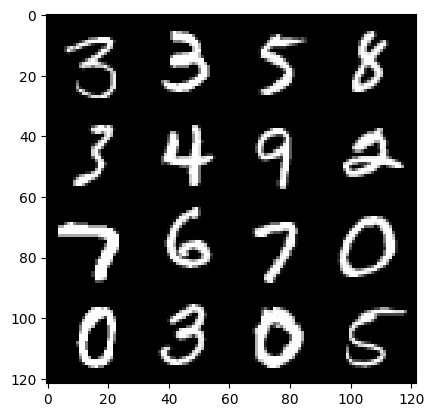

30: step 14400 / Gen loss: 5.842860422134399 / disc_loss: 0.018619783043395715


  0%|          | 0/469 [00:00<?, ?it/s]

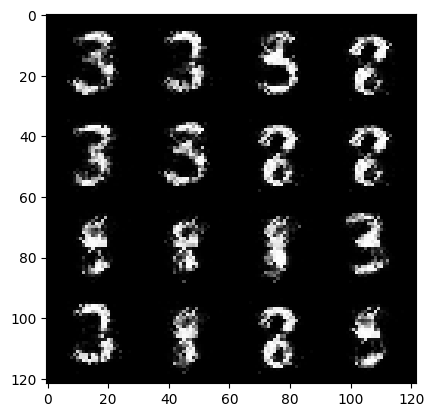

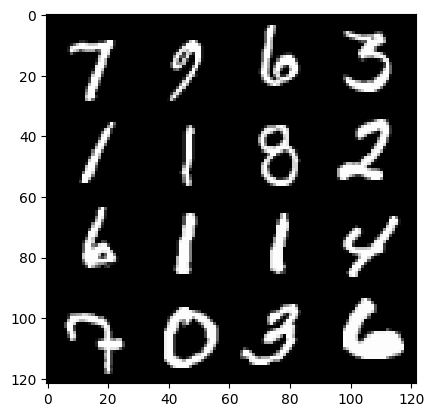

31: step 14700 / Gen loss: 5.923252010345461 / disc_loss: 0.01624557810757931


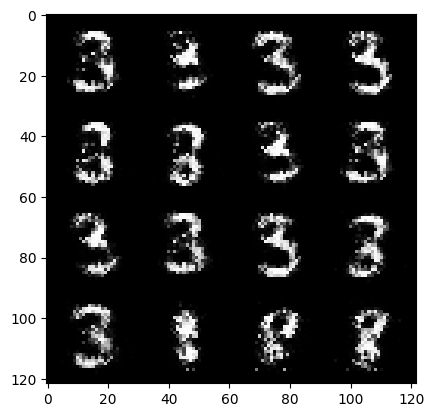

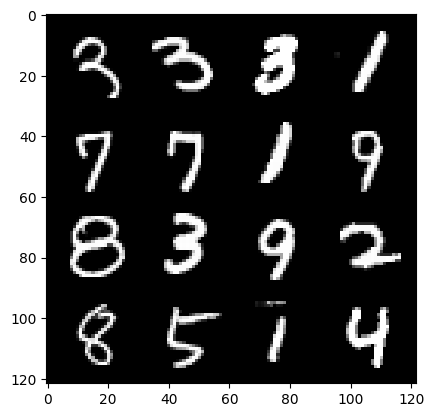

31: step 15000 / Gen loss: 5.917636229197181 / disc_loss: 0.01691516863026967


  0%|          | 0/469 [00:00<?, ?it/s]

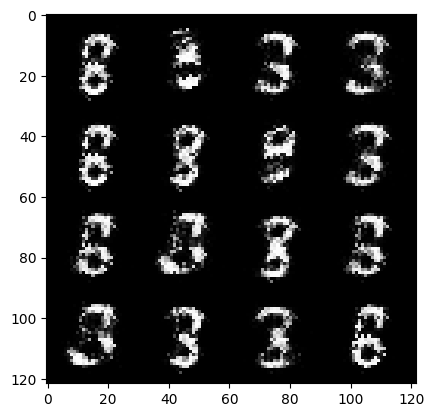

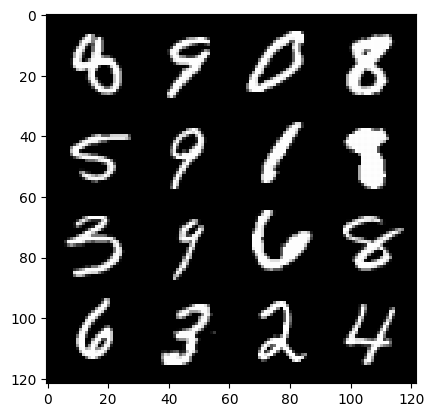

32: step 15300 / Gen loss: 6.362691299120582 / disc_loss: 0.017187877466591686


  0%|          | 0/469 [00:00<?, ?it/s]

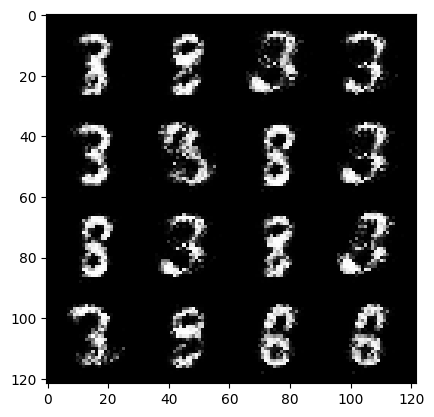

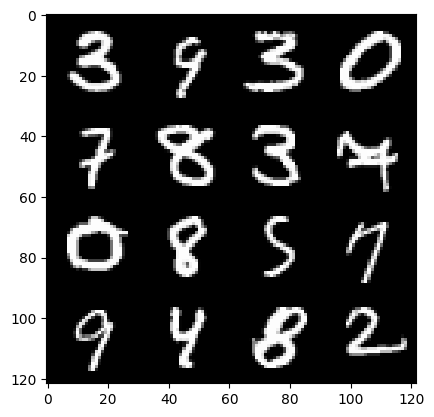

33: step 15600 / Gen loss: 6.379825789133712 / disc_loss: 0.021684169884150218


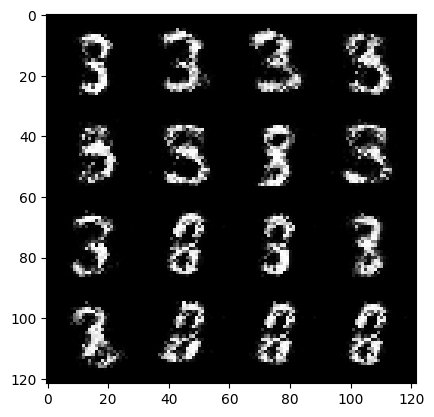

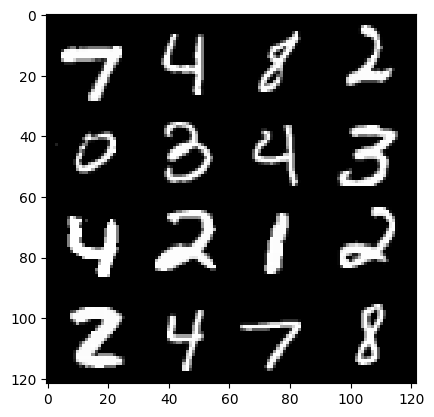

33: step 15900 / Gen loss: 6.192277124722801 / disc_loss: 0.022468685583832353


  0%|          | 0/469 [00:00<?, ?it/s]

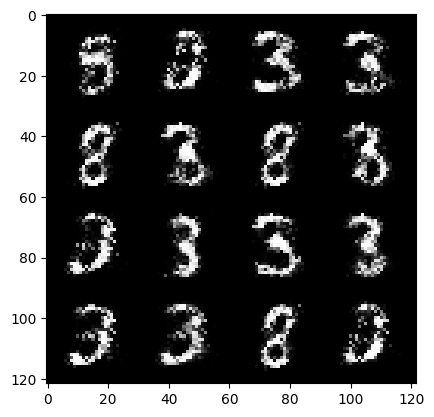

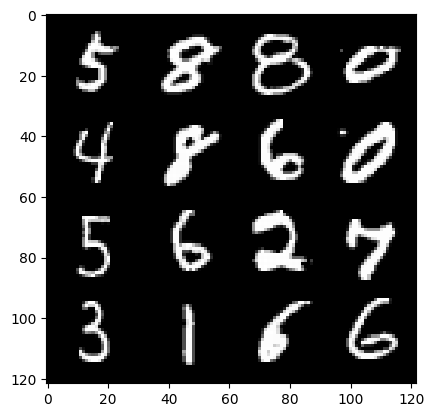

34: step 16200 / Gen loss: 6.41054608345032 / disc_loss: 0.01613992108070912


  0%|          | 0/469 [00:00<?, ?it/s]

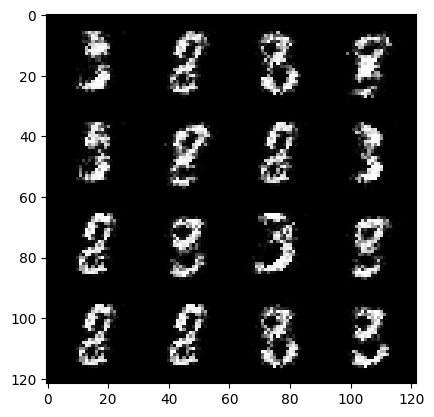

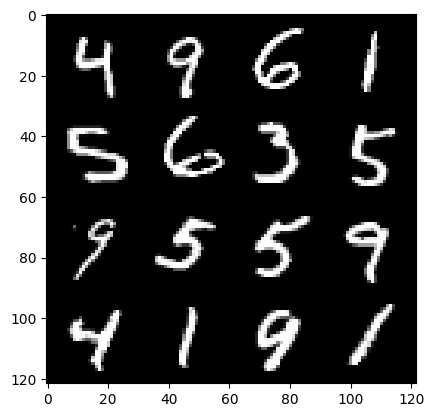

35: step 16500 / Gen loss: 6.602738595008848 / disc_loss: 0.016219657915644344


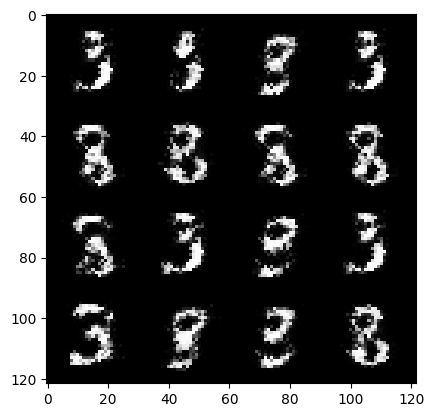

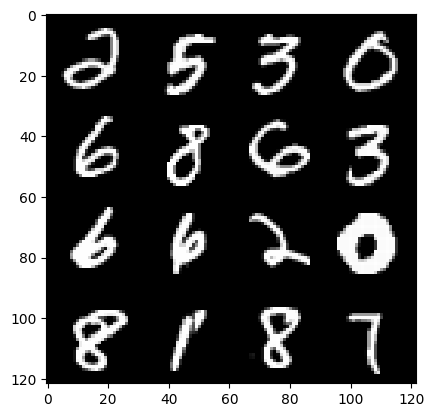

35: step 16800 / Gen loss: 6.310872766176855 / disc_loss: 0.024462190836978464


  0%|          | 0/469 [00:00<?, ?it/s]

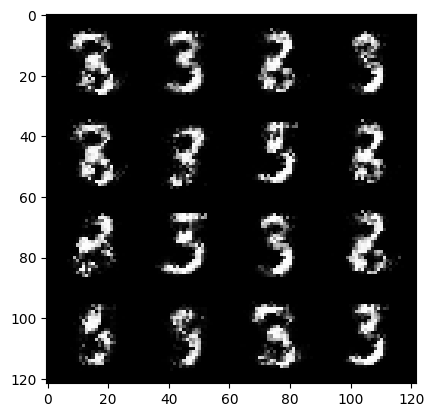

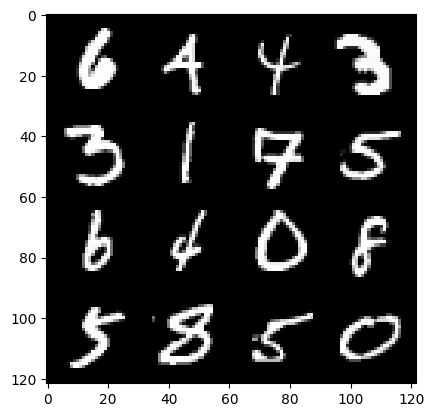

36: step 17100 / Gen loss: 5.942087446848555 / disc_loss: 0.029578123536581808


  0%|          | 0/469 [00:00<?, ?it/s]

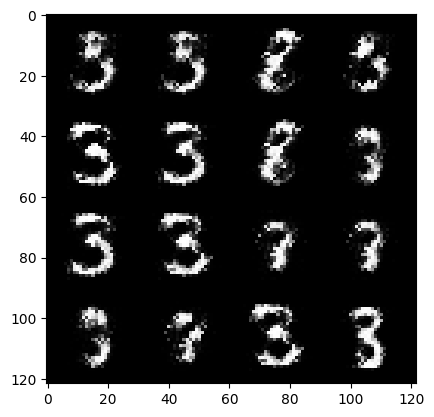

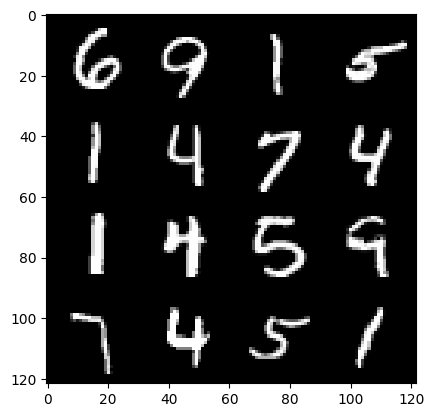

37: step 17400 / Gen loss: 5.756861257553099 / disc_loss: 0.033887134573111925


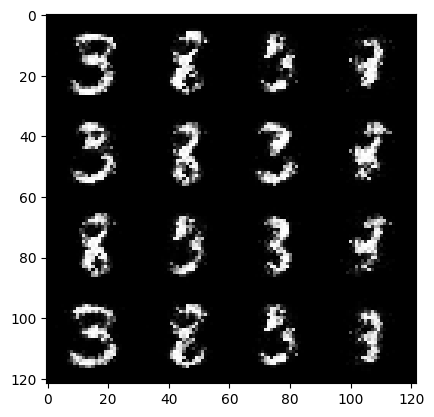

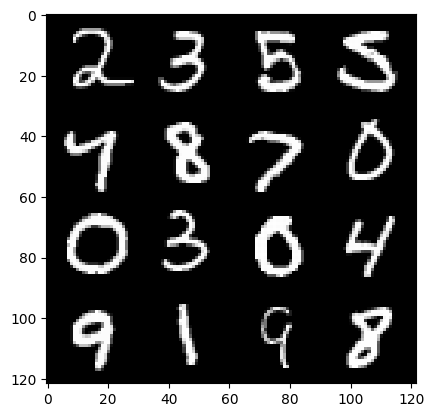

37: step 17700 / Gen loss: 6.204095226923627 / disc_loss: 0.025923851013649246


  0%|          | 0/469 [00:00<?, ?it/s]

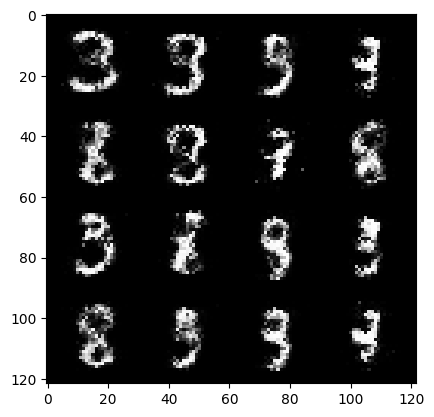

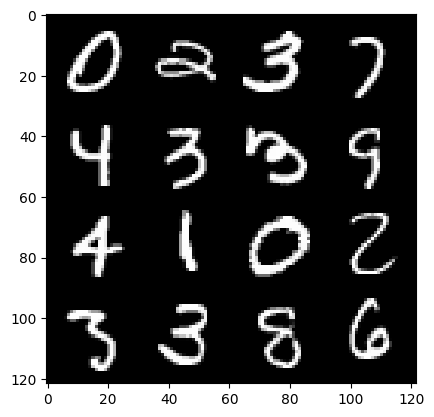

38: step 18000 / Gen loss: 6.486489917437235 / disc_loss: 0.03004911385476587


  0%|          | 0/469 [00:00<?, ?it/s]

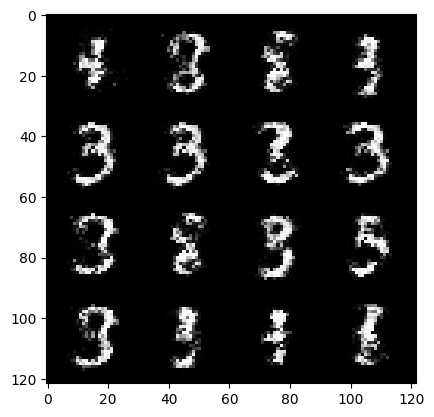

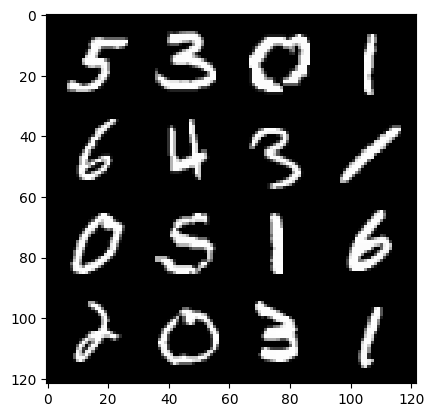

39: step 18300 / Gen loss: 5.87734836260478 / disc_loss: 0.03807042087117832


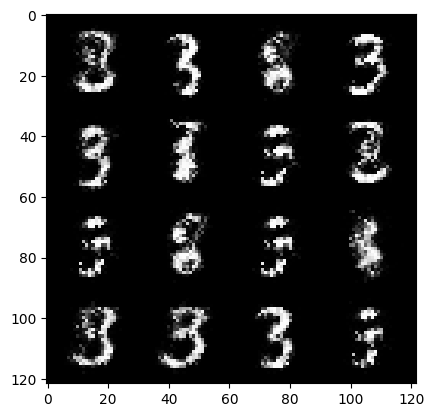

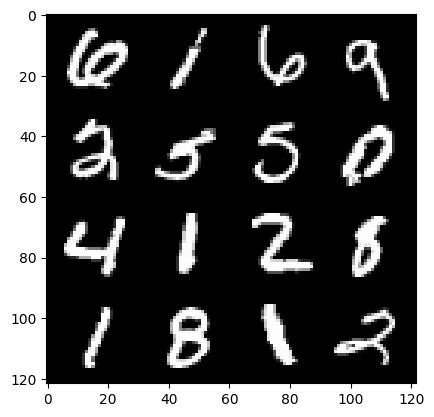

39: step 18600 / Gen loss: 6.005751290321355 / disc_loss: 0.035383919463492945


  0%|          | 0/469 [00:00<?, ?it/s]

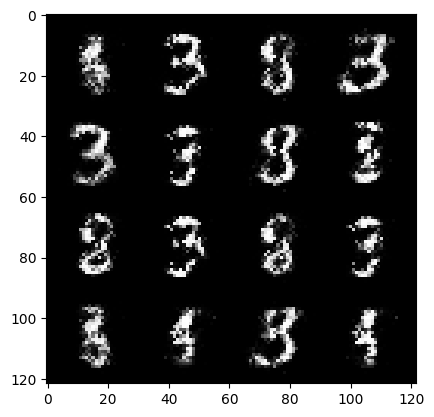

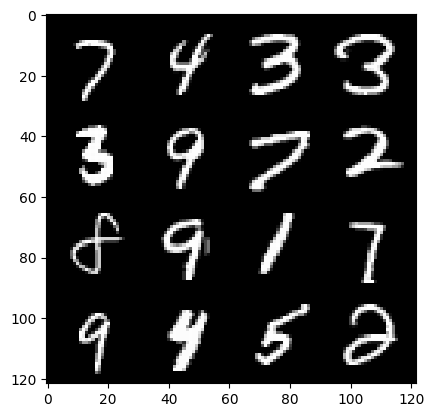

40: step 18900 / Gen loss: 5.740930145581564 / disc_loss: 0.032036215018791454


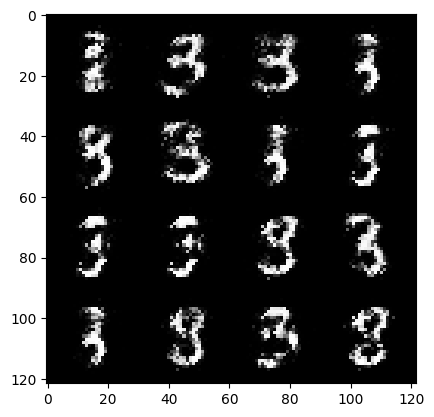

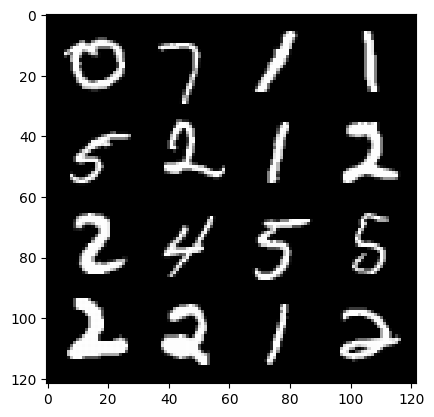

40: step 19200 / Gen loss: 5.816678315798437 / disc_loss: 0.029403503562013284


  0%|          | 0/469 [00:00<?, ?it/s]

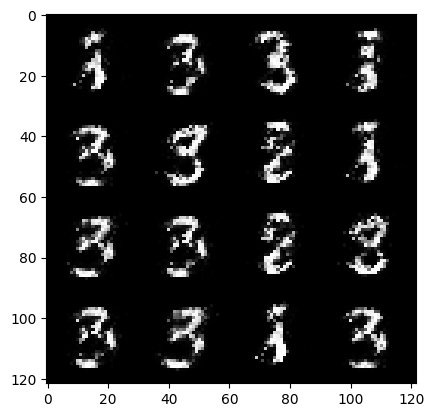

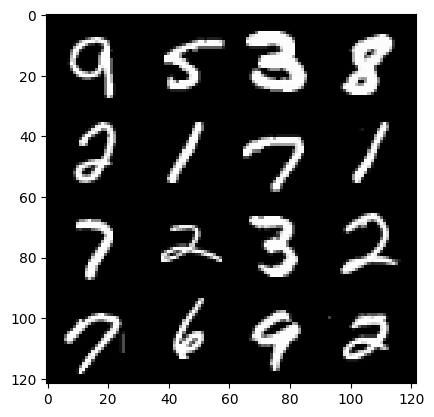

41: step 19500 / Gen loss: 5.946865596771243 / disc_loss: 0.028276669128487524


  0%|          | 0/469 [00:00<?, ?it/s]

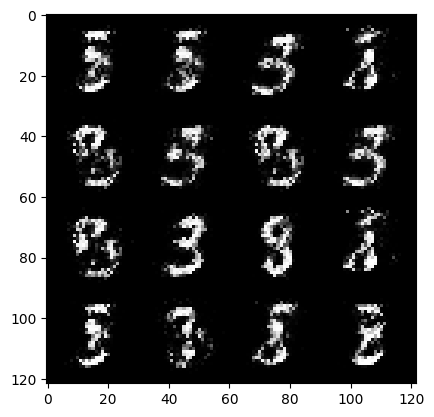

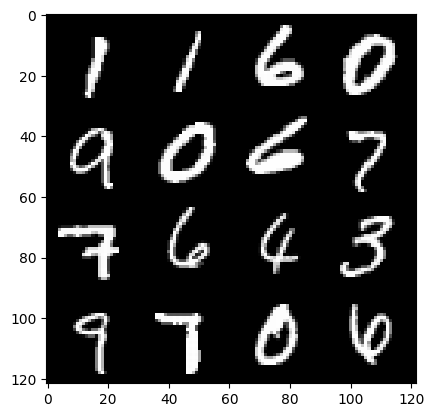

42: step 19800 / Gen loss: 5.982094190915424 / disc_loss: 0.030686416354340794


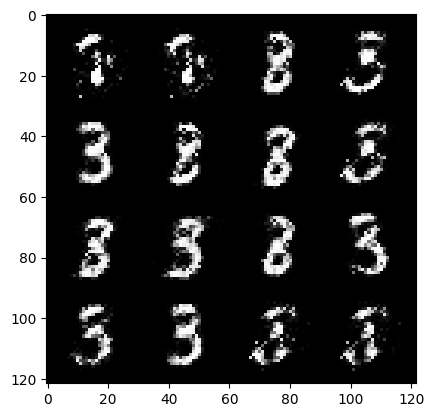

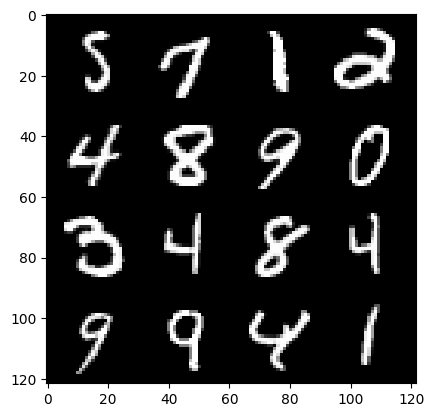

42: step 20100 / Gen loss: 6.078585502306619 / disc_loss: 0.031136724672590696


  0%|          | 0/469 [00:00<?, ?it/s]

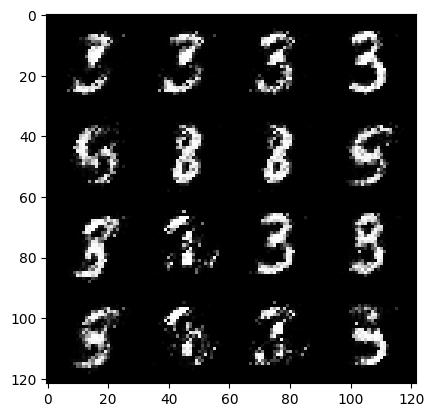

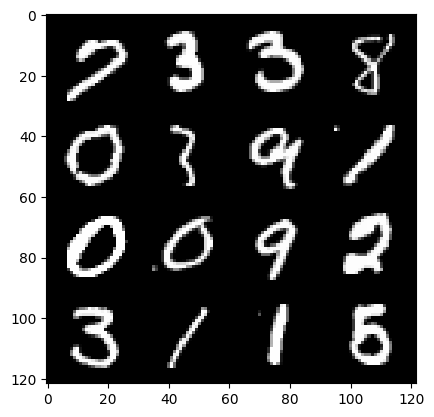

43: step 20400 / Gen loss: 6.153794315656025 / disc_loss: 0.032891190582886344


  0%|          | 0/469 [00:00<?, ?it/s]

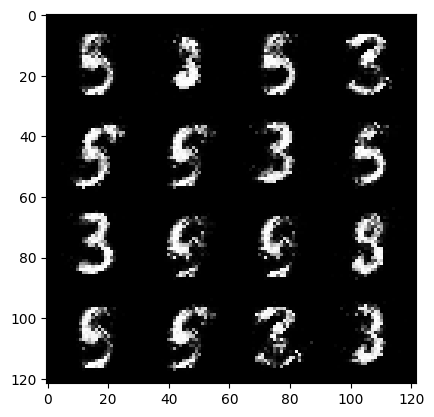

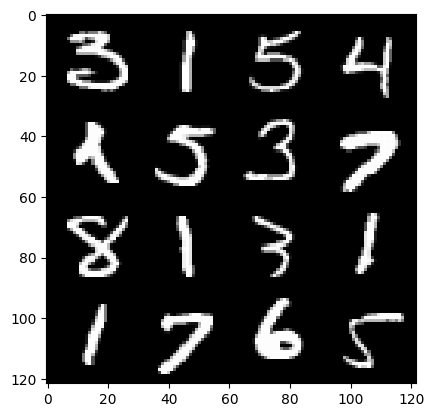

44: step 20700 / Gen loss: 5.832072682380677 / disc_loss: 0.0339058000811686


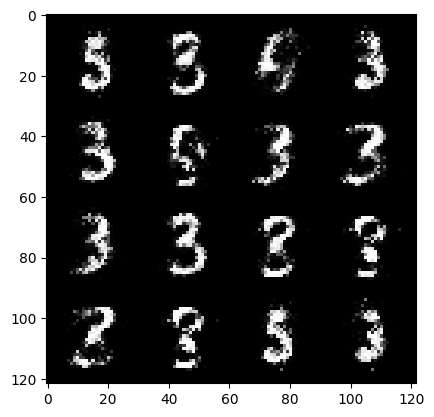

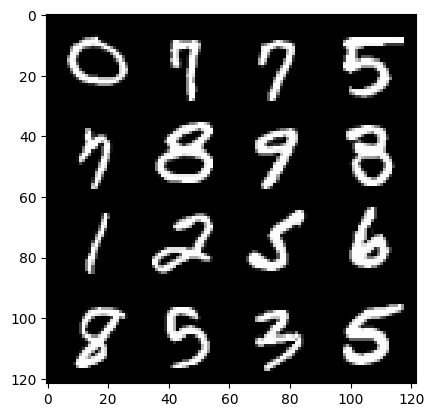

44: step 21000 / Gen loss: 5.670565047264106 / disc_loss: 0.03618653305030121


  0%|          | 0/469 [00:00<?, ?it/s]

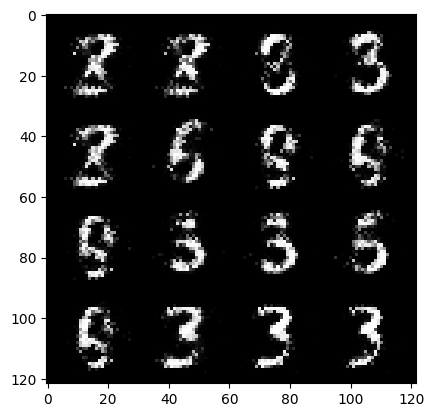

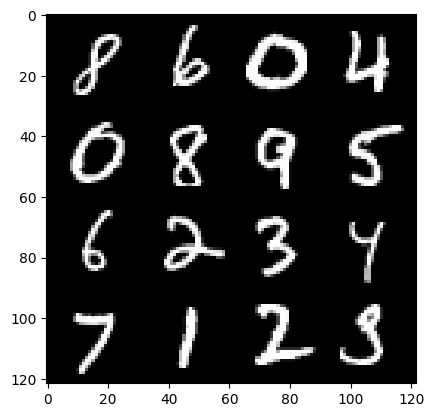

45: step 21300 / Gen loss: 5.873987758954368 / disc_loss: 0.035601082503174765


  0%|          | 0/469 [00:00<?, ?it/s]

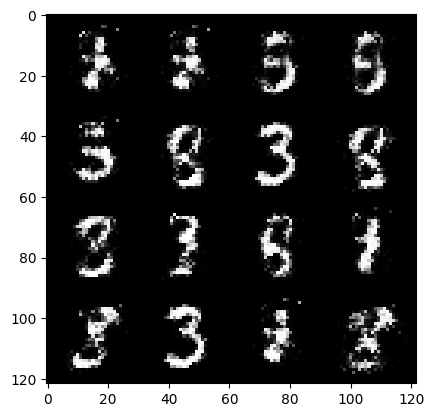

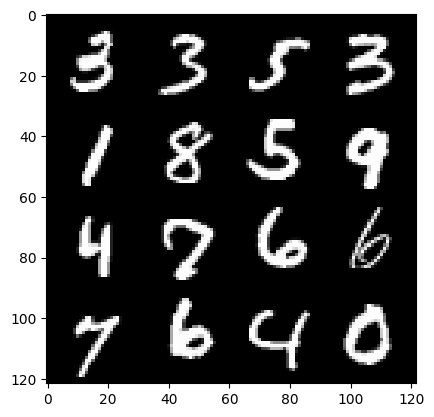

46: step 21600 / Gen loss: 6.183037387530014 / disc_loss: 0.035698276955323925


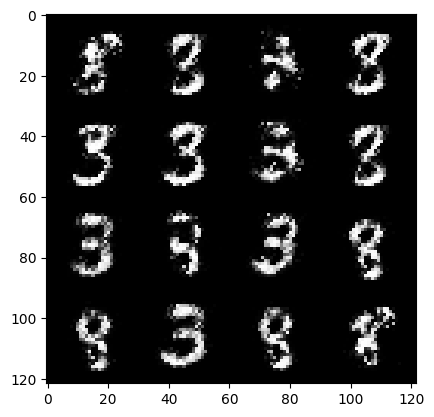

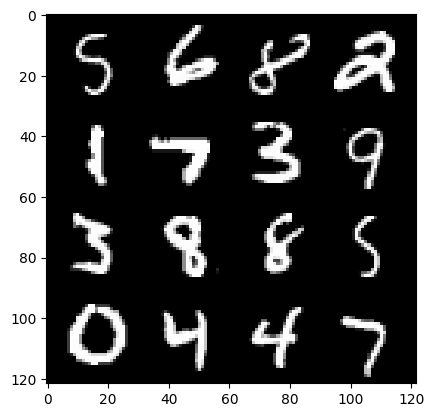

46: step 21900 / Gen loss: 5.98001026153564 / disc_loss: 0.034562948065189045


  0%|          | 0/469 [00:00<?, ?it/s]

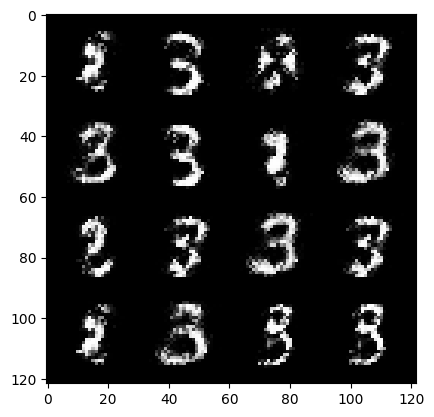

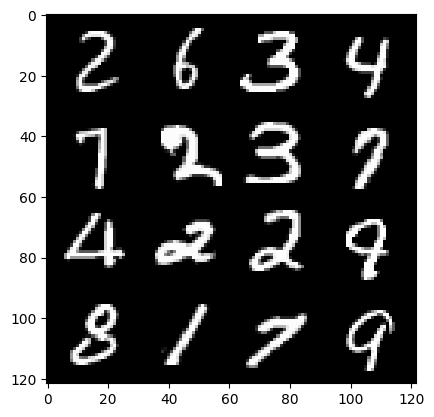

47: step 22200 / Gen loss: 5.454725303649897 / disc_loss: 0.05287718486040831


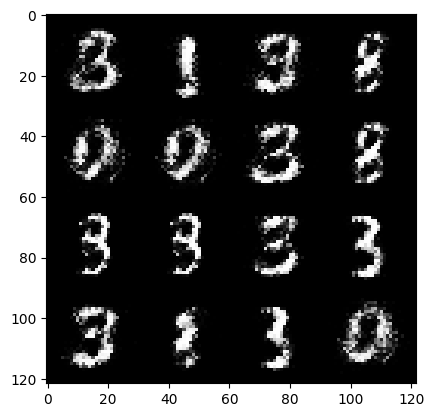

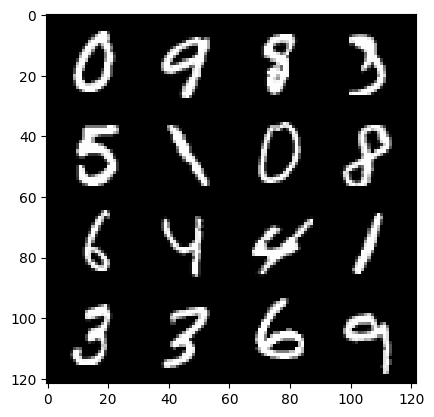

47: step 22500 / Gen loss: 5.311880235671998 / disc_loss: 0.05164930145877103


  0%|          | 0/469 [00:00<?, ?it/s]

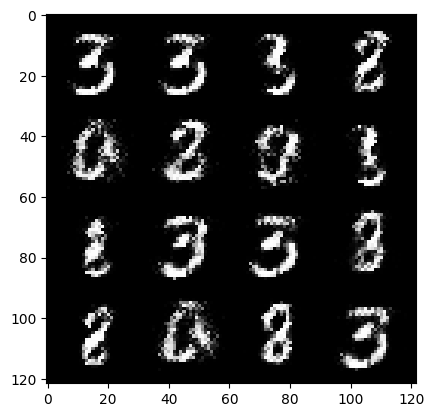

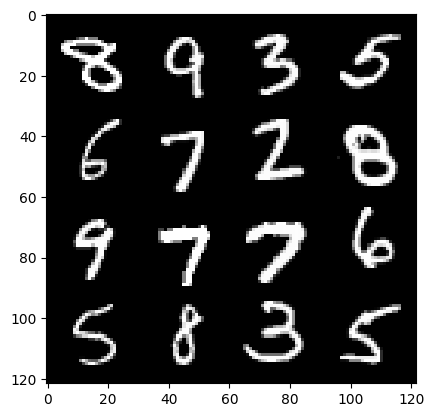

48: step 22800 / Gen loss: 5.394811890920005 / disc_loss: 0.04693386069188518


  0%|          | 0/469 [00:00<?, ?it/s]

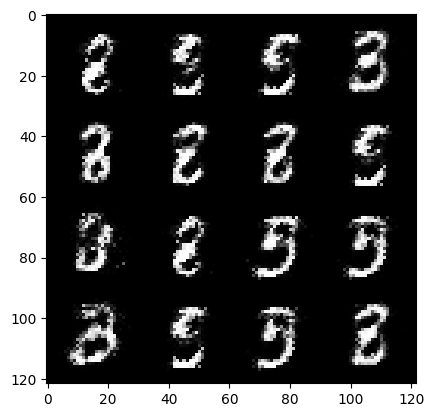

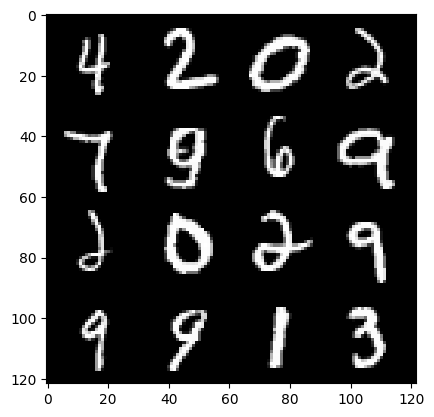

49: step 23100 / Gen loss: 5.521424479484556 / disc_loss: 0.042898073044295125


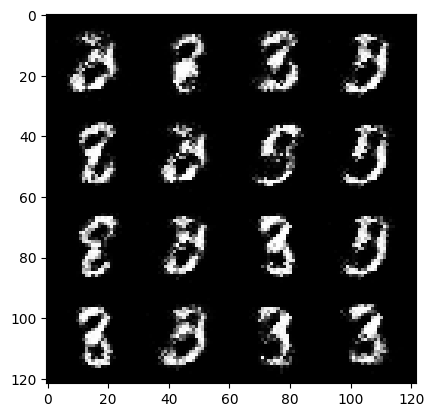

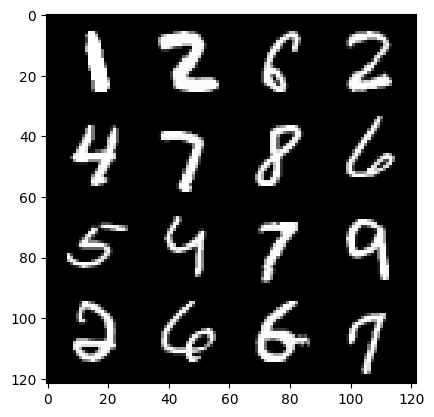

49: step 23400 / Gen loss: 5.353931823571523 / disc_loss: 0.049540310629333055


  0%|          | 0/469 [00:00<?, ?it/s]

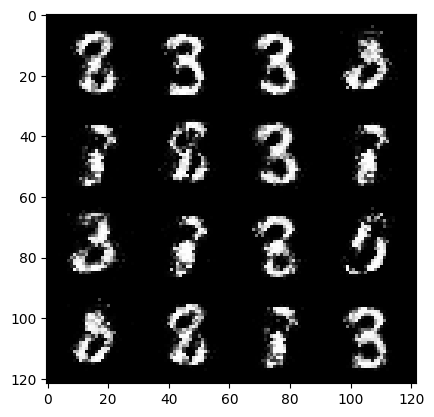

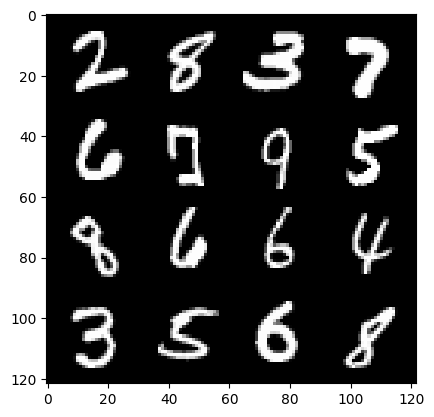

50: step 23700 / Gen loss: 5.144312981764471 / disc_loss: 0.050119033294419434


  0%|          | 0/469 [00:00<?, ?it/s]

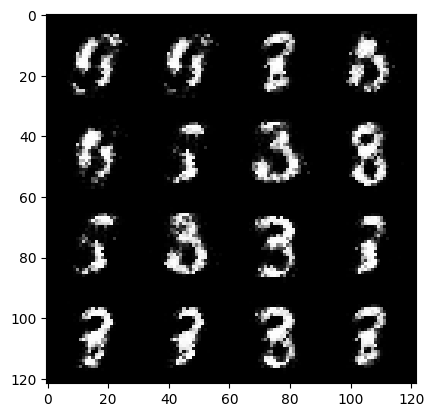

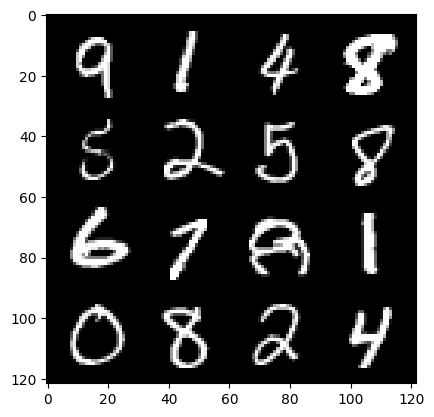

51: step 24000 / Gen loss: 5.1365854438146 / disc_loss: 0.054859258116533284


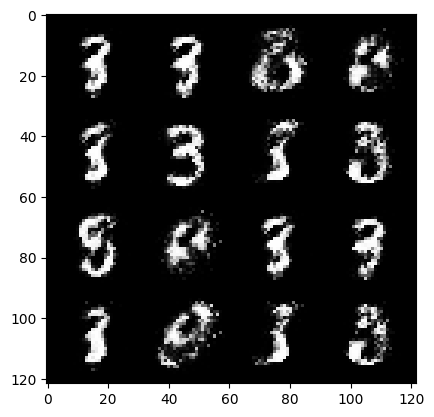

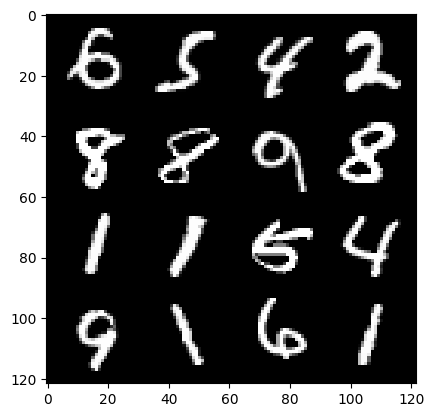

51: step 24300 / Gen loss: 5.348888218402859 / disc_loss: 0.04572268208333602


  0%|          | 0/469 [00:00<?, ?it/s]

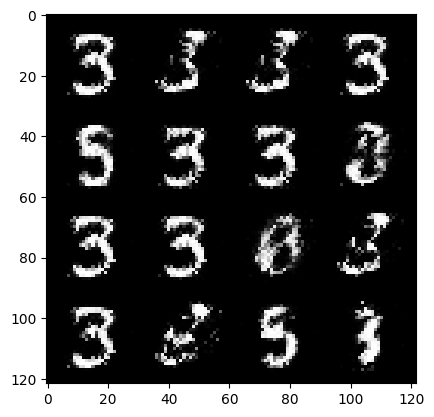

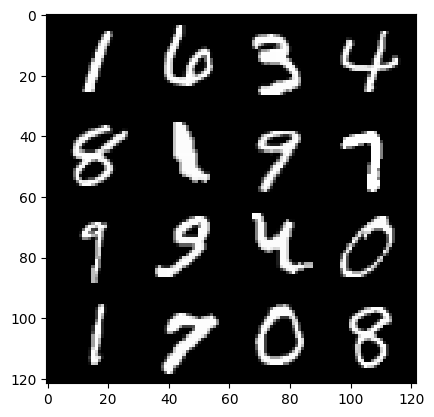

52: step 24600 / Gen loss: 5.533716095288597 / disc_loss: 0.046809531223649774


  0%|          | 0/469 [00:00<?, ?it/s]

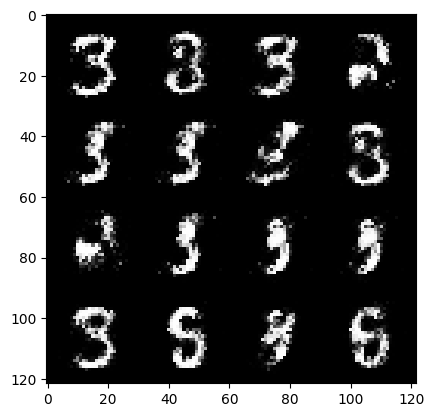

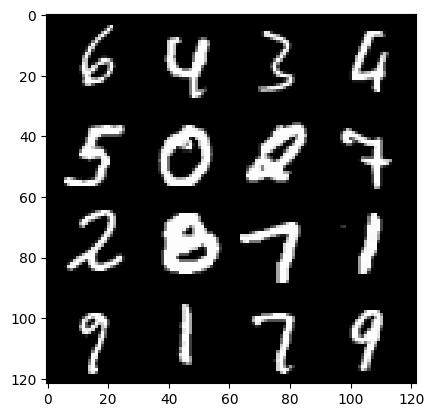

53: step 24900 / Gen loss: 5.721709849039718 / disc_loss: 0.04332202374624709


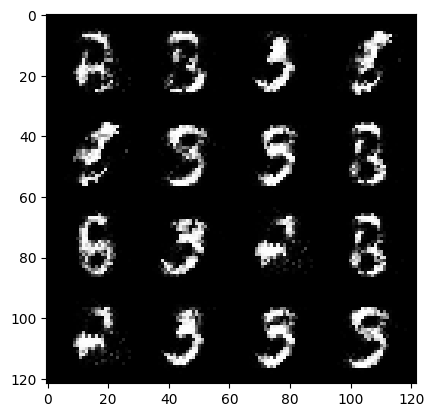

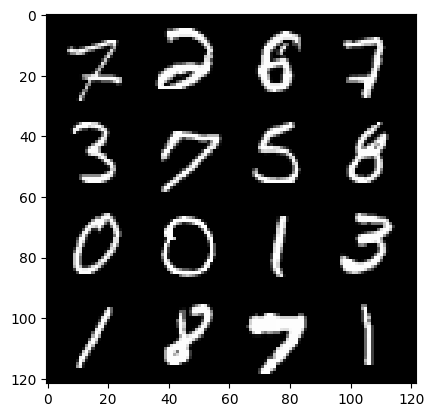

53: step 25200 / Gen loss: 5.715429593722025 / disc_loss: 0.038132239381472255


  0%|          | 0/469 [00:00<?, ?it/s]

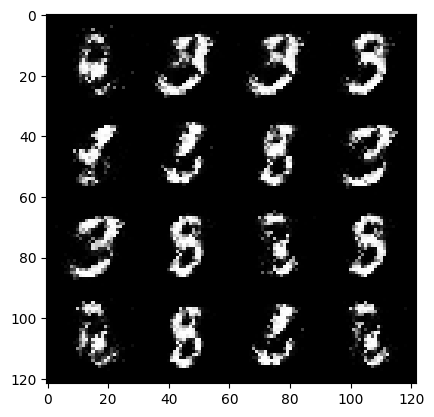

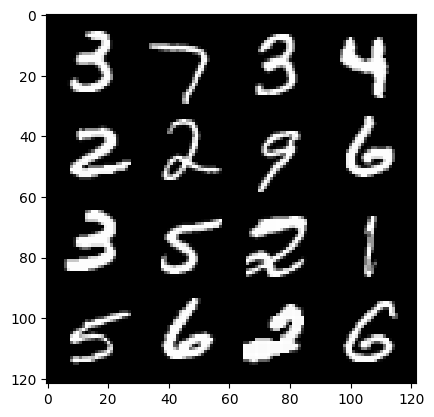

54: step 25500 / Gen loss: 5.740947910944621 / disc_loss: 0.043211668105795964


  0%|          | 0/469 [00:00<?, ?it/s]

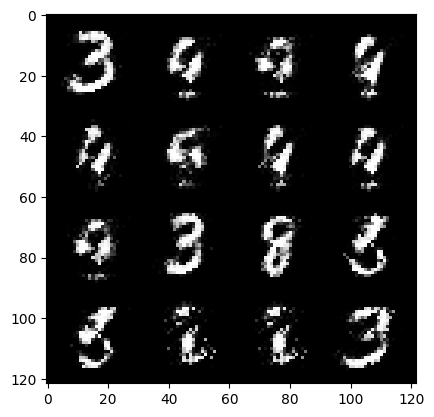

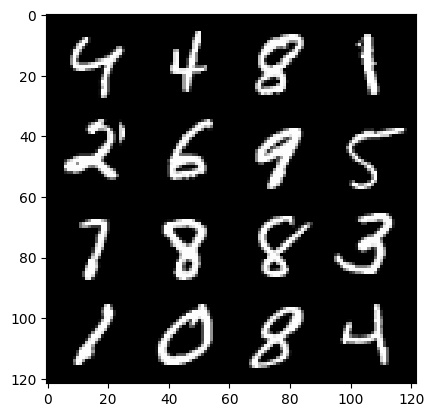

55: step 25800 / Gen loss: 5.621868621508277 / disc_loss: 0.04018580708963177


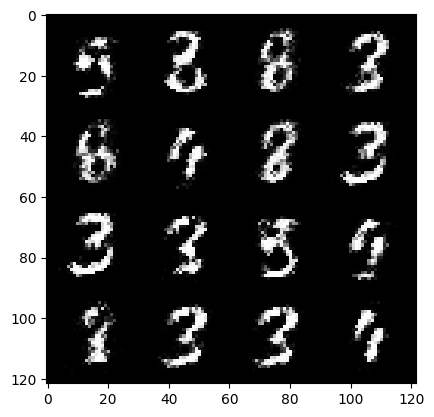

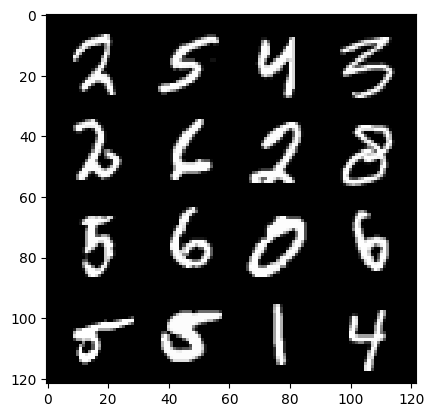

55: step 26100 / Gen loss: 5.327355432510378 / disc_loss: 0.042021136203159885


  0%|          | 0/469 [00:00<?, ?it/s]

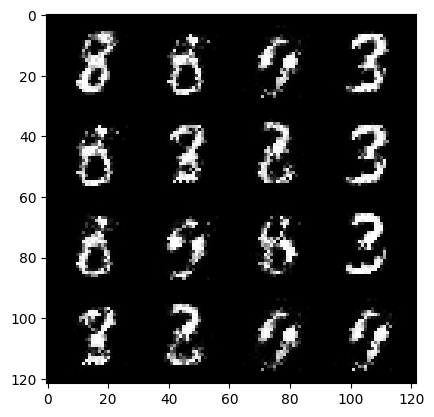

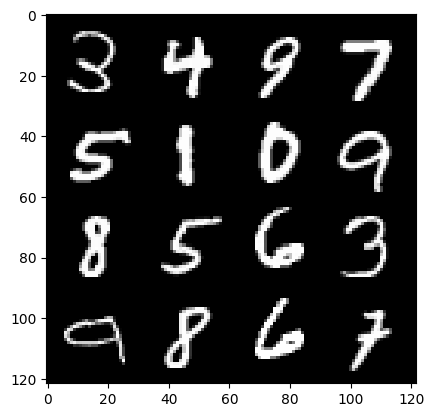

56: step 26400 / Gen loss: 5.814798407554625 / disc_loss: 0.03662991539730381


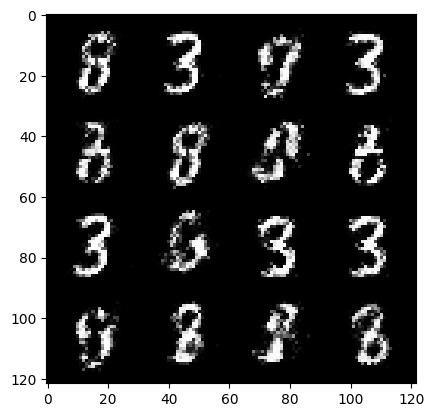

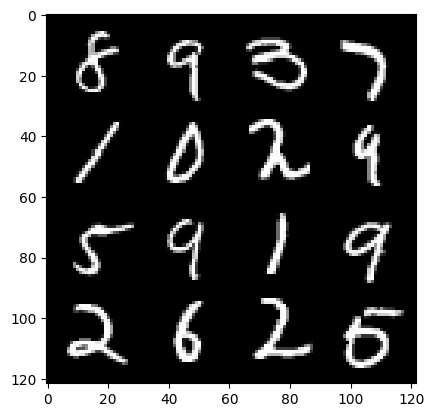

56: step 26700 / Gen loss: 6.115904421806334 / disc_loss: 0.04570429837020735


  0%|          | 0/469 [00:00<?, ?it/s]

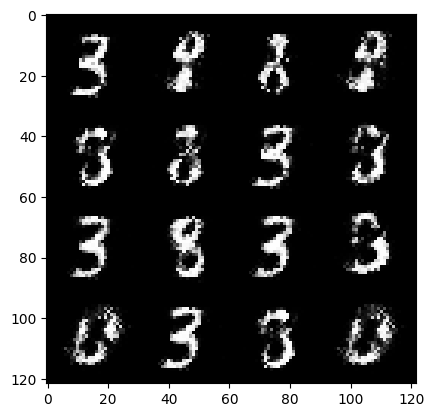

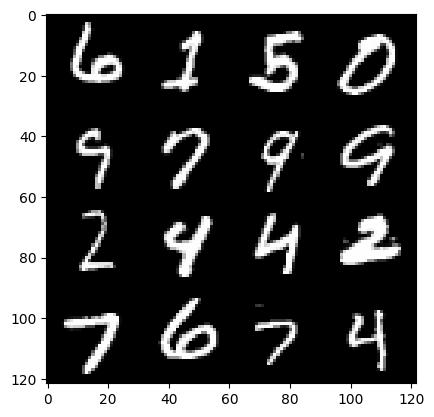

57: step 27000 / Gen loss: 5.630208174387613 / disc_loss: 0.0544727354931335


  0%|          | 0/469 [00:00<?, ?it/s]

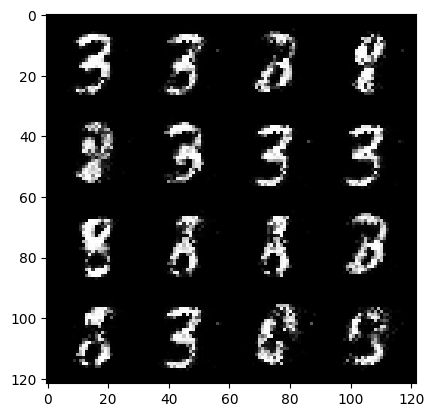

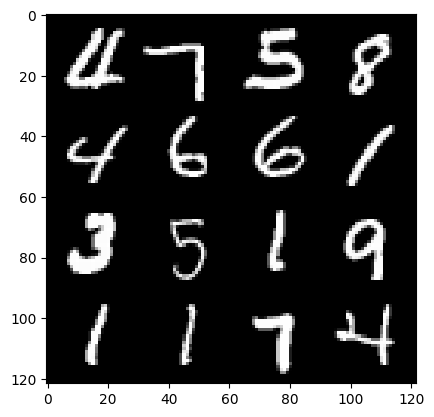

58: step 27300 / Gen loss: 5.368816860516862 / disc_loss: 0.05860281219085059


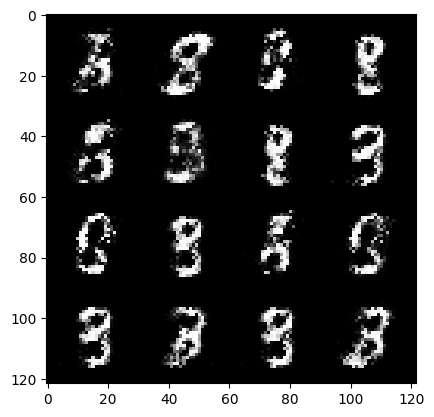

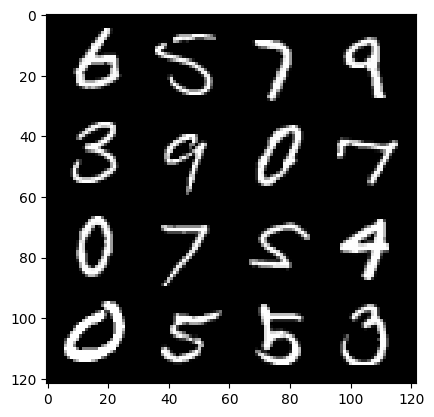

58: step 27600 / Gen loss: 5.680239089330038 / disc_loss: 0.04187591142642002


  0%|          | 0/469 [00:00<?, ?it/s]

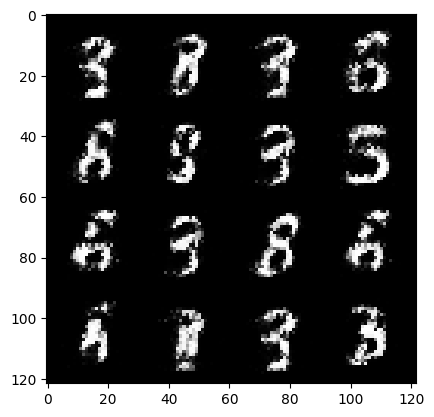

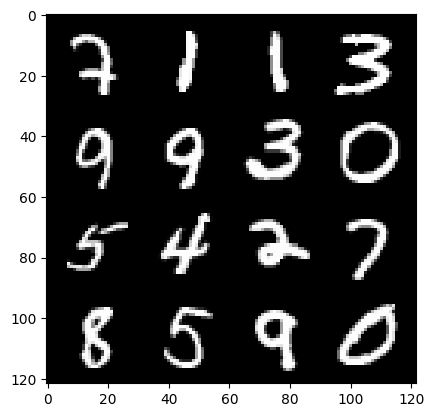

59: step 27900 / Gen loss: 5.574179331461589 / disc_loss: 0.05695310924823084


  0%|          | 0/469 [00:00<?, ?it/s]

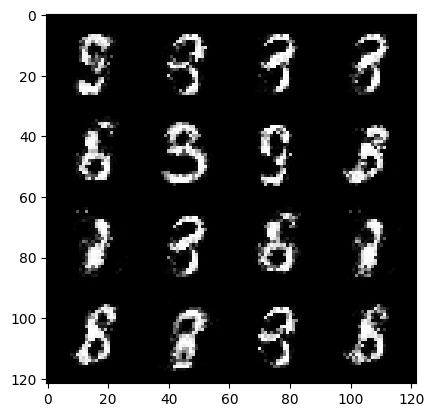

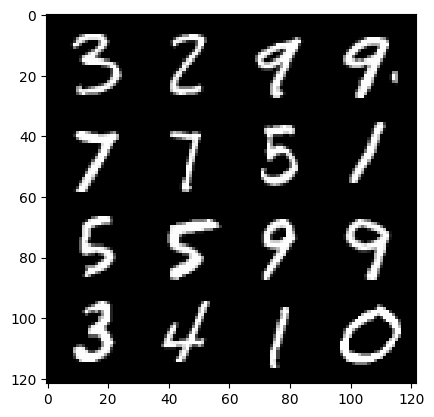

60: step 28200 / Gen loss: 5.1189898204803495 / disc_loss: 0.061410021508733426


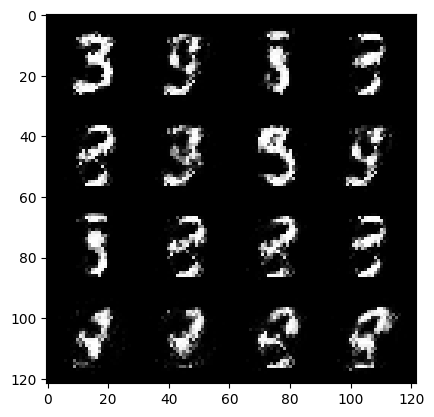

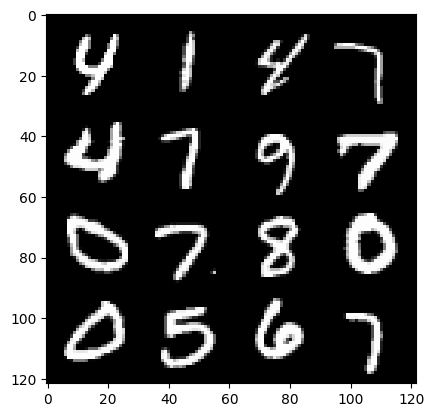

60: step 28500 / Gen loss: 5.176190474828084 / disc_loss: 0.05751978372223681


  0%|          | 0/469 [00:00<?, ?it/s]

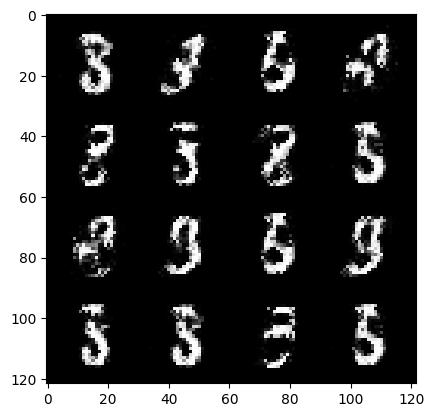

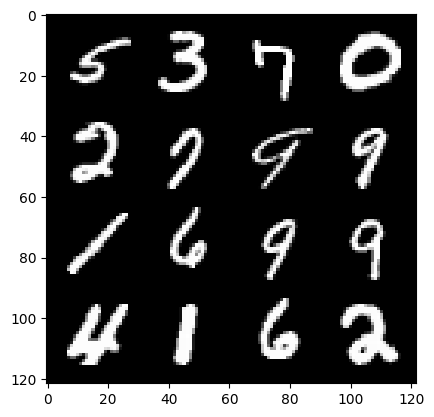

61: step 28800 / Gen loss: 5.2356522878011065 / disc_loss: 0.056438538034756985


  0%|          | 0/469 [00:00<?, ?it/s]

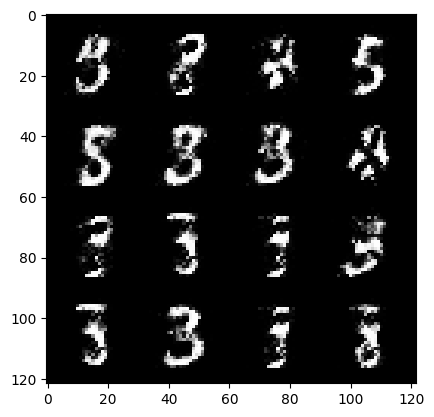

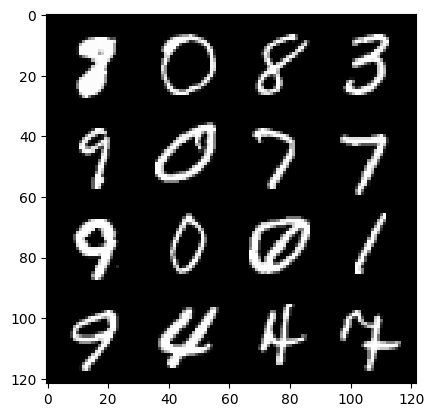

62: step 29100 / Gen loss: 5.2444379361470554 / disc_loss: 0.059386440285791965


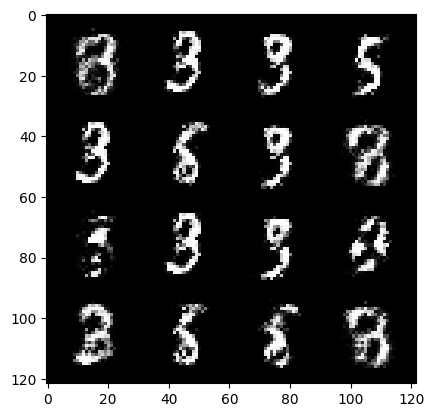

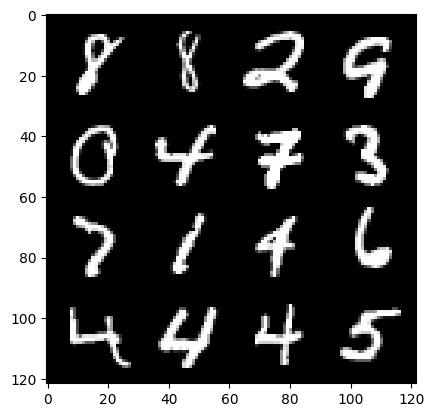

62: step 29400 / Gen loss: 4.700498070716859 / disc_loss: 0.07189982116222378


  0%|          | 0/469 [00:00<?, ?it/s]

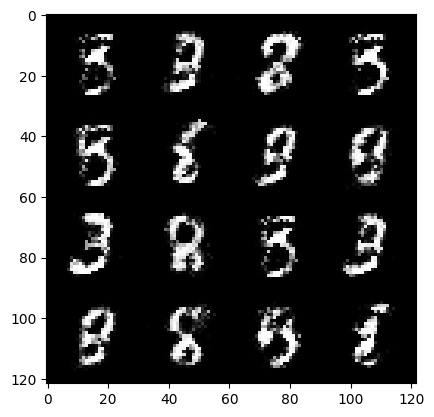

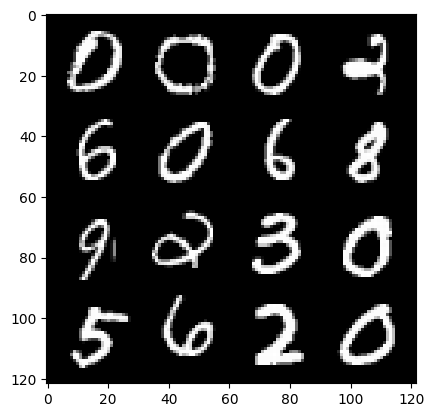

63: step 29700 / Gen loss: 4.837873970667522 / disc_loss: 0.06123457747822004


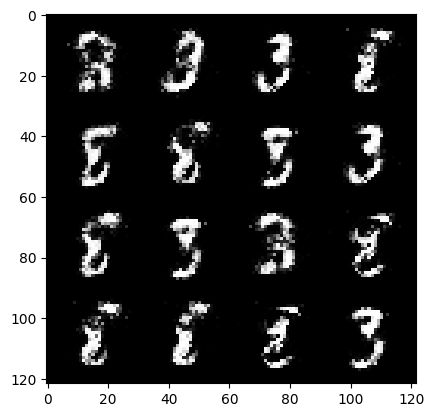

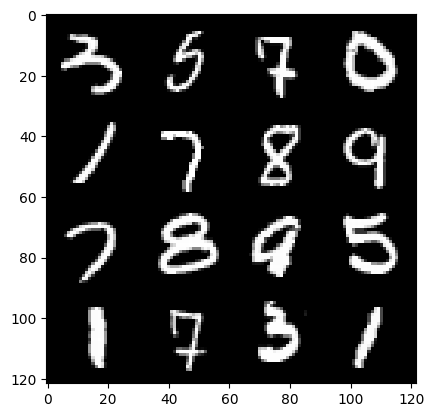

63: step 30000 / Gen loss: 4.962923076152803 / disc_loss: 0.062118878864372784


  0%|          | 0/469 [00:00<?, ?it/s]

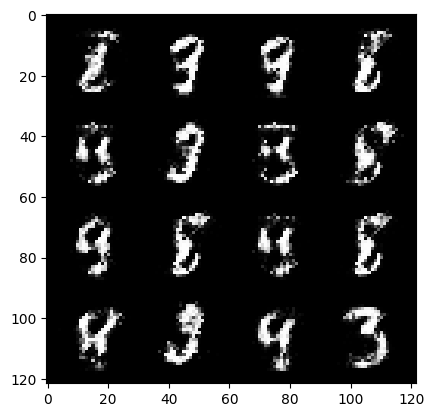

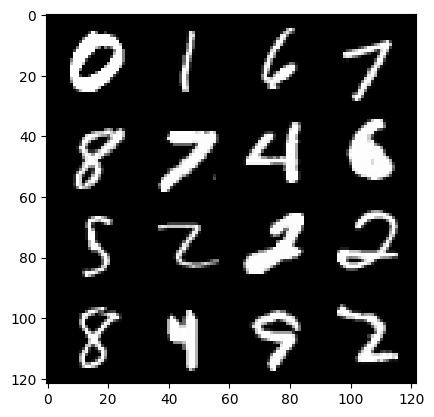

64: step 30300 / Gen loss: 5.014979507923126 / disc_loss: 0.06020144396151104


  0%|          | 0/469 [00:00<?, ?it/s]

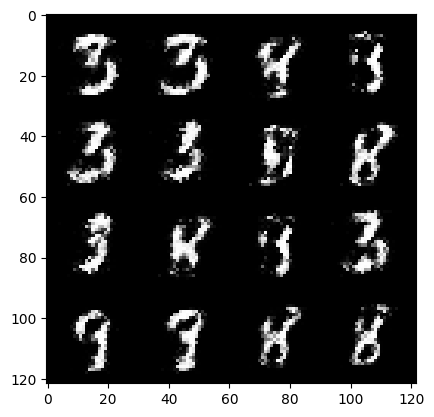

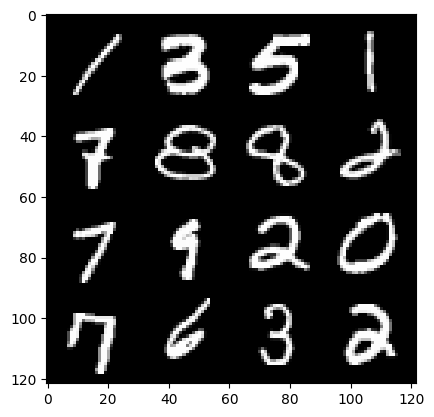

65: step 30600 / Gen loss: 4.940500521659852 / disc_loss: 0.07330431946863727


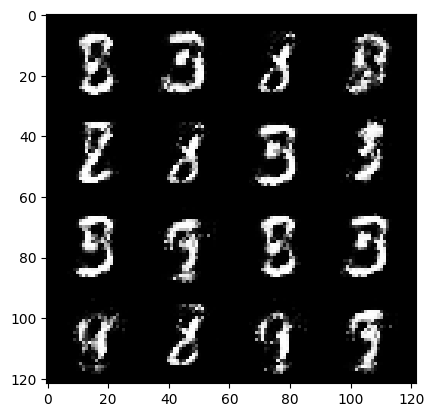

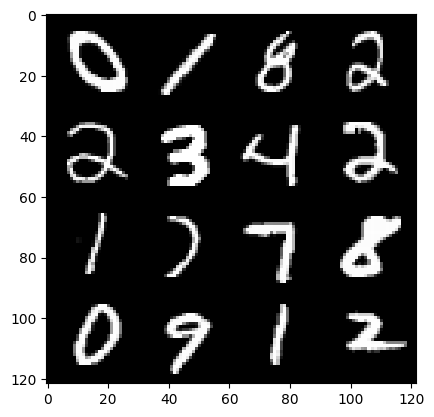

65: step 30900 / Gen loss: 4.5733145904541015 / disc_loss: 0.0648872127259771


  0%|          | 0/469 [00:00<?, ?it/s]

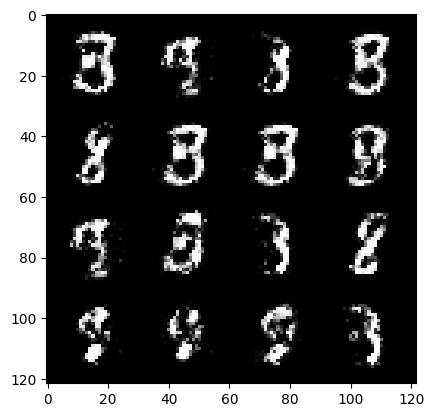

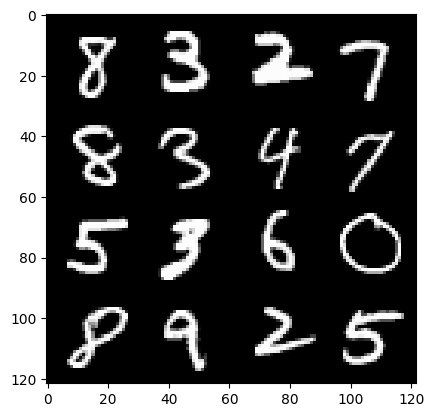

66: step 31200 / Gen loss: 5.06313133716583 / disc_loss: 0.05869050045808156


  0%|          | 0/469 [00:00<?, ?it/s]

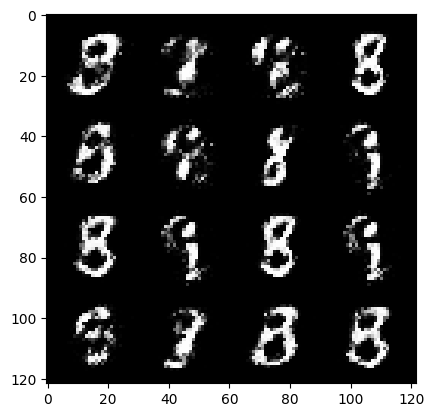

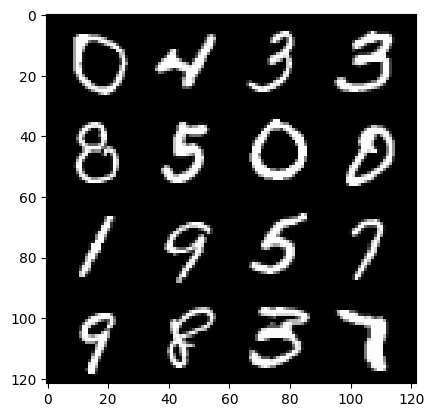

67: step 31500 / Gen loss: 4.860030391216276 / disc_loss: 0.07469877626436455


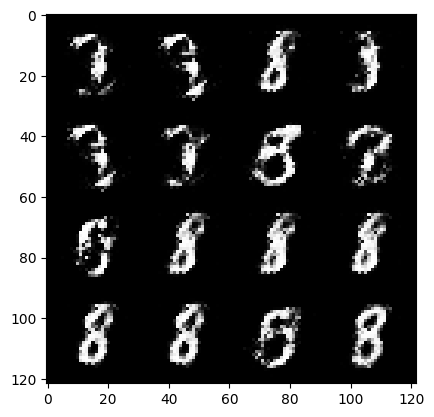

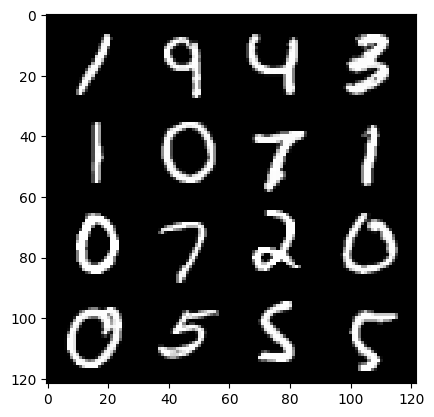

67: step 31800 / Gen loss: 5.136346195538837 / disc_loss: 0.07427798839285969


  0%|          | 0/469 [00:00<?, ?it/s]

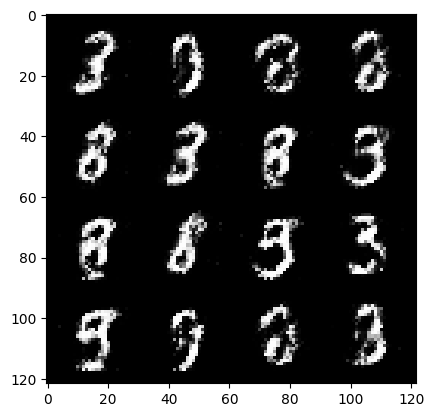

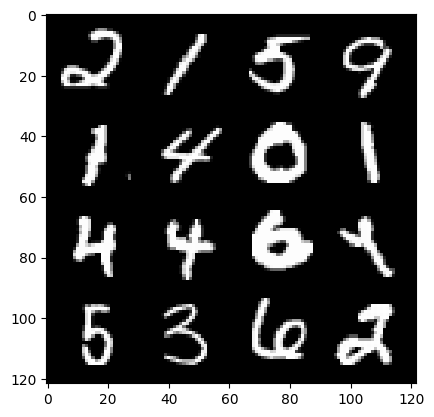

68: step 32100 / Gen loss: 4.901043225924172 / disc_loss: 0.06459645603472991


  0%|          | 0/469 [00:00<?, ?it/s]

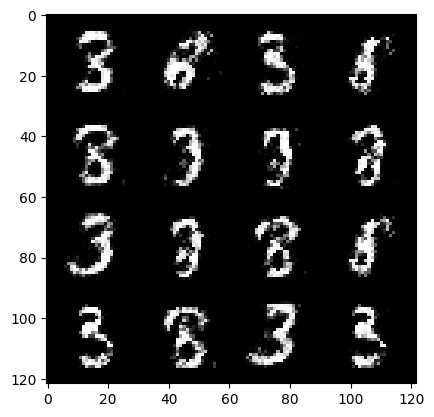

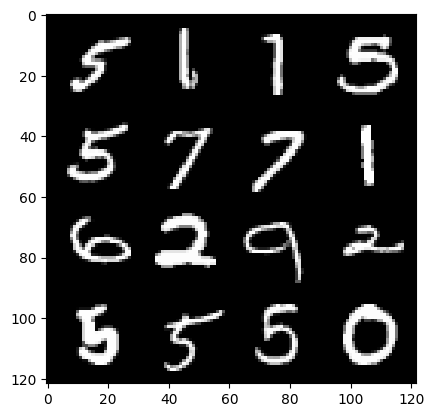

69: step 32400 / Gen loss: 4.845543243090312 / disc_loss: 0.07410717686638234


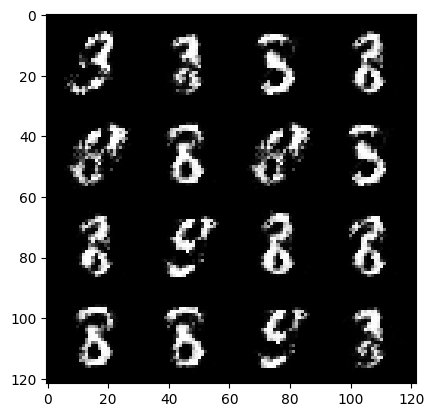

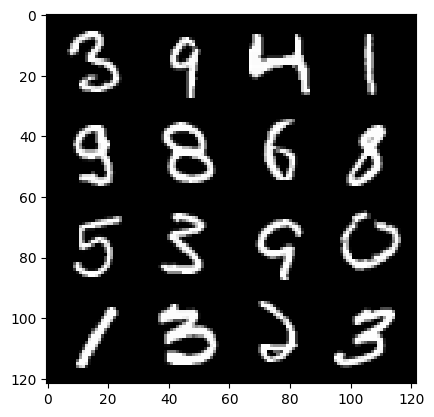

69: step 32700 / Gen loss: 5.057487018108366 / disc_loss: 0.08194485098123556


  0%|          | 0/469 [00:00<?, ?it/s]

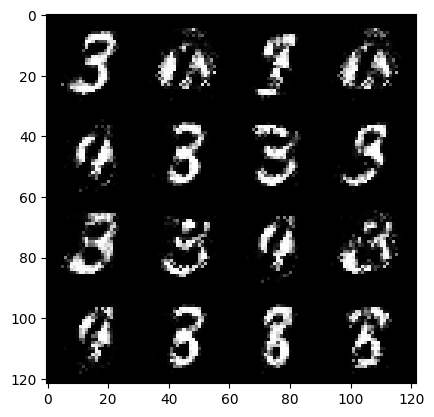

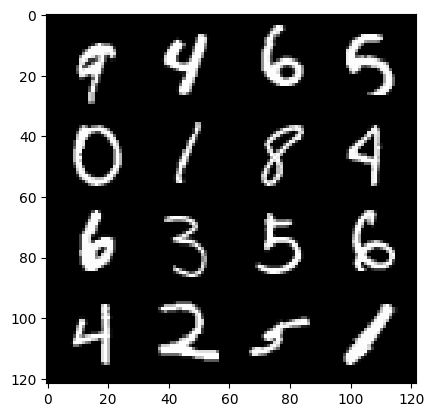

70: step 33000 / Gen loss: 4.561329306761422 / disc_loss: 0.09146694699302312


  0%|          | 0/469 [00:00<?, ?it/s]

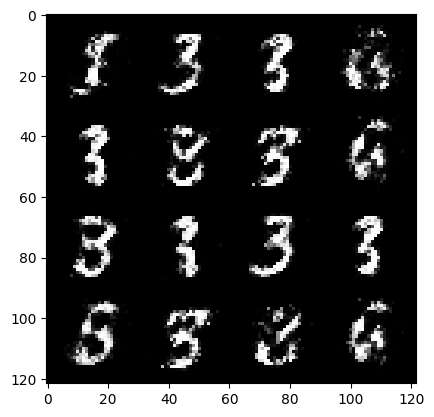

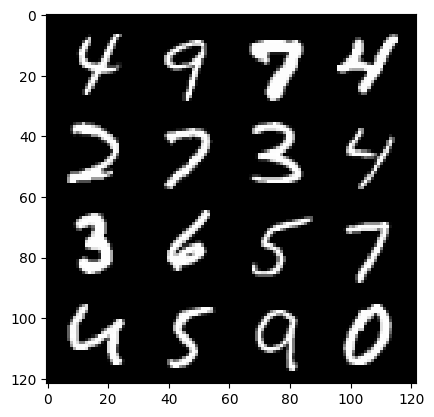

71: step 33300 / Gen loss: 4.701556712786356 / disc_loss: 0.08039329754809538


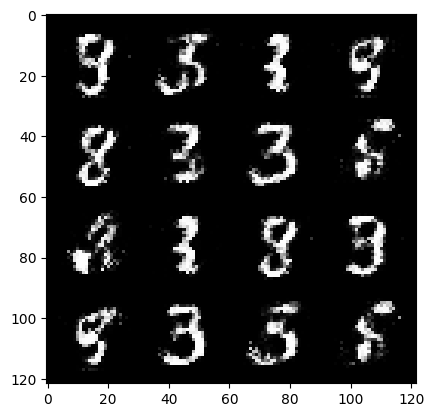

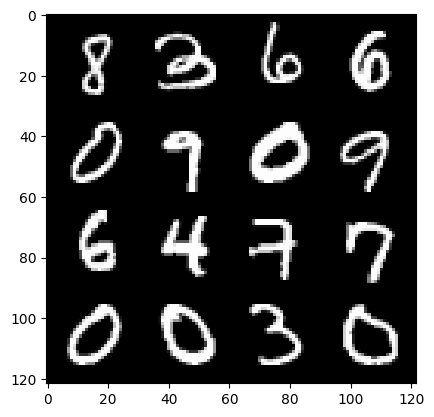

71: step 33600 / Gen loss: 4.863368590672809 / disc_loss: 0.07505781731878715


  0%|          | 0/469 [00:00<?, ?it/s]

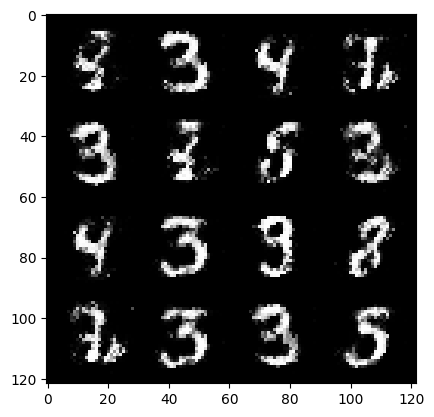

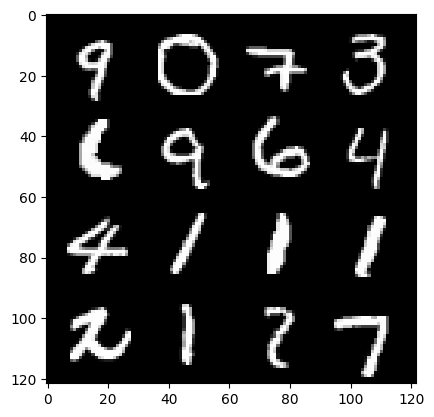

72: step 33900 / Gen loss: 4.640275076230369 / disc_loss: 0.09028959331413114


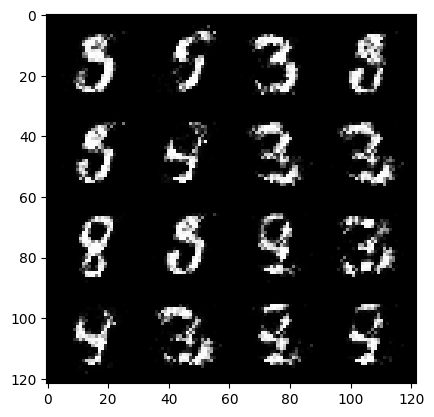

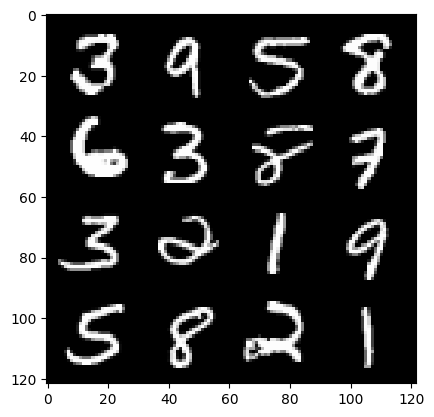

72: step 34200 / Gen loss: 4.591287207603456 / disc_loss: 0.082627239090701


  0%|          | 0/469 [00:00<?, ?it/s]

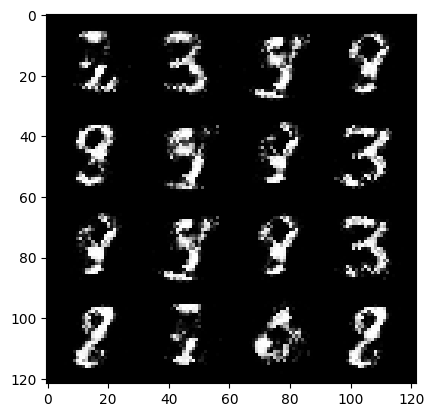

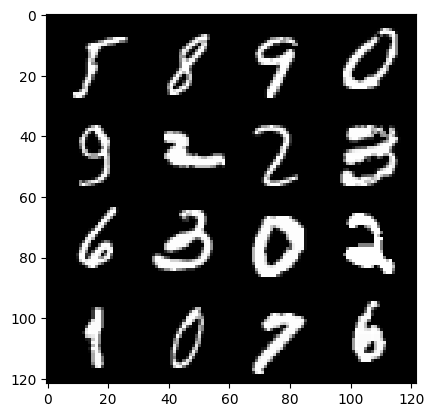

73: step 34500 / Gen loss: 4.642216627597811 / disc_loss: 0.07508378969505425


  0%|          | 0/469 [00:00<?, ?it/s]

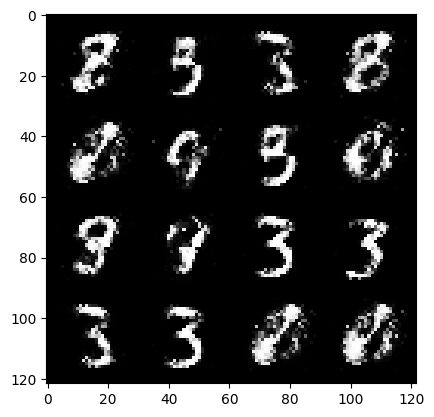

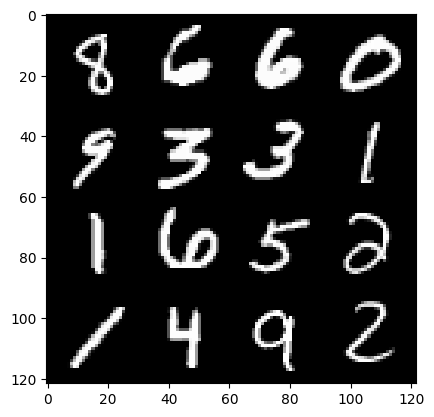

74: step 34800 / Gen loss: 4.608431997299194 / disc_loss: 0.0687552253405253


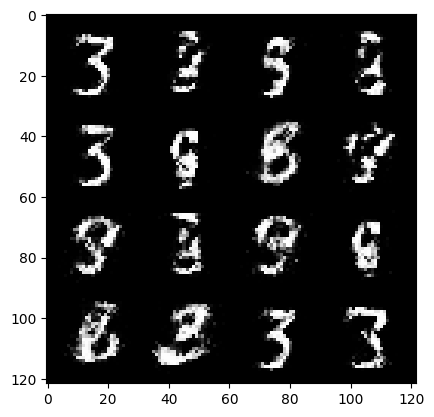

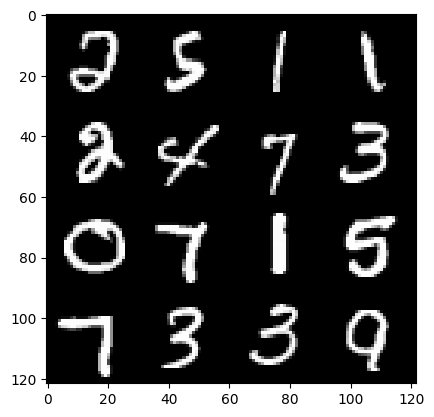

74: step 35100 / Gen loss: 4.553080770969389 / disc_loss: 0.07559627631679171


  0%|          | 0/469 [00:00<?, ?it/s]

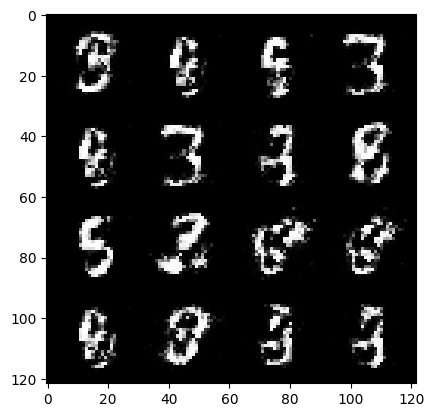

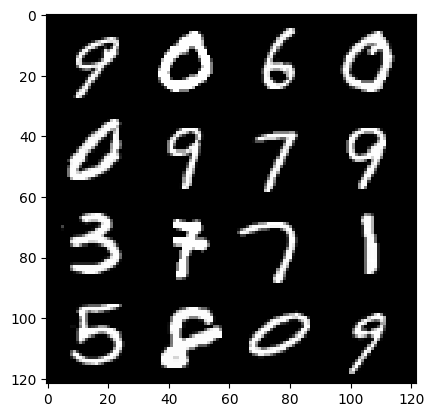

75: step 35400 / Gen loss: 4.837673539320626 / disc_loss: 0.07177797539159654


  0%|          | 0/469 [00:00<?, ?it/s]

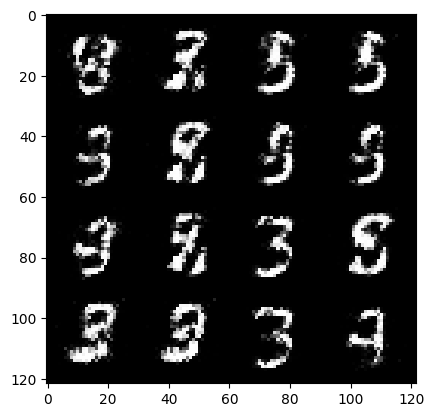

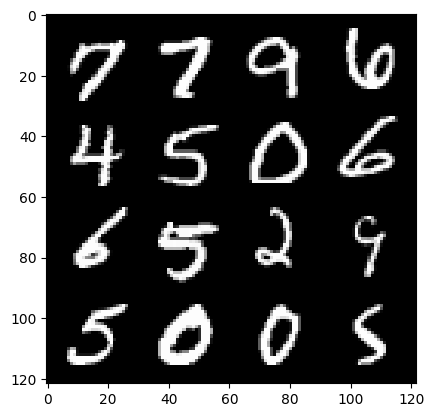

76: step 35700 / Gen loss: 4.965302894115447 / disc_loss: 0.07140516106660173


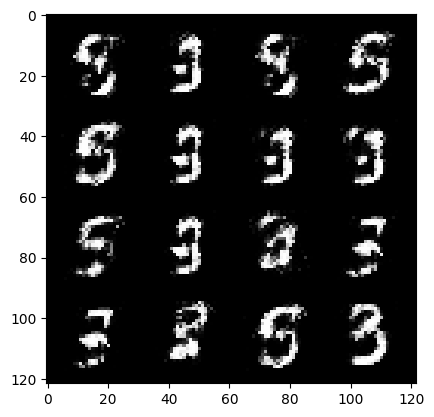

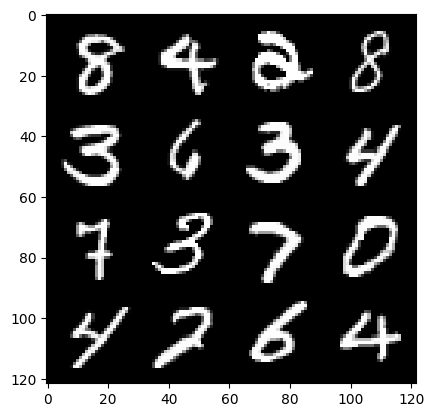

76: step 36000 / Gen loss: 4.884286328951519 / disc_loss: 0.07290394322946663


  0%|          | 0/469 [00:00<?, ?it/s]

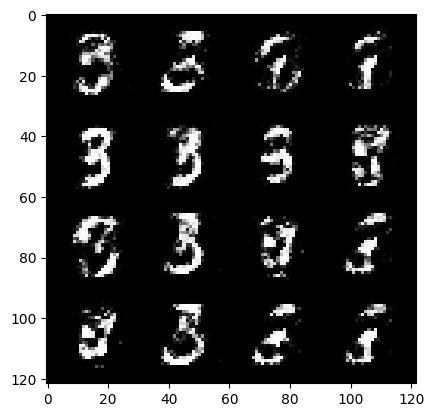

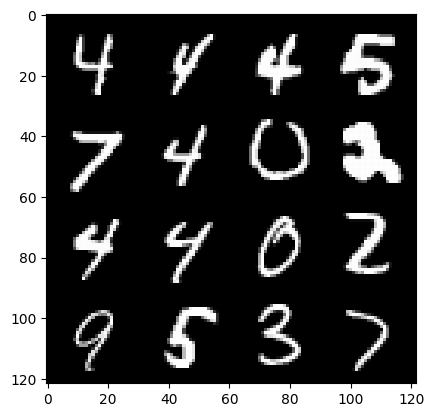

77: step 36300 / Gen loss: 4.674886747201285 / disc_loss: 0.06652329114576183


  0%|          | 0/469 [00:00<?, ?it/s]

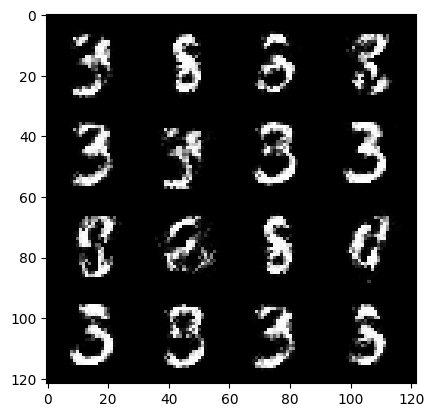

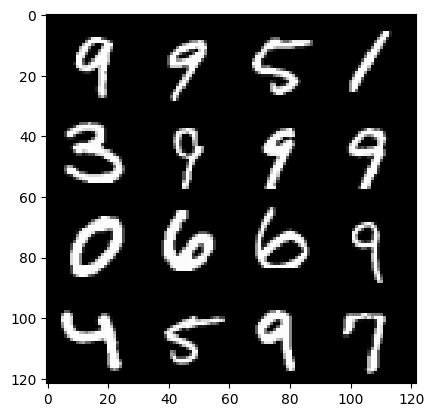

78: step 36600 / Gen loss: 4.900445894400278 / disc_loss: 0.07588682011390727


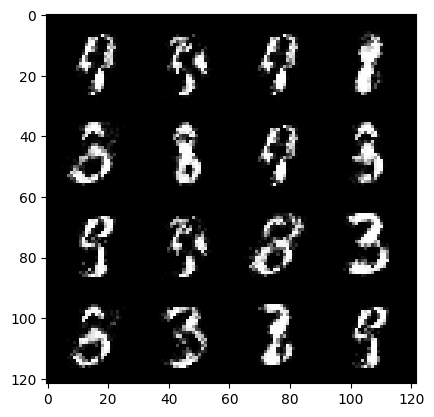

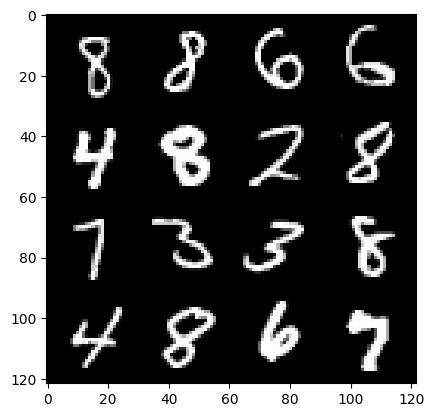

78: step 36900 / Gen loss: 4.590420581499735 / disc_loss: 0.09161606058478354


  0%|          | 0/469 [00:00<?, ?it/s]

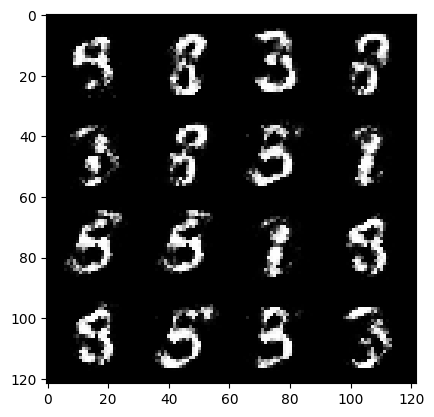

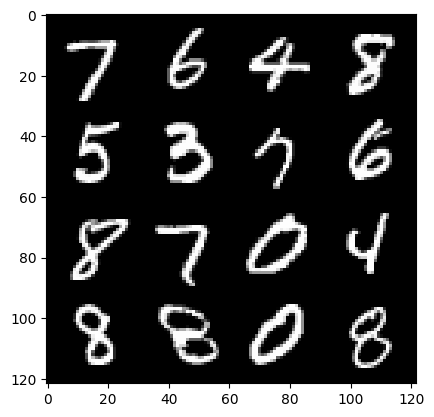

79: step 37200 / Gen loss: 4.4420221400260935 / disc_loss: 0.09041577012588581


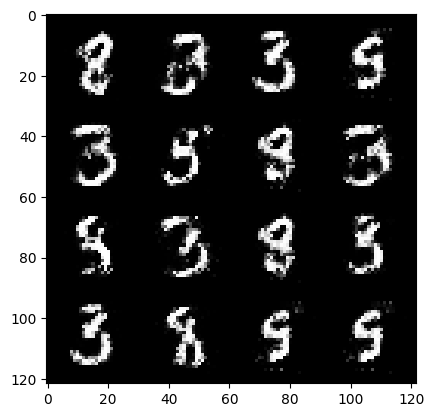

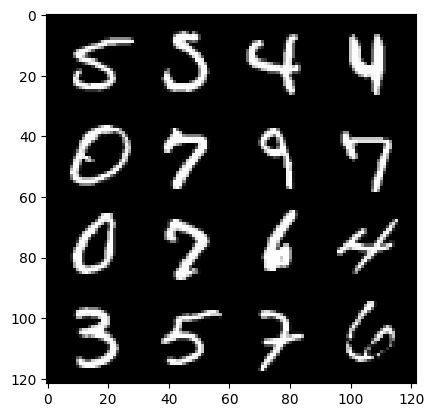

79: step 37500 / Gen loss: 4.359178903897604 / disc_loss: 0.08071294399599235


  0%|          | 0/469 [00:00<?, ?it/s]

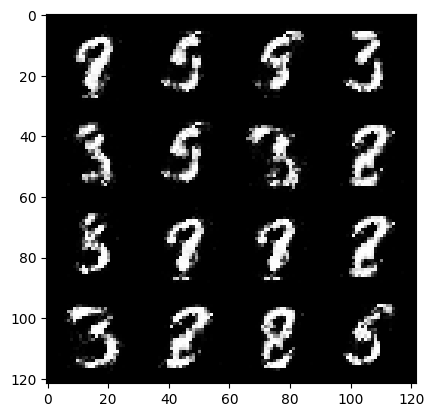

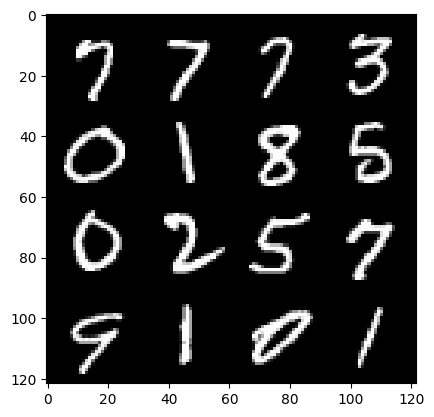

80: step 37800 / Gen loss: 4.468293321132657 / disc_loss: 0.06973624933511022


  0%|          | 0/469 [00:00<?, ?it/s]

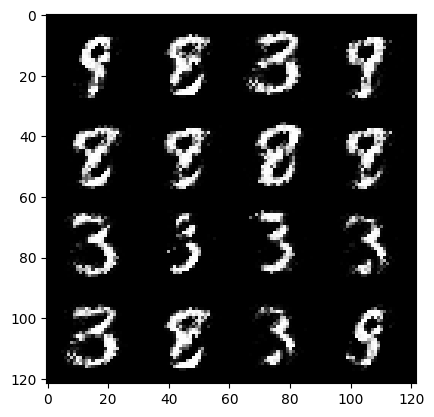

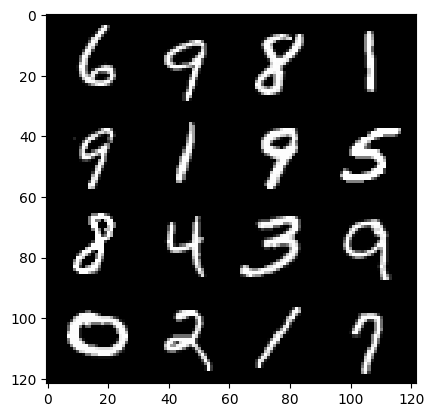

81: step 38100 / Gen loss: 4.67698643922806 / disc_loss: 0.07057942970966298


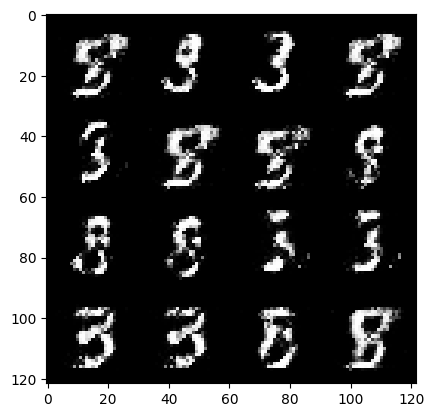

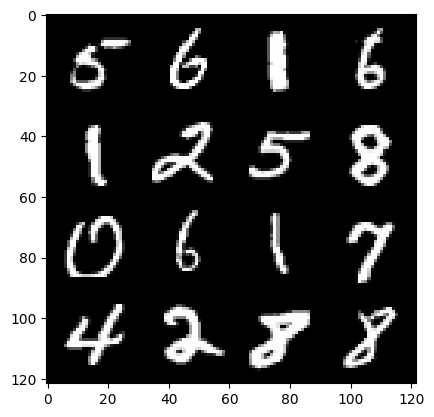

81: step 38400 / Gen loss: 4.7673094550768536 / disc_loss: 0.07782368030399092


  0%|          | 0/469 [00:00<?, ?it/s]

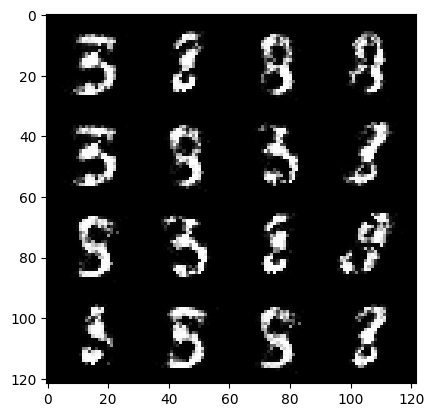

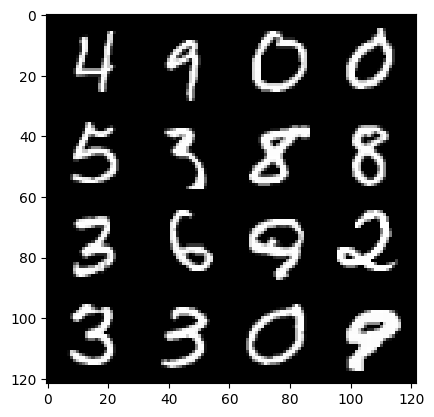

82: step 38700 / Gen loss: 4.4108247168858865 / disc_loss: 0.09290937300771478


  0%|          | 0/469 [00:00<?, ?it/s]

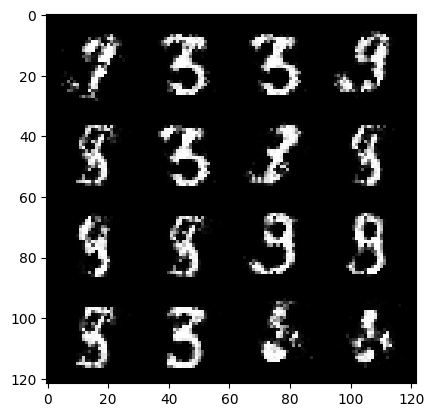

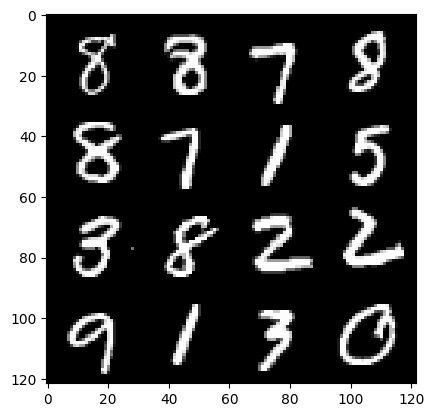

83: step 39000 / Gen loss: 4.354310324192049 / disc_loss: 0.102932872561117


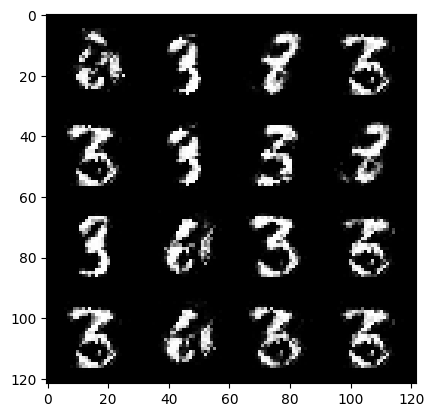

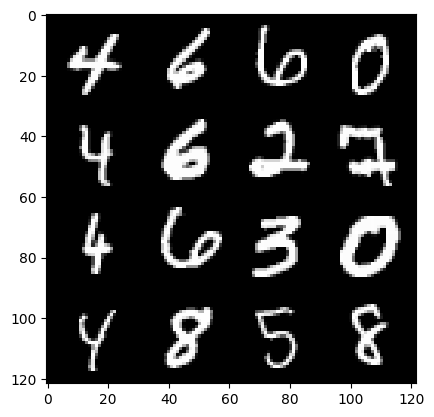

83: step 39300 / Gen loss: 4.314871842066448 / disc_loss: 0.09482589311897756


  0%|          | 0/469 [00:00<?, ?it/s]

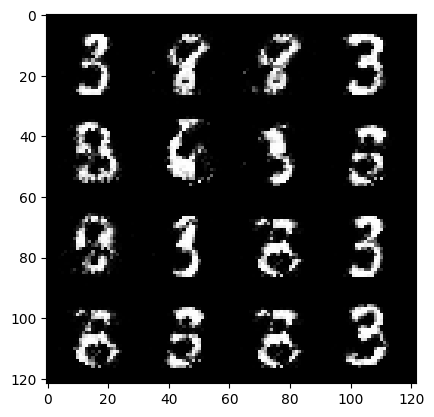

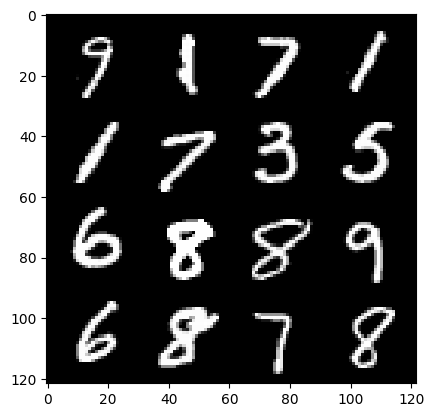

84: step 39600 / Gen loss: 4.374575668176013 / disc_loss: 0.08609387177353106


  0%|          | 0/469 [00:00<?, ?it/s]

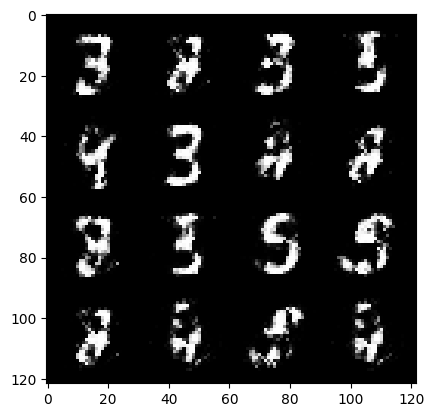

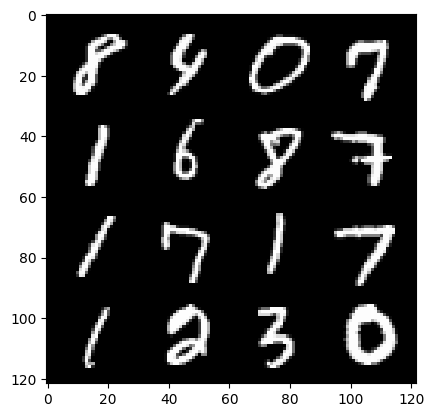

85: step 39900 / Gen loss: 4.02736493508021 / disc_loss: 0.10518452512721221


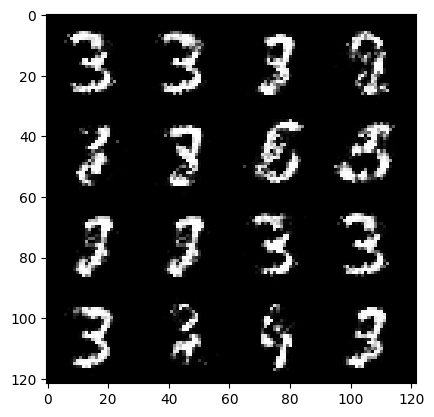

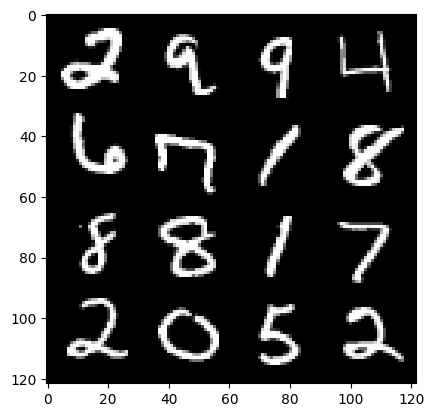

85: step 40200 / Gen loss: 4.20948459704717 / disc_loss: 0.10037363849580284


  0%|          | 0/469 [00:00<?, ?it/s]

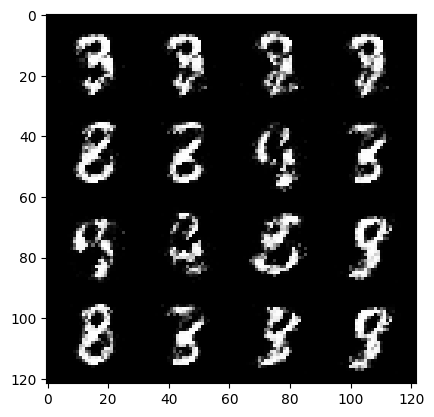

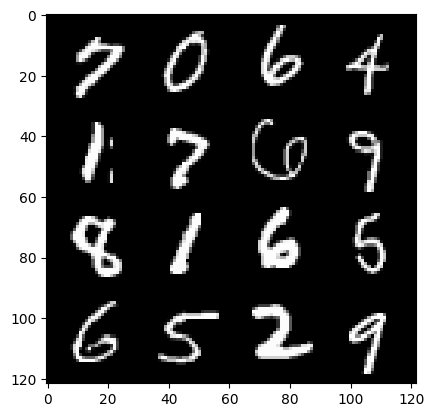

86: step 40500 / Gen loss: 4.140005680720012 / disc_loss: 0.10808318332458536


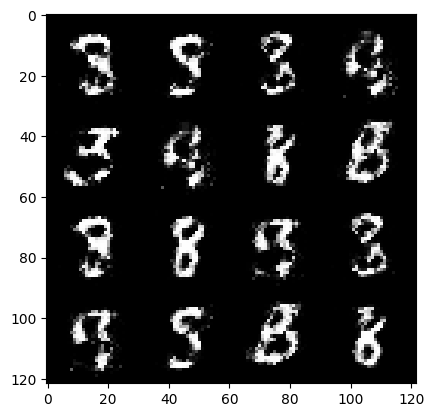

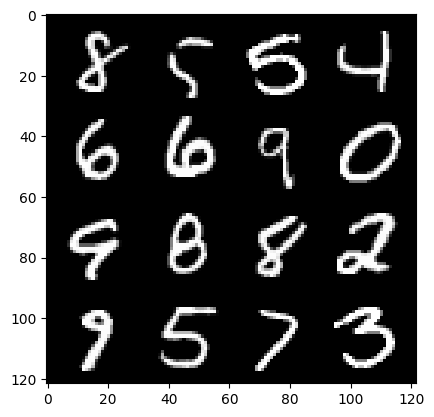

86: step 40800 / Gen loss: 4.23273951292038 / disc_loss: 0.09942037377506491


  0%|          | 0/469 [00:00<?, ?it/s]

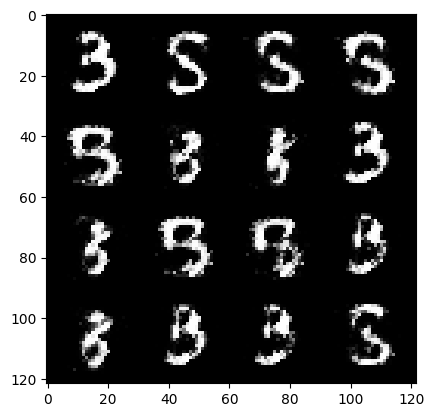

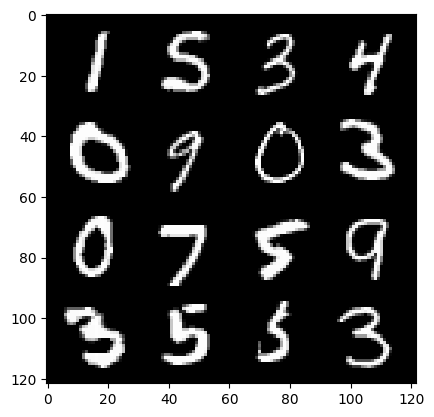

87: step 41100 / Gen loss: 4.3337200864156085 / disc_loss: 0.09175145402550693


  0%|          | 0/469 [00:00<?, ?it/s]

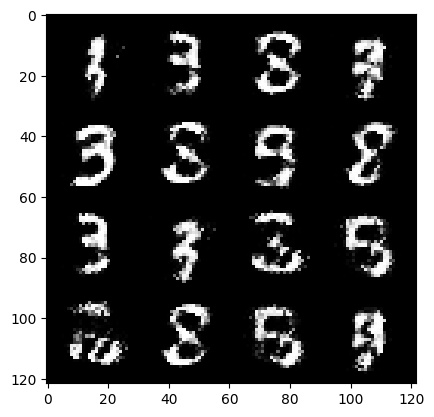

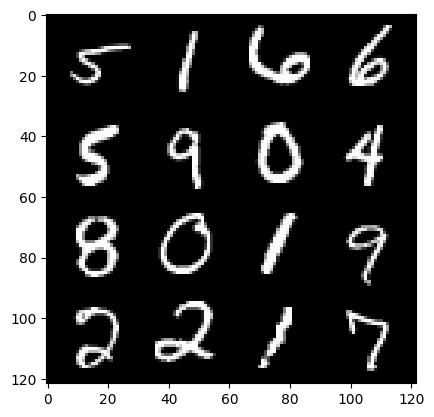

88: step 41400 / Gen loss: 4.050682147343954 / disc_loss: 0.11392061416059737


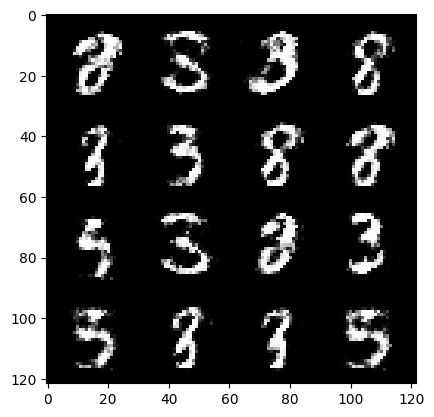

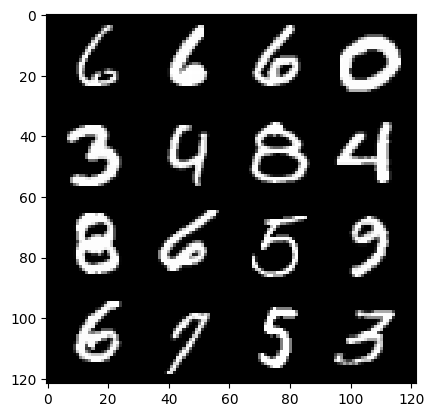

88: step 41700 / Gen loss: 4.235233996709186 / disc_loss: 0.08938405072937407


  0%|          | 0/469 [00:00<?, ?it/s]

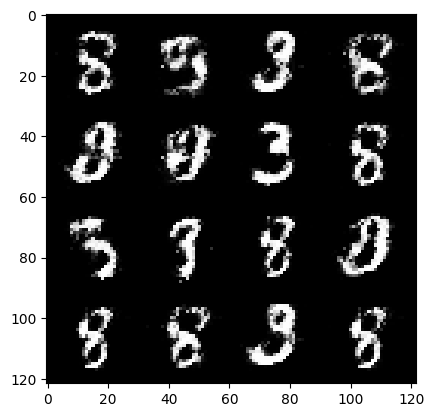

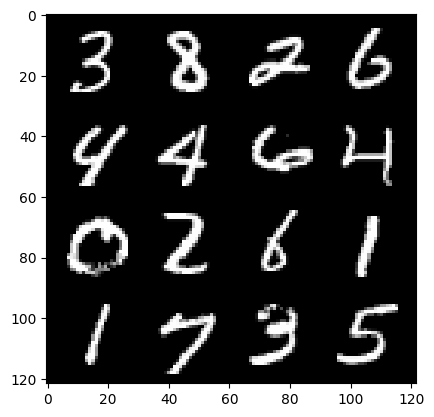

89: step 42000 / Gen loss: 4.327209436098736 / disc_loss: 0.09613226792464653


  0%|          | 0/469 [00:00<?, ?it/s]

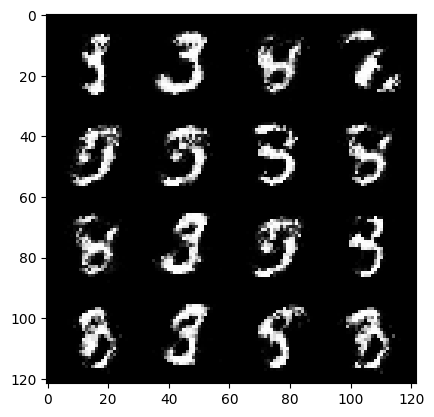

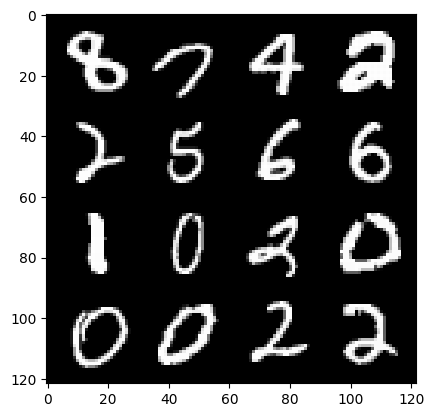

90: step 42300 / Gen loss: 4.203284739653271 / disc_loss: 0.10652723655104639


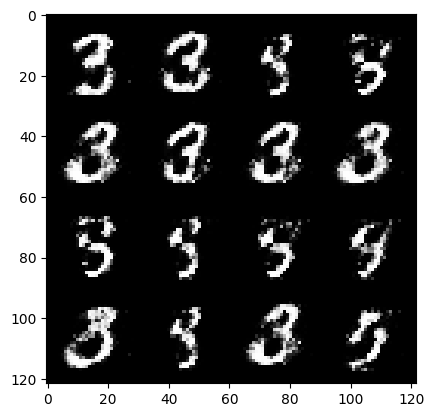

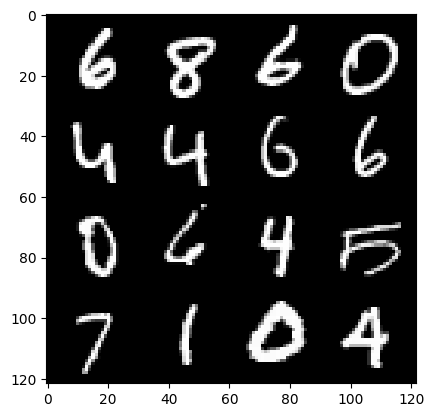

90: step 42600 / Gen loss: 4.003898018201191 / disc_loss: 0.10278267887731386


  0%|          | 0/469 [00:00<?, ?it/s]

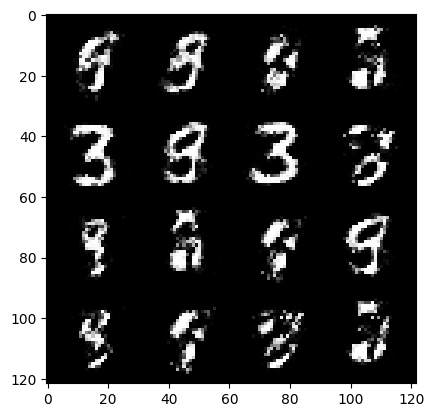

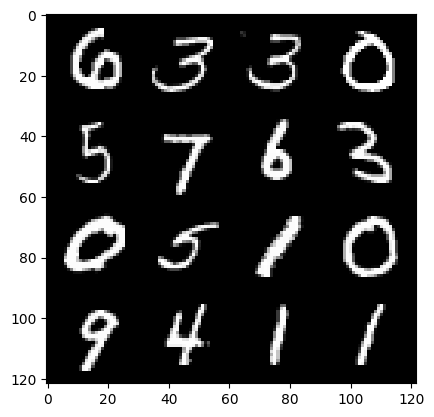

91: step 42900 / Gen loss: 4.069518450895943 / disc_loss: 0.0924551784619689


  0%|          | 0/469 [00:00<?, ?it/s]

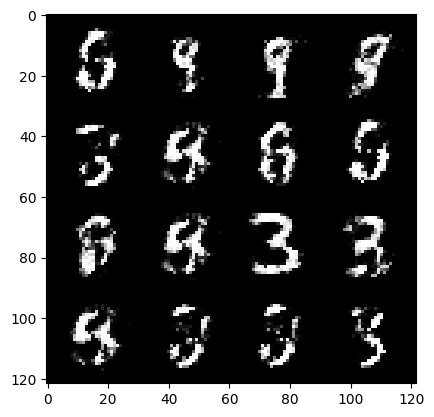

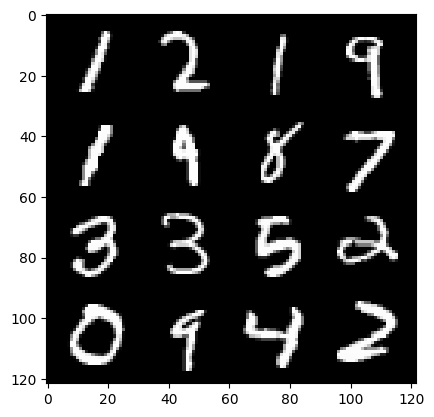

92: step 43200 / Gen loss: 4.061921775341036 / disc_loss: 0.09900784699867168


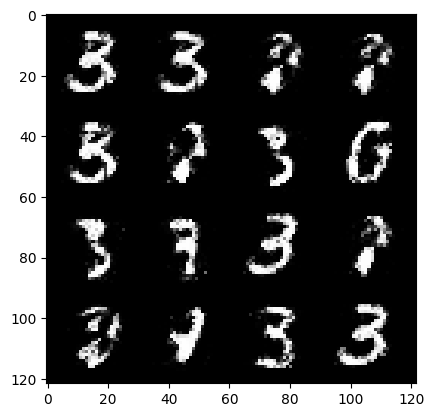

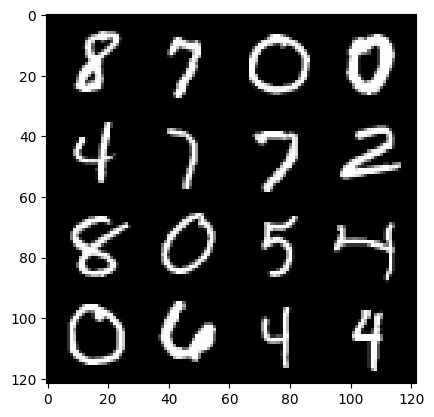

92: step 43500 / Gen loss: 4.009778148333229 / disc_loss: 0.1063224947576721


  0%|          | 0/469 [00:00<?, ?it/s]

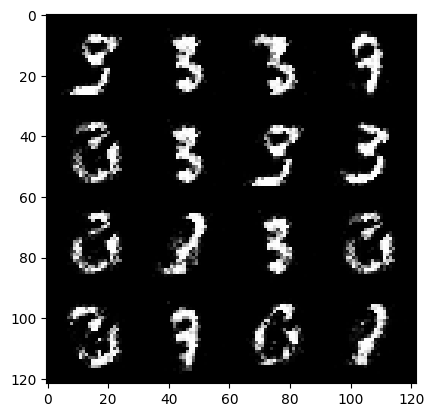

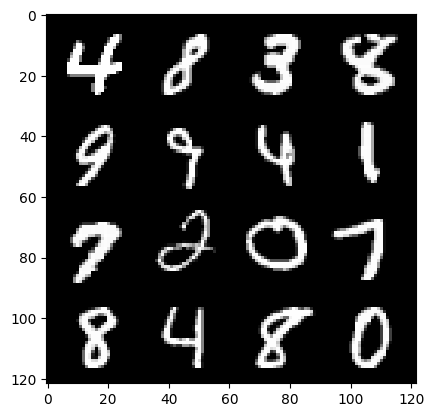

93: step 43800 / Gen loss: 4.204320278962451 / disc_loss: 0.1036439345280329


  0%|          | 0/469 [00:00<?, ?it/s]

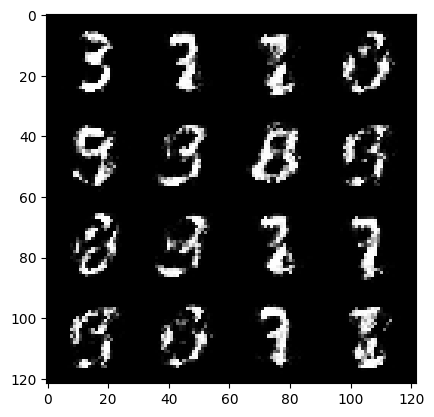

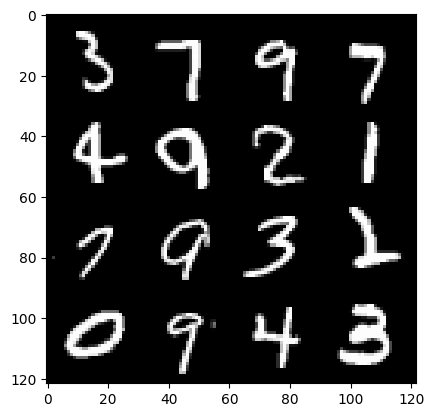

94: step 44100 / Gen loss: 4.055920859972637 / disc_loss: 0.10178230771794912


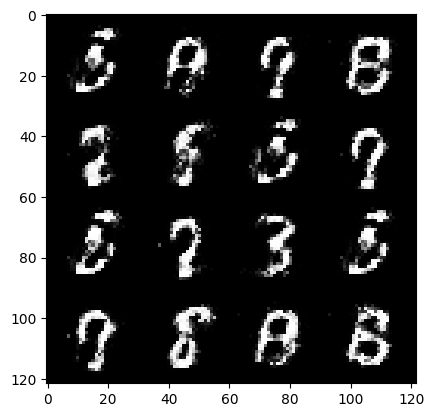

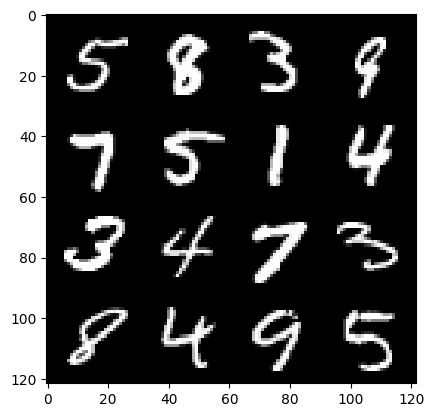

94: step 44400 / Gen loss: 4.081079030831656 / disc_loss: 0.10414145125697057


  0%|          | 0/469 [00:00<?, ?it/s]

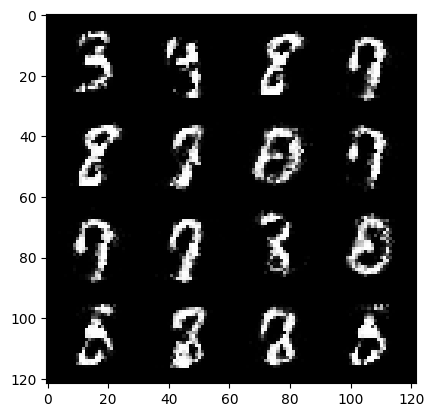

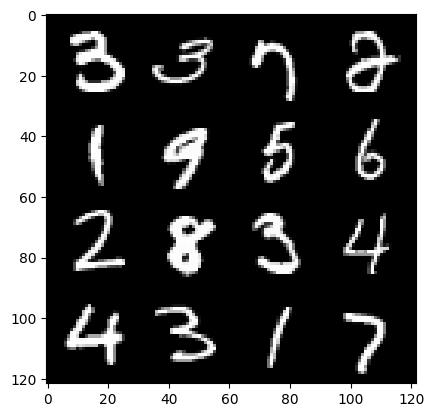

95: step 44700 / Gen loss: 3.9745601558685317 / disc_loss: 0.12079294649263218


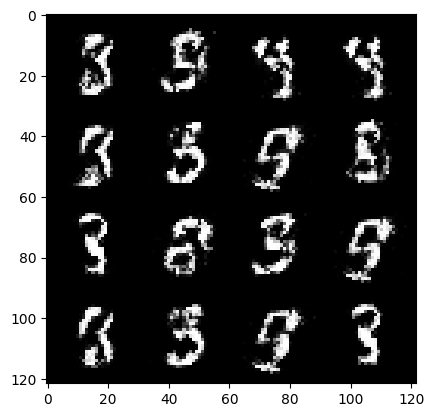

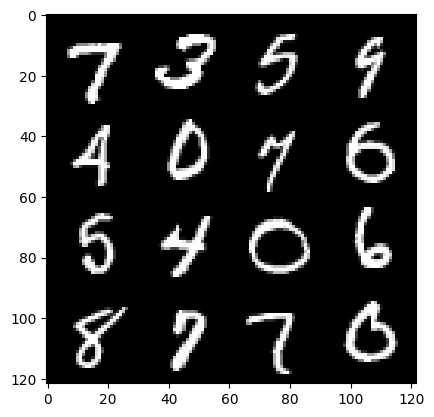

95: step 45000 / Gen loss: 3.966528352101646 / disc_loss: 0.11234111192325749


  0%|          | 0/469 [00:00<?, ?it/s]

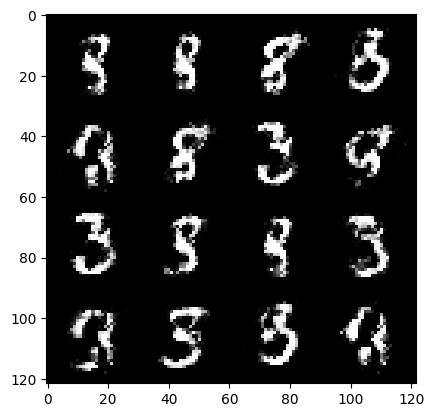

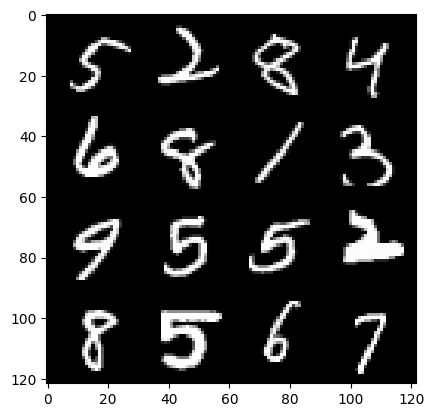

96: step 45300 / Gen loss: 4.230643129348755 / disc_loss: 0.10290812863036991


  0%|          | 0/469 [00:00<?, ?it/s]

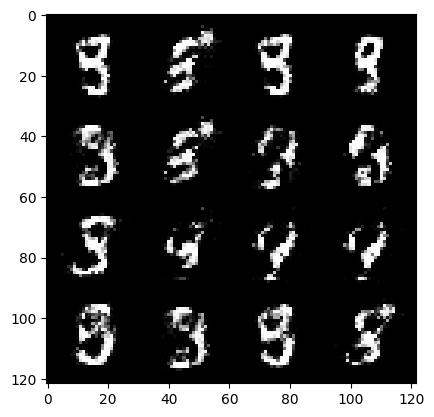

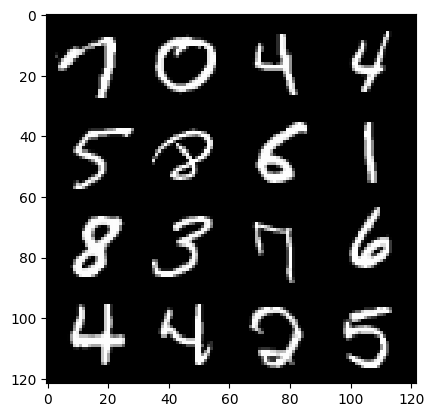

97: step 45600 / Gen loss: 4.067696281274159 / disc_loss: 0.09725038247803845


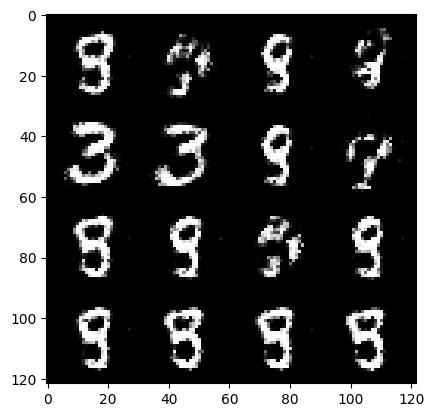

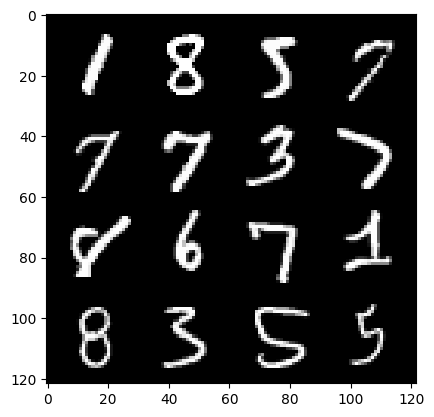

97: step 45900 / Gen loss: 4.244671317736307 / disc_loss: 0.1077182202537855


  0%|          | 0/469 [00:00<?, ?it/s]

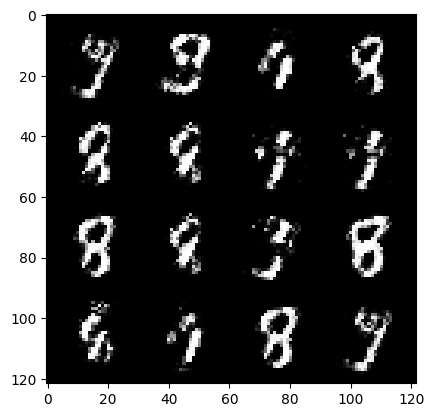

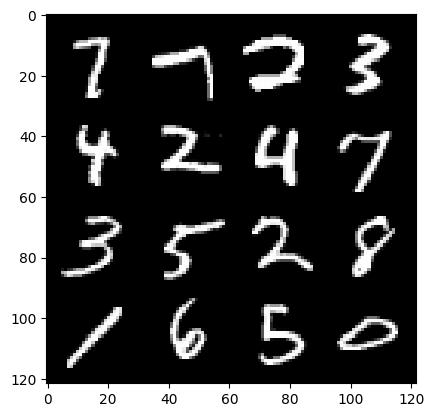

98: step 46200 / Gen loss: 3.858083841005961 / disc_loss: 0.10682680935909347


  0%|          | 0/469 [00:00<?, ?it/s]

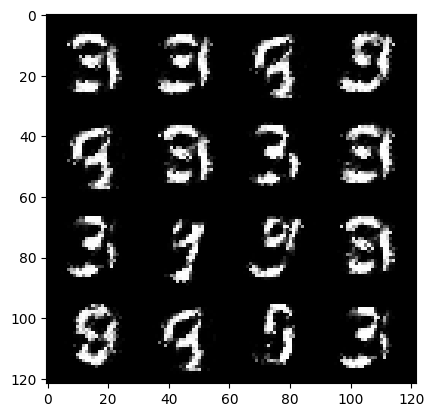

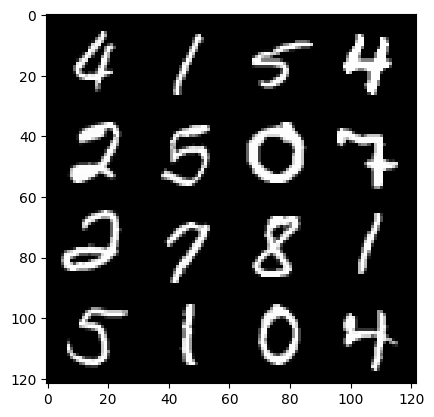

99: step 46500 / Gen loss: 3.8515327771504744 / disc_loss: 0.11518510315567256


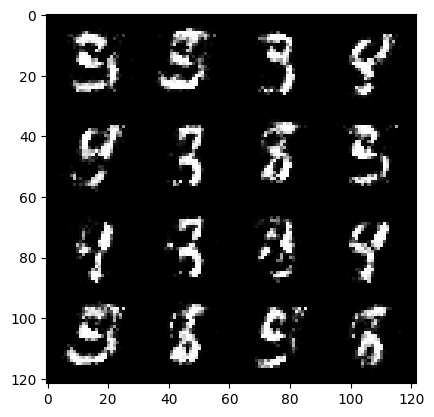

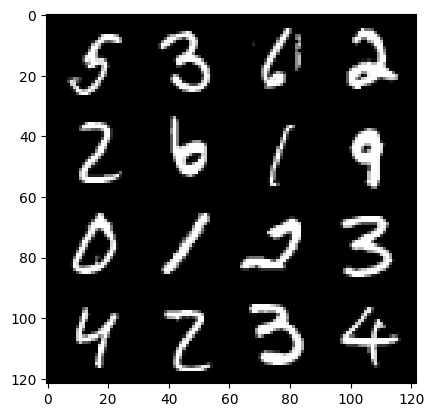

99: step 46800 / Gen loss: 4.10949218273163 / disc_loss: 0.10715980158497893


  0%|          | 0/469 [00:00<?, ?it/s]

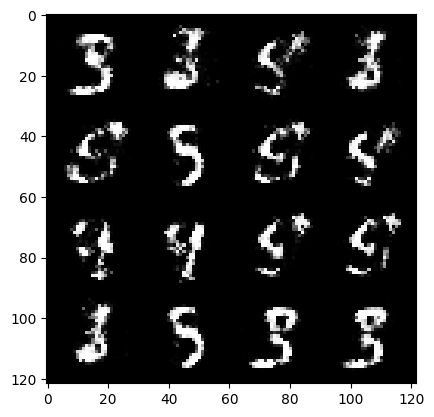

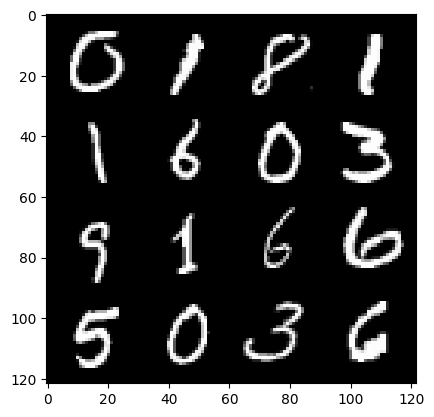

100: step 47100 / Gen loss: 4.437429074446363 / disc_loss: 0.11437862423559024


  0%|          | 0/469 [00:00<?, ?it/s]

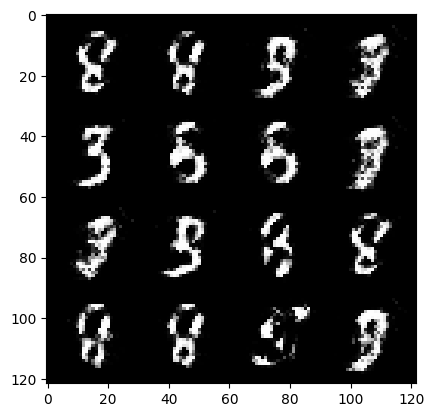

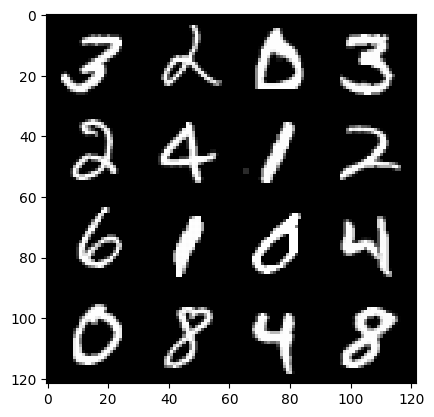

101: step 47400 / Gen loss: 3.9777759838104236 / disc_loss: 0.11458336225400365


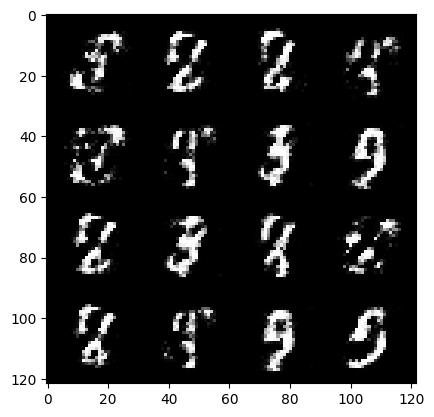

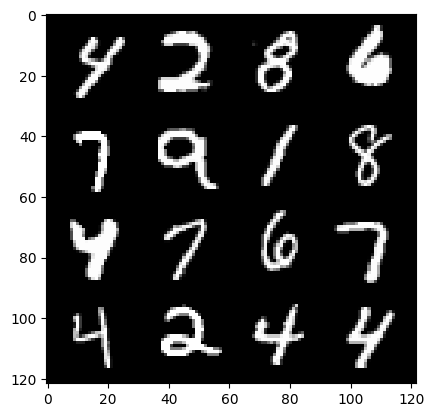

101: step 47700 / Gen loss: 4.051569369633991 / disc_loss: 0.12315334834158413


  0%|          | 0/469 [00:00<?, ?it/s]

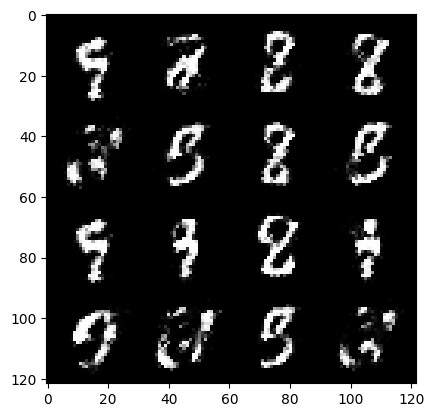

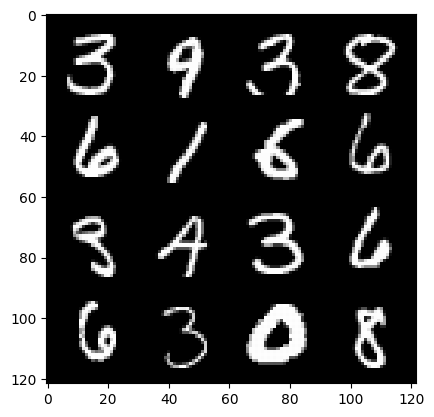

102: step 48000 / Gen loss: 4.097489156723022 / disc_loss: 0.1153578151141604


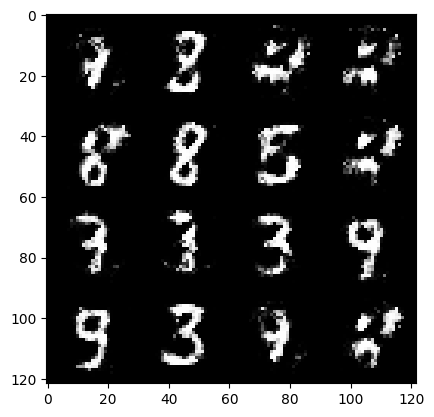

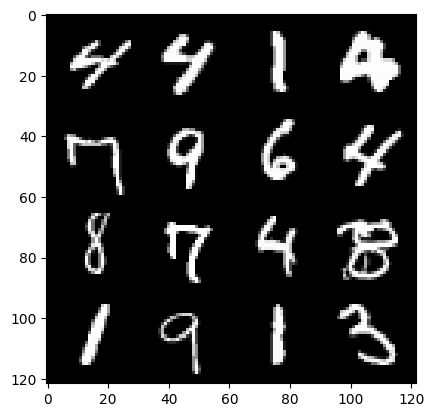

102: step 48300 / Gen loss: 3.838061399459837 / disc_loss: 0.13020191516727206


  0%|          | 0/469 [00:00<?, ?it/s]

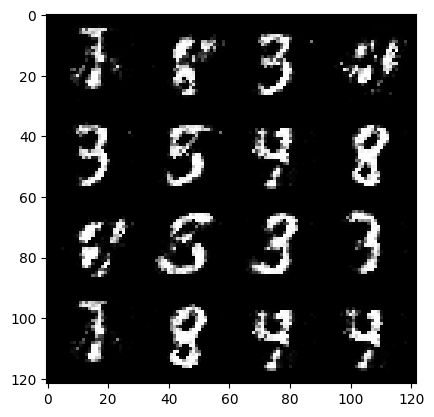

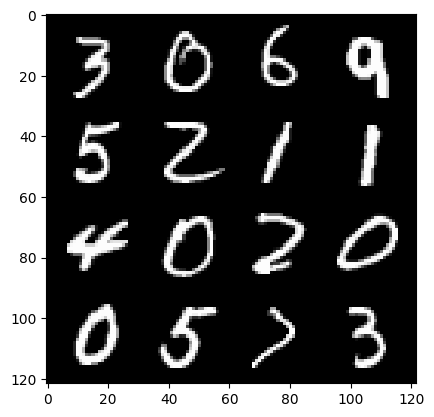

103: step 48600 / Gen loss: 4.183108818531034 / disc_loss: 0.11066596218695245


  0%|          | 0/469 [00:00<?, ?it/s]

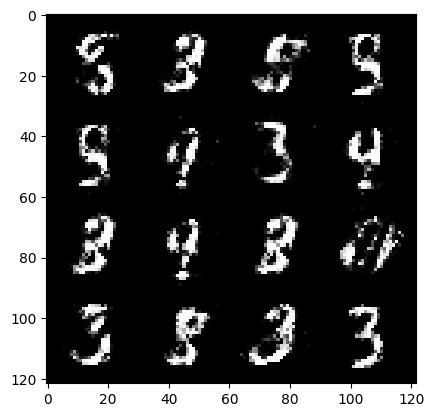

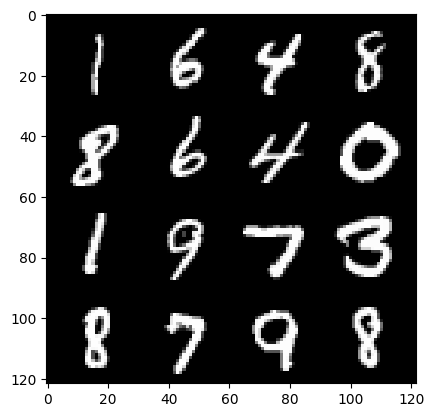

104: step 48900 / Gen loss: 4.231614226500191 / disc_loss: 0.0915680723761519


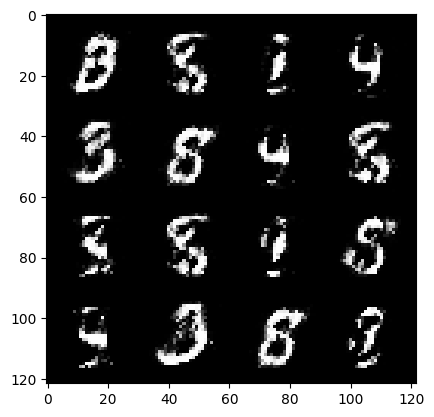

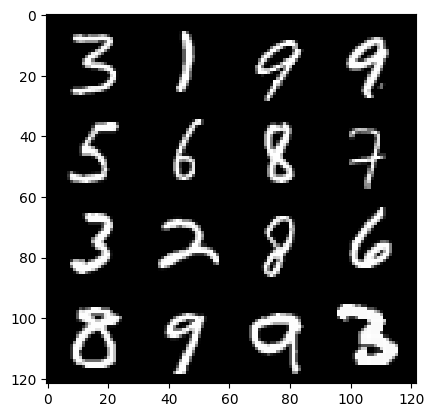

104: step 49200 / Gen loss: 4.049016711711881 / disc_loss: 0.09815248247236018


  0%|          | 0/469 [00:00<?, ?it/s]

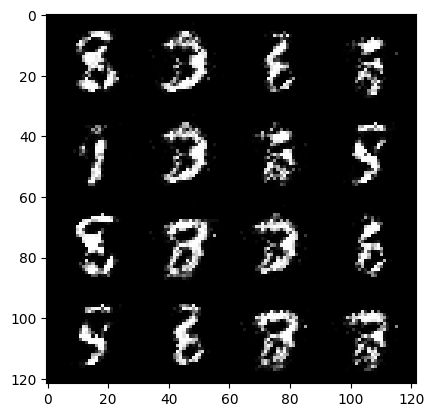

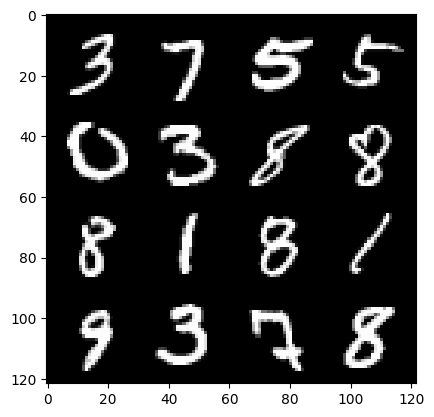

105: step 49500 / Gen loss: 4.218607697486877 / disc_loss: 0.12077048797160385


  0%|          | 0/469 [00:00<?, ?it/s]

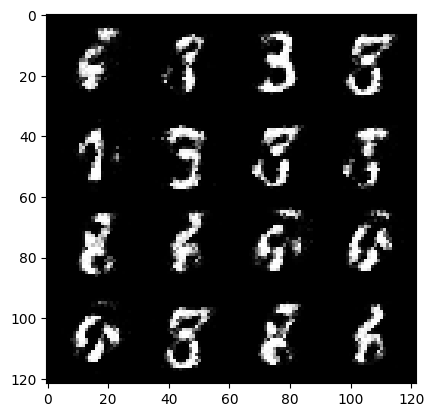

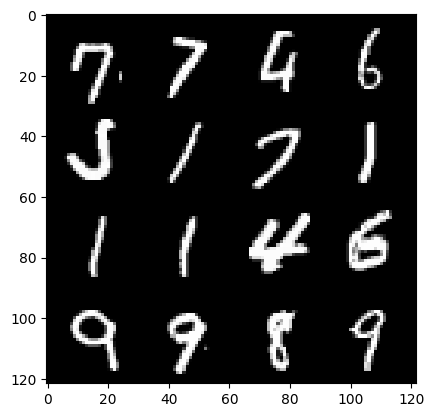

106: step 49800 / Gen loss: 3.7322558633486422 / disc_loss: 0.14012014930446948


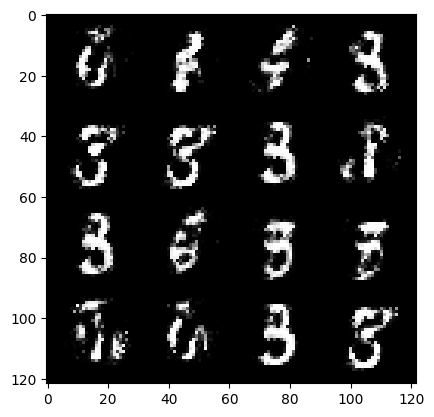

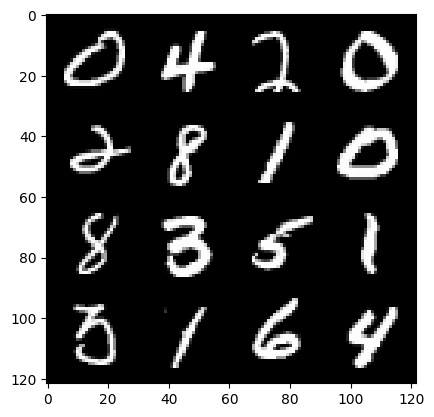

106: step 50100 / Gen loss: 3.971400560537975 / disc_loss: 0.11243419514348112


  0%|          | 0/469 [00:00<?, ?it/s]

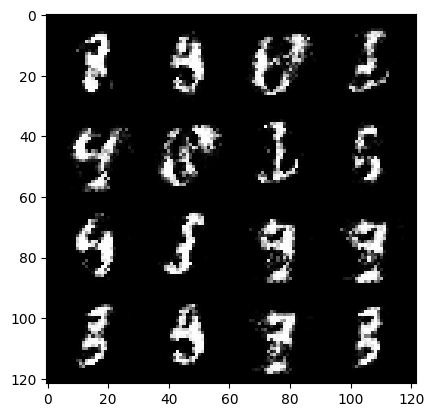

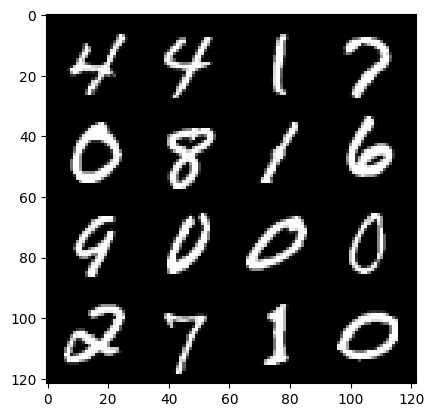

107: step 50400 / Gen loss: 4.402457563082378 / disc_loss: 0.1085145772000153


  0%|          | 0/469 [00:00<?, ?it/s]

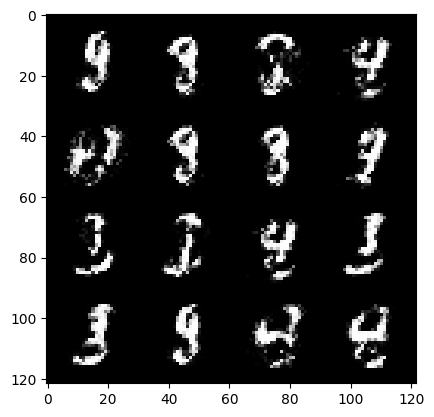

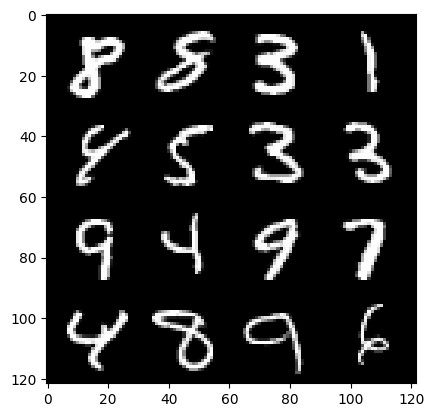

108: step 50700 / Gen loss: 3.9076010100046794 / disc_loss: 0.12321753359089296


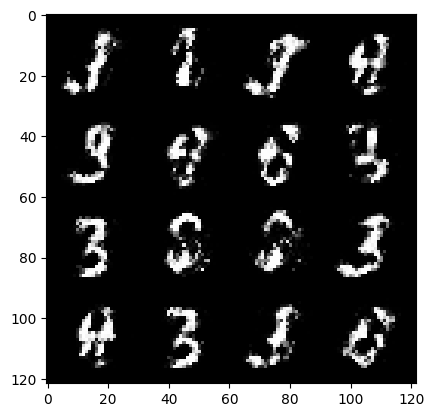

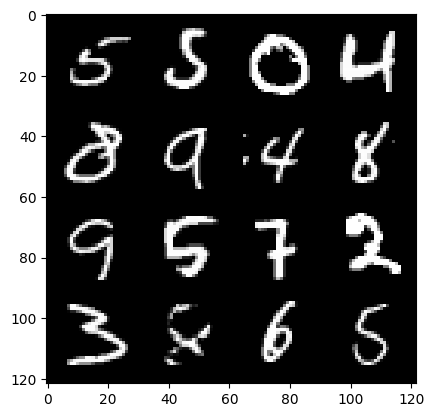

108: step 51000 / Gen loss: 3.875915581385297 / disc_loss: 0.12616373879214127


  0%|          | 0/469 [00:00<?, ?it/s]

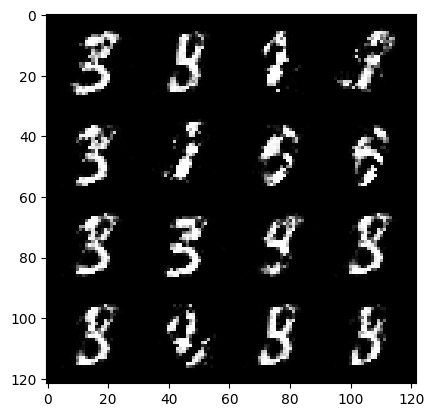

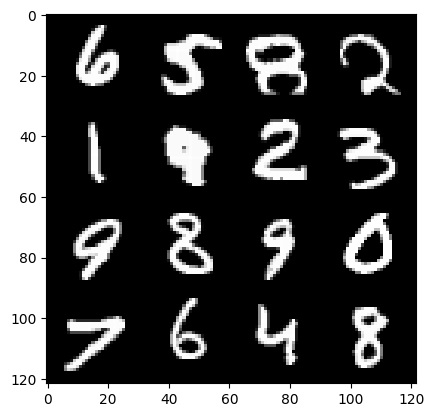

109: step 51300 / Gen loss: 3.9337102985382093 / disc_loss: 0.1131919550523162


  0%|          | 0/469 [00:00<?, ?it/s]

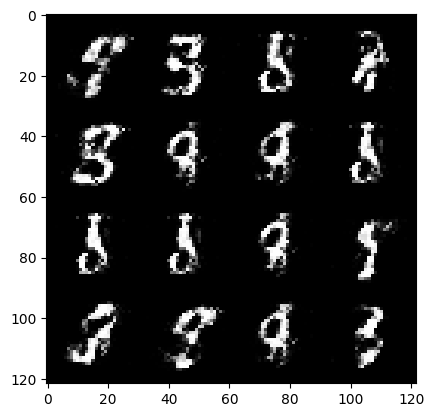

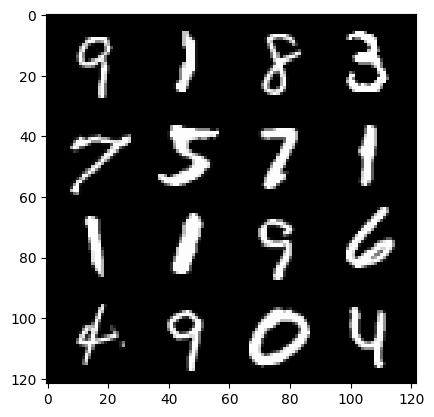

110: step 51600 / Gen loss: 3.7974856344858785 / disc_loss: 0.12418534758190311


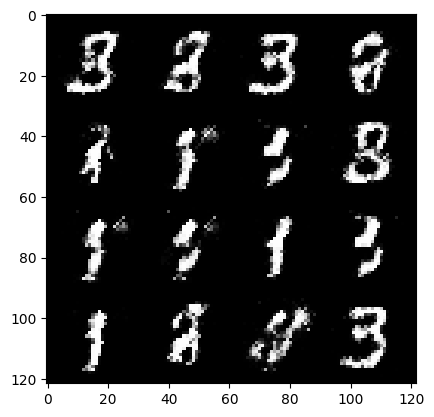

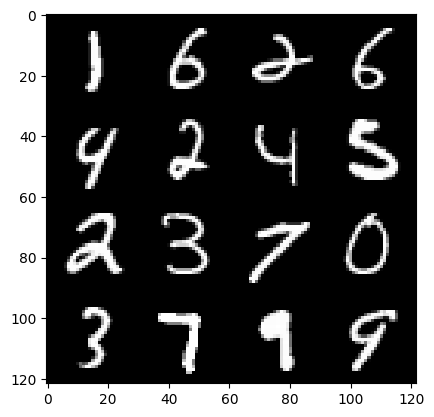

110: step 51900 / Gen loss: 3.568928991158805 / disc_loss: 0.14680519295235478


  0%|          | 0/469 [00:00<?, ?it/s]

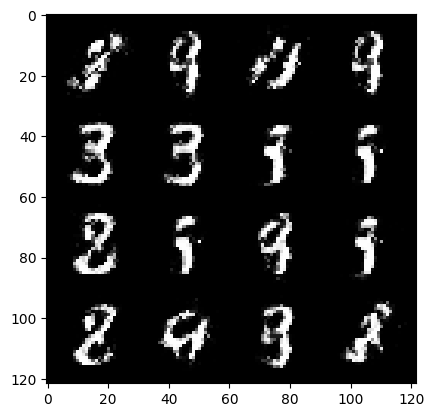

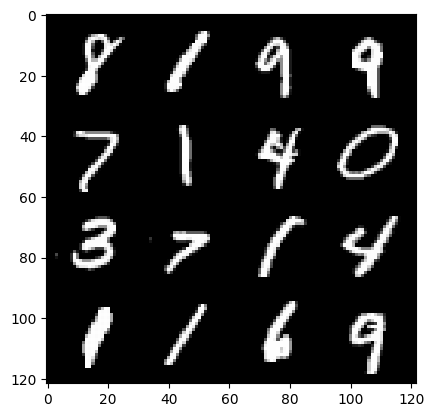

111: step 52200 / Gen loss: 3.612235668500263 / disc_loss: 0.13139979631950455


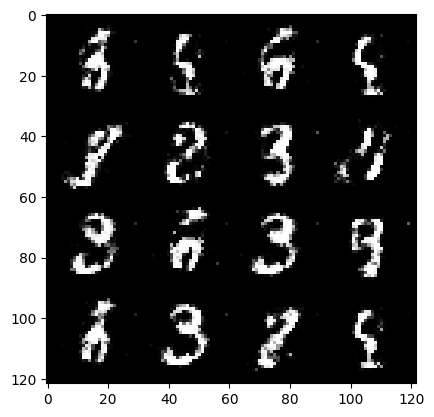

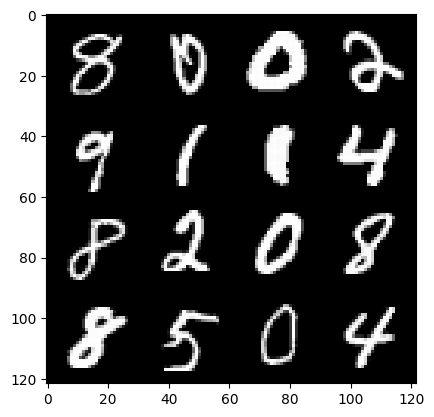

111: step 52500 / Gen loss: 3.9038700373967457 / disc_loss: 0.12545939002186063


  0%|          | 0/469 [00:00<?, ?it/s]

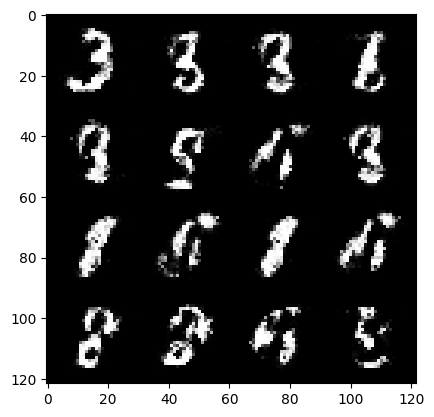

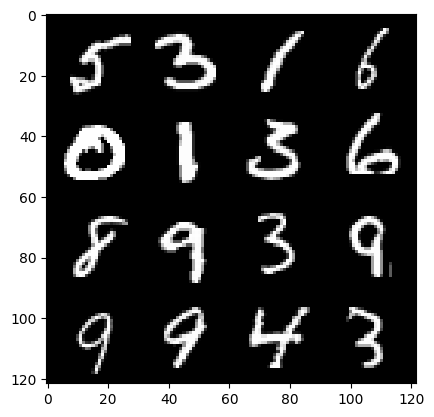

112: step 52800 / Gen loss: 3.6664761598904936 / disc_loss: 0.13463076288501424


  0%|          | 0/469 [00:00<?, ?it/s]

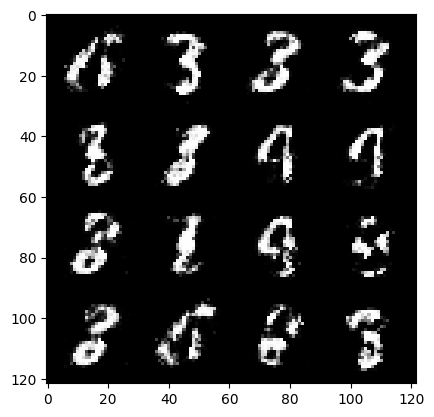

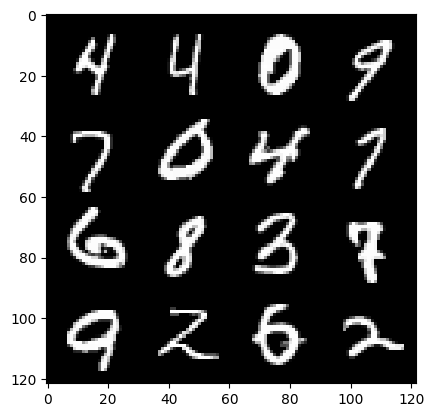

113: step 53100 / Gen loss: 3.5236144979794815 / disc_loss: 0.14981085007389386


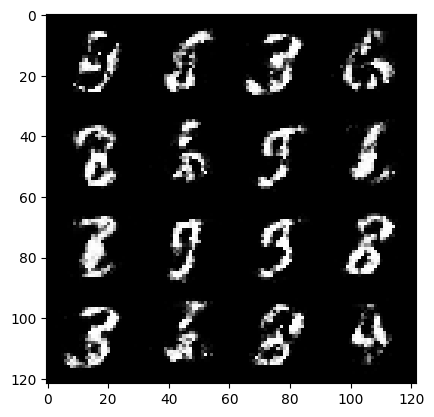

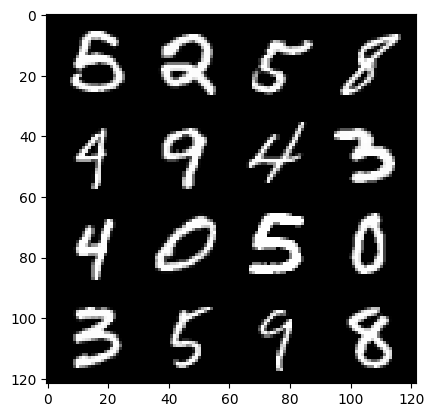

113: step 53400 / Gen loss: 3.5546857953071576 / disc_loss: 0.13984970185905696


  0%|          | 0/469 [00:00<?, ?it/s]

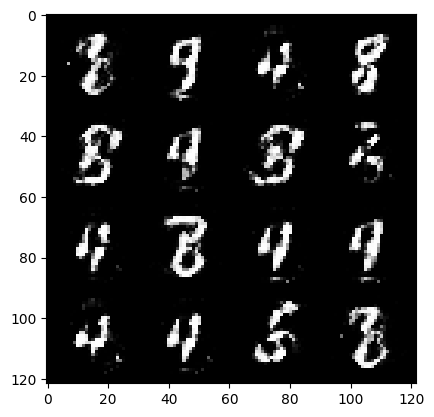

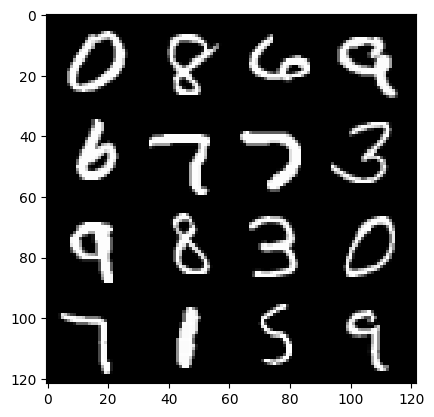

114: step 53700 / Gen loss: 3.5561664915084807 / disc_loss: 0.14921467157701648


  0%|          | 0/469 [00:00<?, ?it/s]

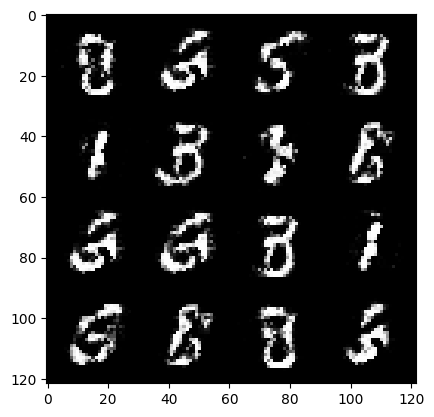

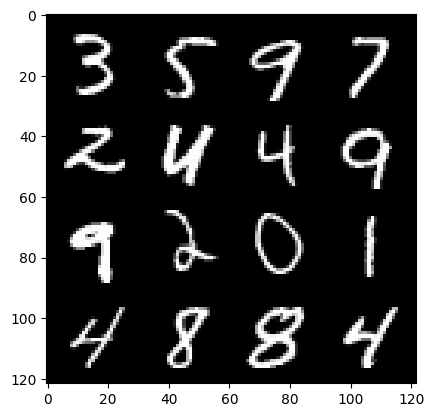

115: step 54000 / Gen loss: 3.4612342007954924 / disc_loss: 0.12925708493838706


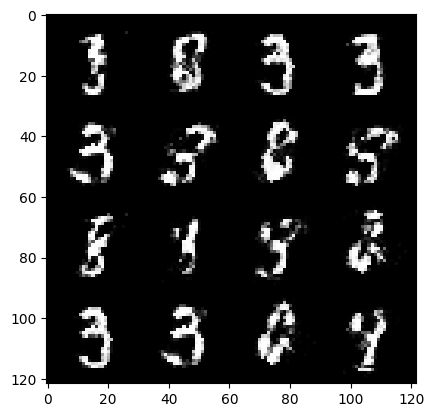

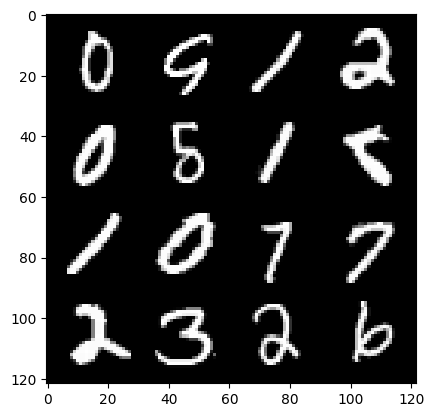

115: step 54300 / Gen loss: 3.4686068542798356 / disc_loss: 0.14890155500421906


  0%|          | 0/469 [00:00<?, ?it/s]

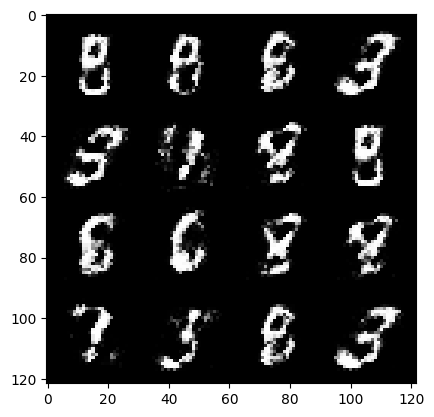

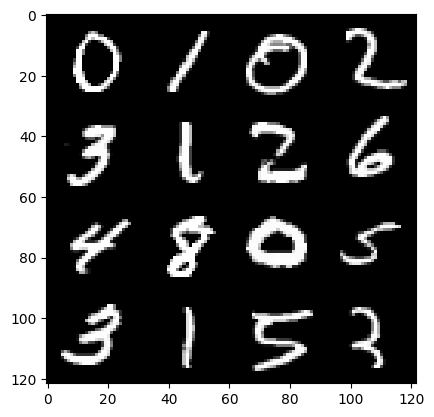

116: step 54600 / Gen loss: 3.3434476017951953 / disc_loss: 0.15125494467715409


  0%|          | 0/469 [00:00<?, ?it/s]

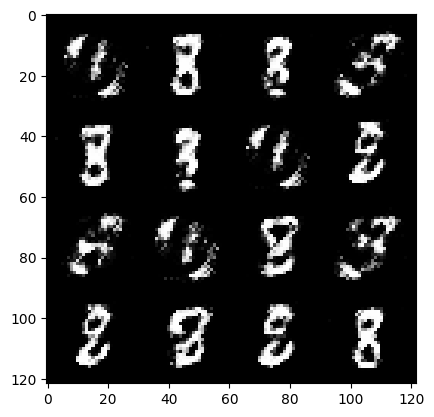

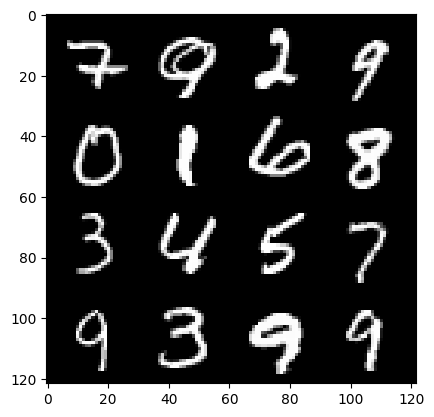

117: step 54900 / Gen loss: 3.712776003678639 / disc_loss: 0.14118552292386685


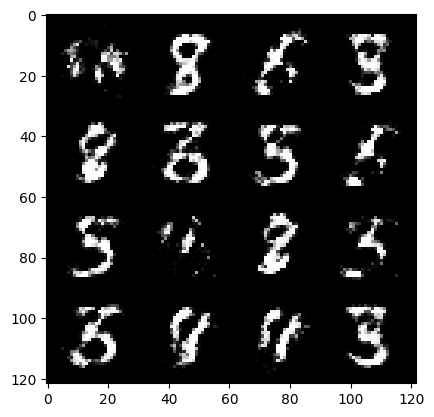

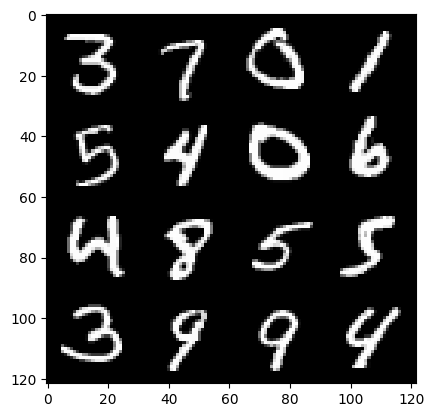

117: step 55200 / Gen loss: 3.727991111278533 / disc_loss: 0.1253963503365715


  0%|          | 0/469 [00:00<?, ?it/s]

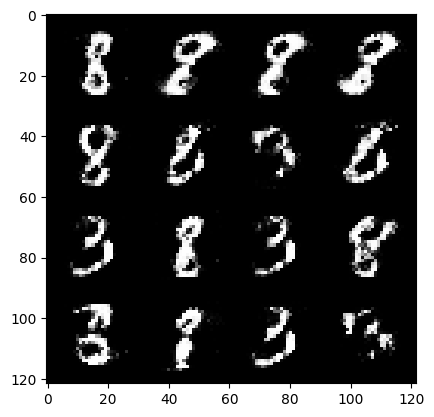

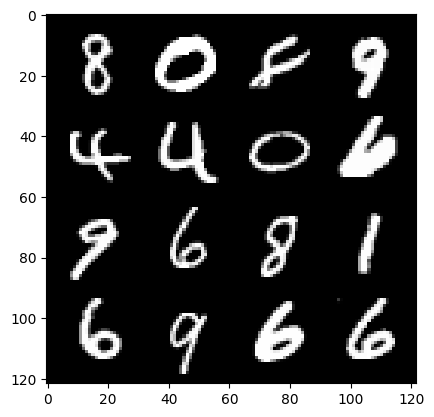

118: step 55500 / Gen loss: 3.5483917379379273 / disc_loss: 0.12268562093377121


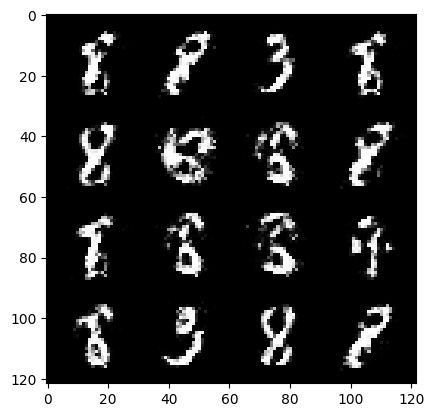

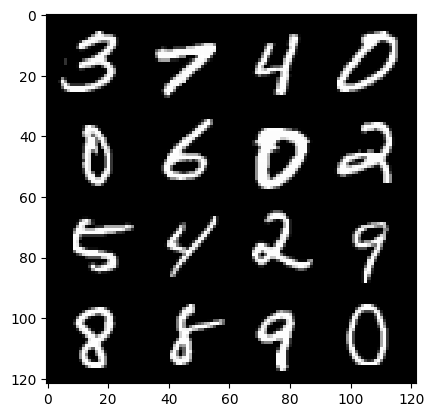

118: step 55800 / Gen loss: 3.614929722944897 / disc_loss: 0.12728766296058897


  0%|          | 0/469 [00:00<?, ?it/s]

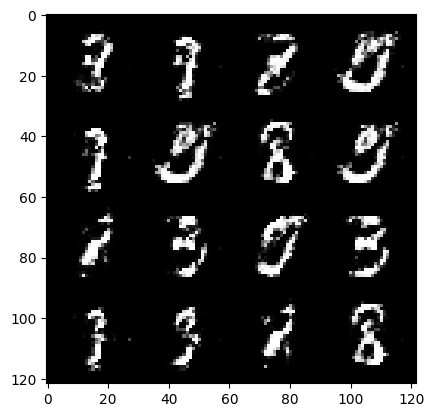

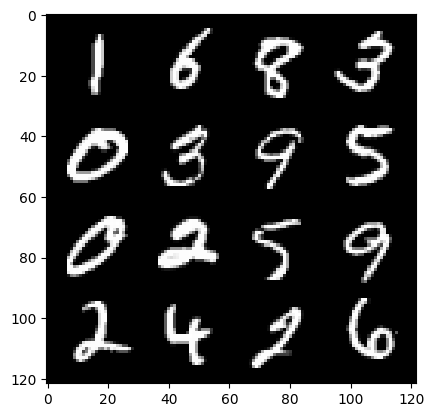

119: step 56100 / Gen loss: 3.458614784876504 / disc_loss: 0.13753832923869289


  0%|          | 0/469 [00:00<?, ?it/s]

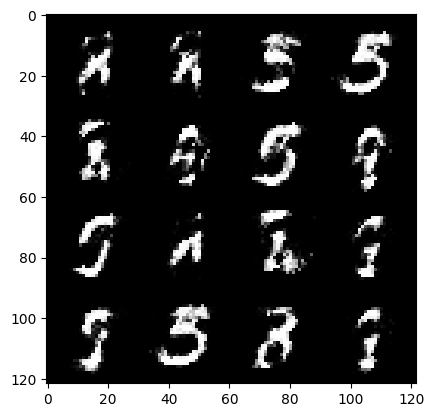

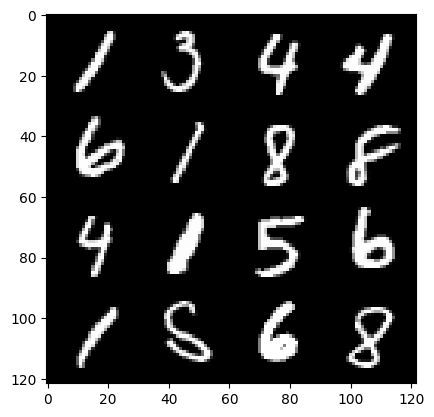

120: step 56400 / Gen loss: 3.5408333086967474 / disc_loss: 0.12594522984077539


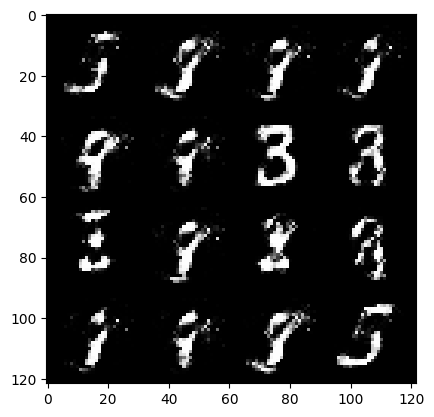

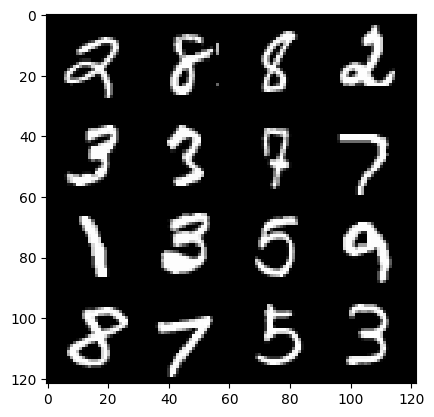

120: step 56700 / Gen loss: 3.648368305365246 / disc_loss: 0.14285658424099287


  0%|          | 0/469 [00:00<?, ?it/s]

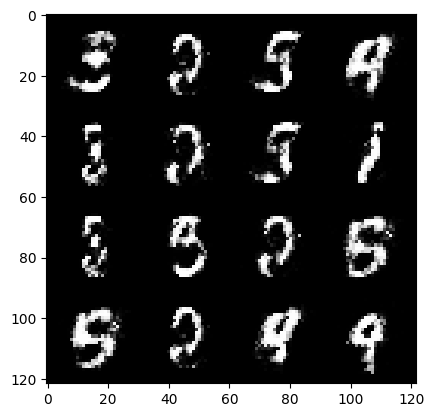

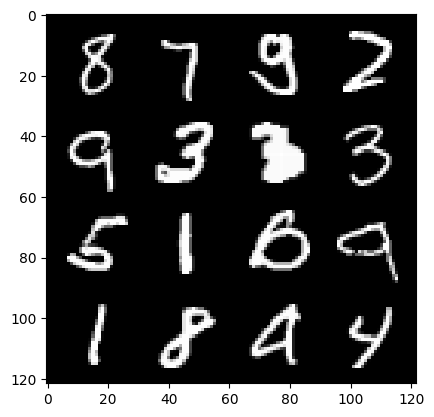

121: step 57000 / Gen loss: 3.4615285468101513 / disc_loss: 0.15999543581157927


  0%|          | 0/469 [00:00<?, ?it/s]

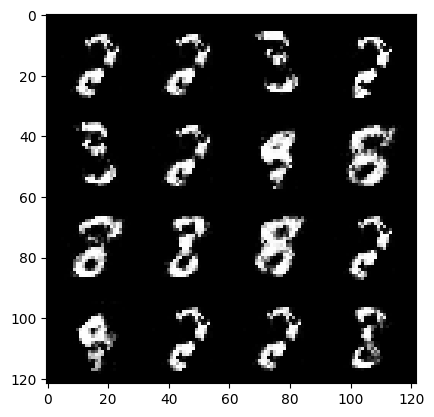

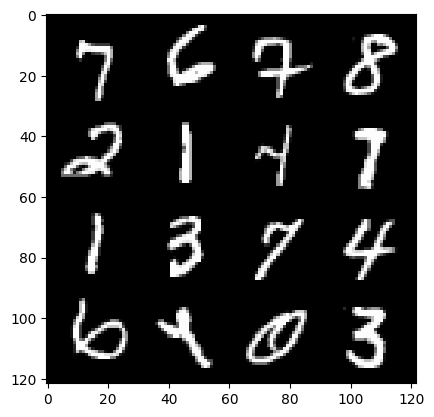

122: step 57300 / Gen loss: 3.3237155254681876 / disc_loss: 0.1394346459458271


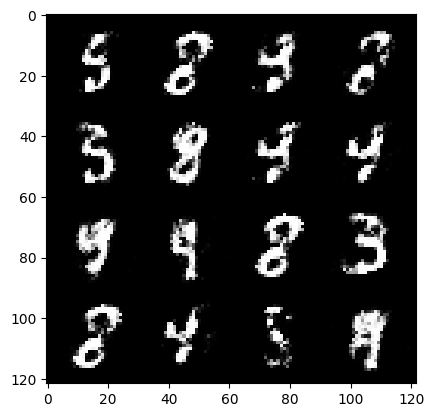

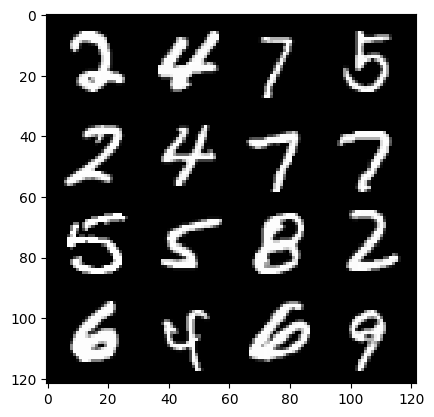

122: step 57600 / Gen loss: 3.4637099440892523 / disc_loss: 0.13414614327251914


  0%|          | 0/469 [00:00<?, ?it/s]

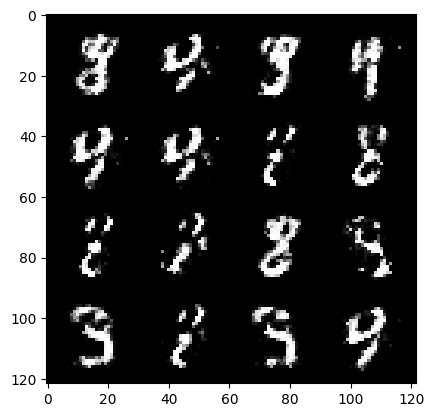

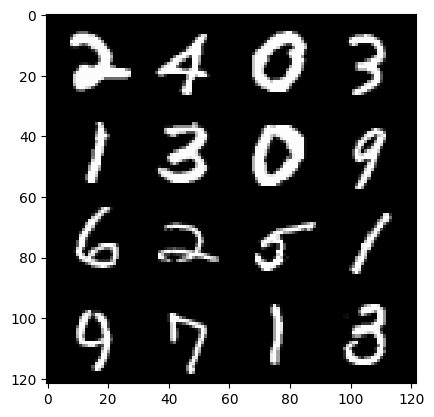

123: step 57900 / Gen loss: 3.3156596604983015 / disc_loss: 0.14847547742227718


  0%|          | 0/469 [00:00<?, ?it/s]

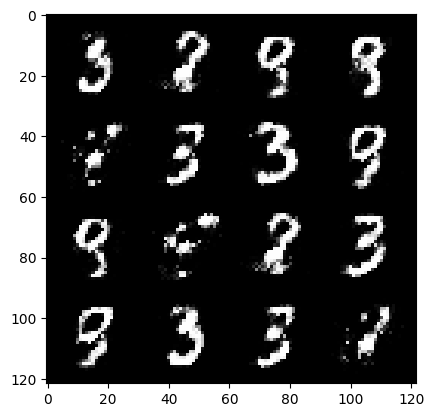

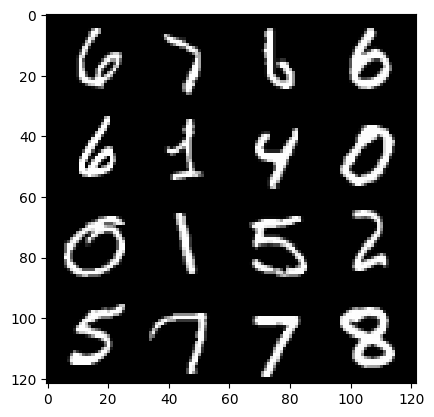

124: step 58200 / Gen loss: 3.309702218373617 / disc_loss: 0.1562966092675924


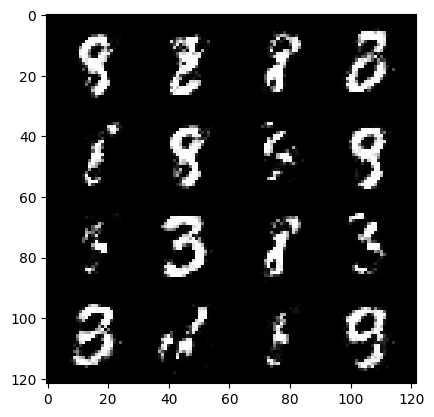

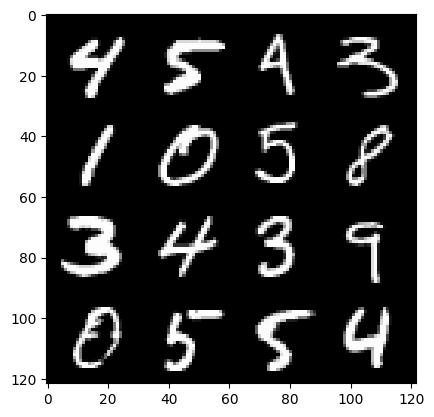

124: step 58500 / Gen loss: 3.3978215424219753 / disc_loss: 0.13379479043185705


  0%|          | 0/469 [00:00<?, ?it/s]

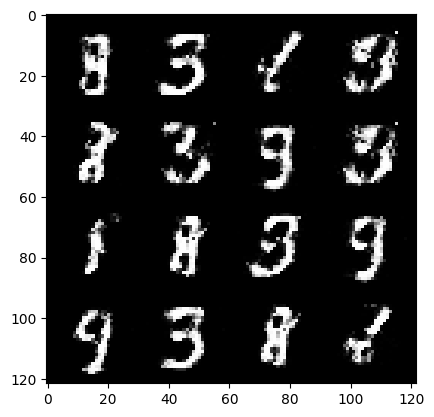

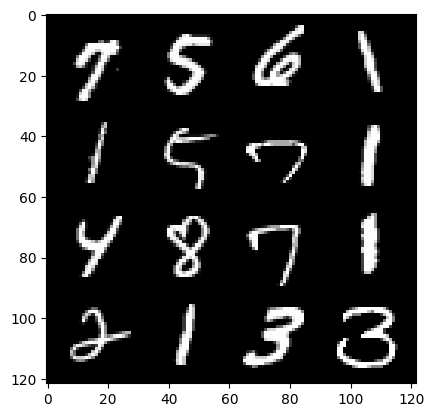

125: step 58800 / Gen loss: 3.3216733384132393 / disc_loss: 0.1629336494455735


  0%|          | 0/469 [00:00<?, ?it/s]

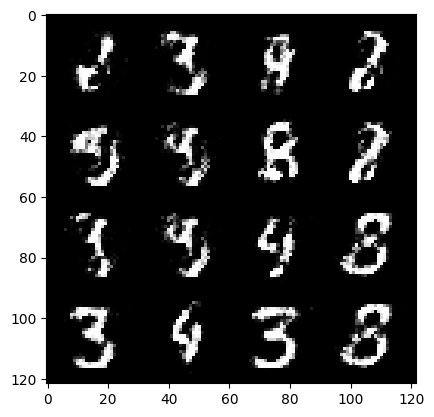

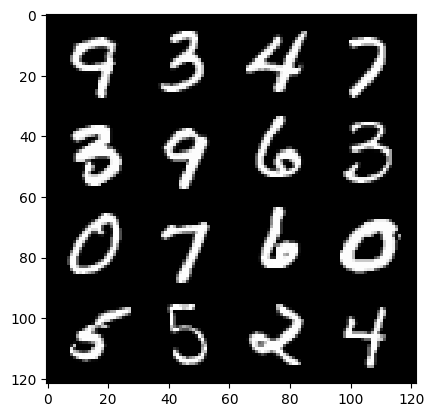

126: step 59100 / Gen loss: 3.27040642976761 / disc_loss: 0.15266686011105776


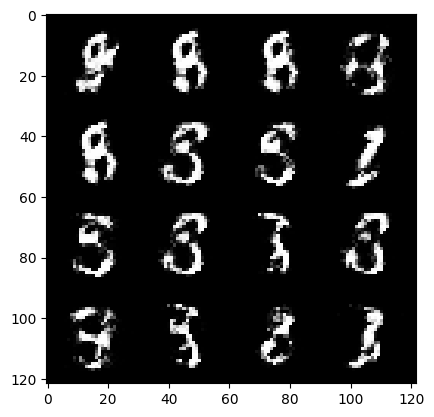

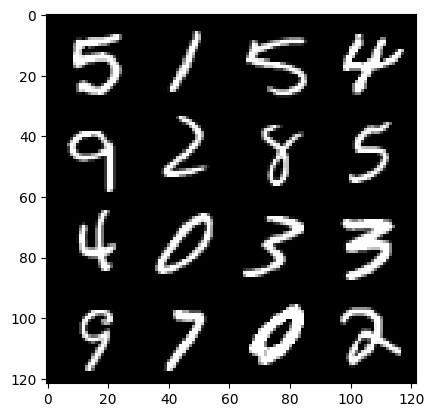

126: step 59400 / Gen loss: 3.320012132326761 / disc_loss: 0.1424182193105419


  0%|          | 0/469 [00:00<?, ?it/s]

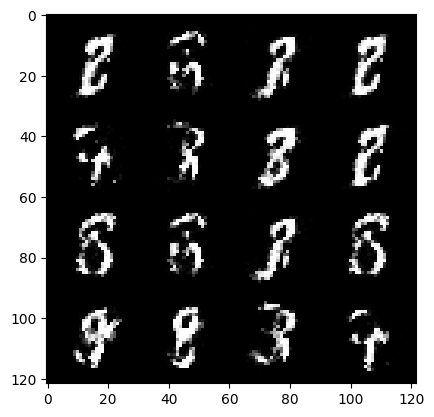

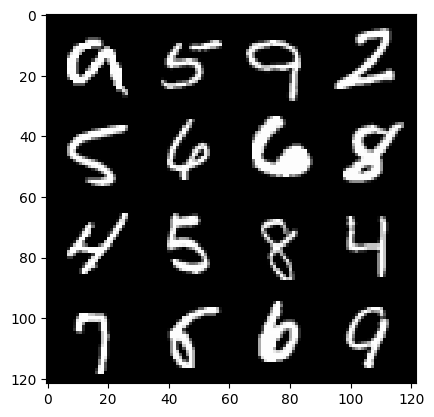

127: step 59700 / Gen loss: 3.3980796504020687 / disc_loss: 0.15929936751723292


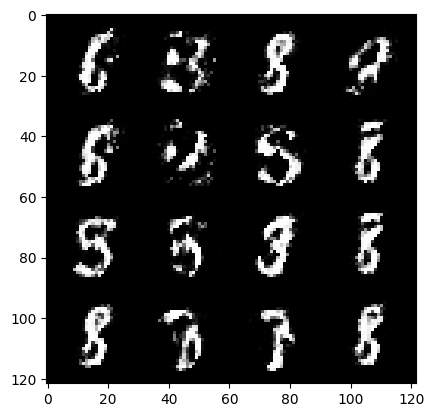

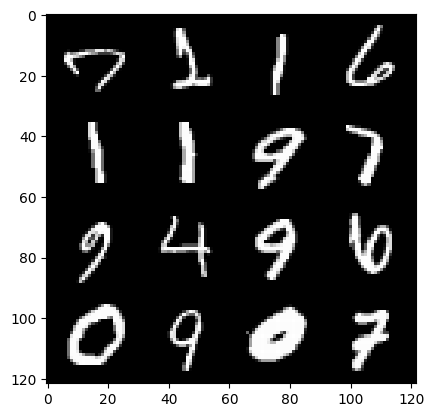

127: step 60000 / Gen loss: 3.2919294198354123 / disc_loss: 0.15236496624847262


  0%|          | 0/469 [00:00<?, ?it/s]

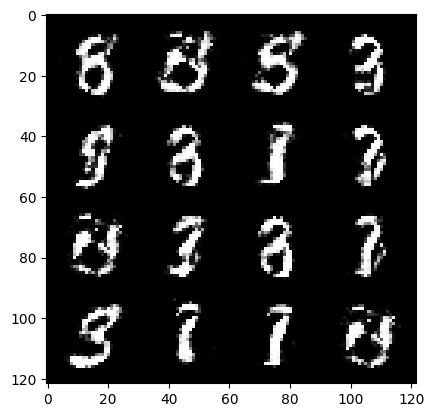

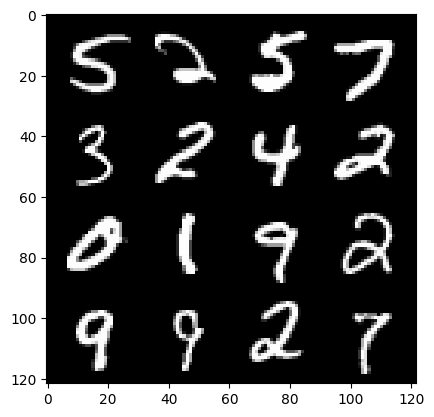

128: step 60300 / Gen loss: 3.319336390495299 / disc_loss: 0.1533471633121372


  0%|          | 0/469 [00:00<?, ?it/s]

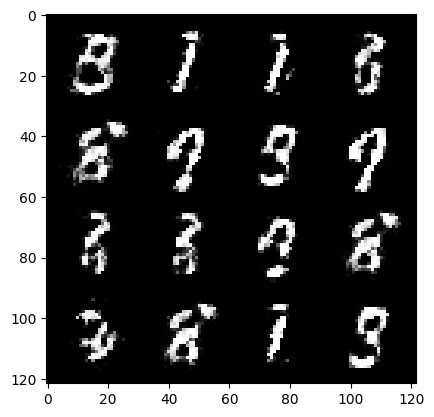

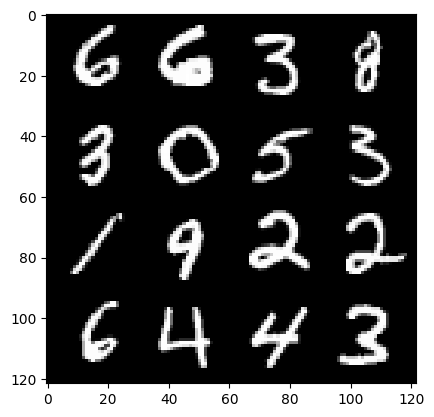

129: step 60600 / Gen loss: 3.676172626018524 / disc_loss: 0.1244245210538308


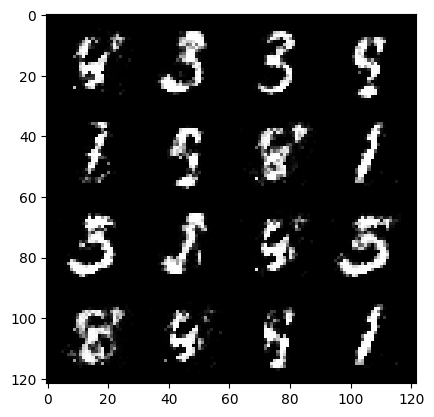

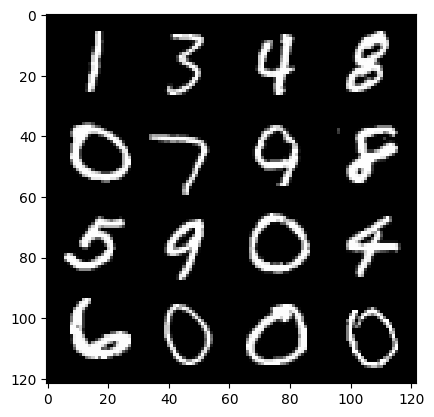

129: step 60900 / Gen loss: 3.4151627095540356 / disc_loss: 0.14662197630852464


  0%|          | 0/469 [00:00<?, ?it/s]

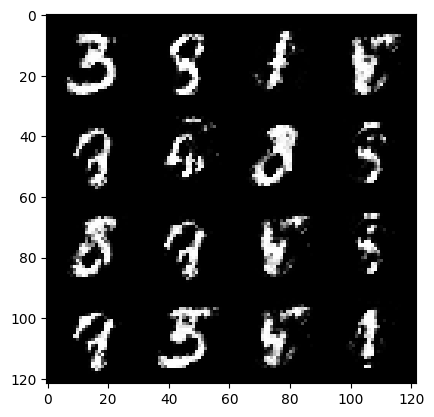

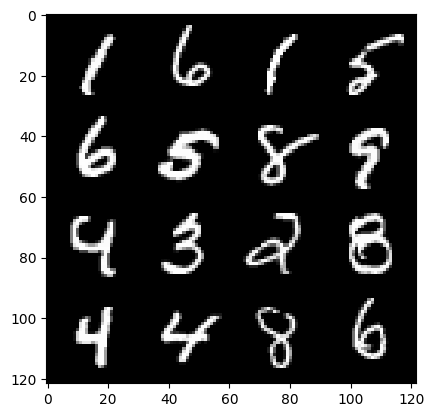

130: step 61200 / Gen loss: 3.3790210040410344 / disc_loss: 0.1539815212289493


  0%|          | 0/469 [00:00<?, ?it/s]

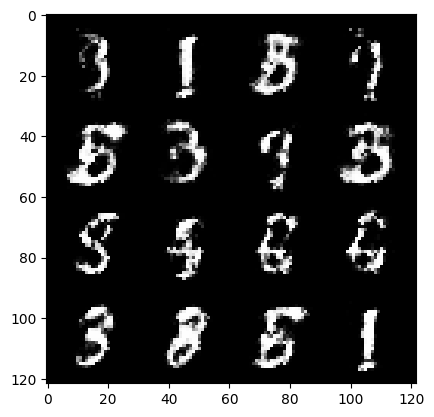

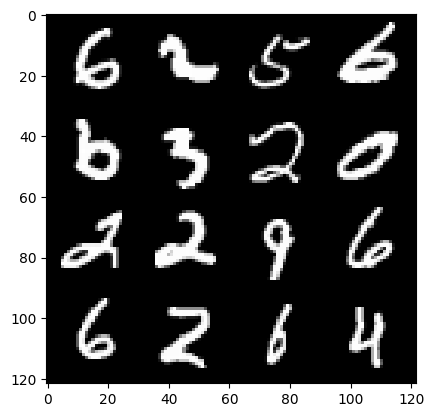

131: step 61500 / Gen loss: 3.216406239668525 / disc_loss: 0.18461625439425317


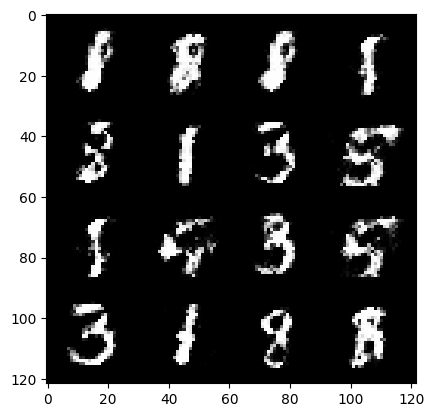

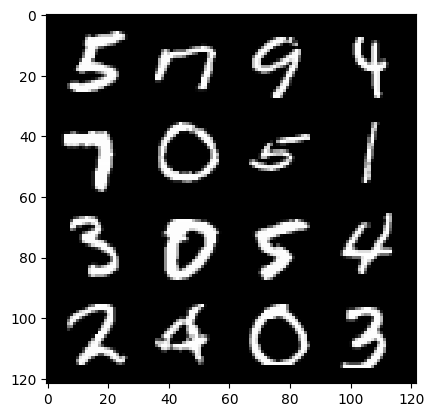

131: step 61800 / Gen loss: 3.2378260095914215 / disc_loss: 0.15389753724137933


  0%|          | 0/469 [00:00<?, ?it/s]

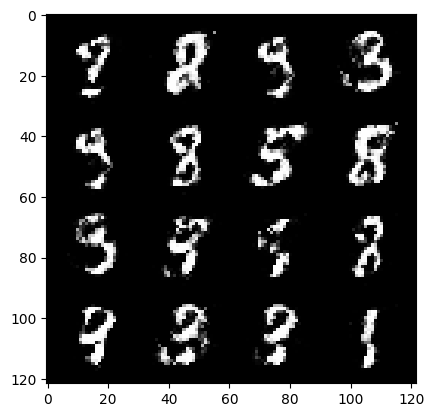

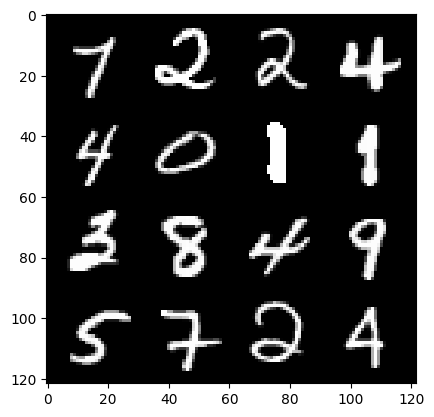

132: step 62100 / Gen loss: 3.42418952067693 / disc_loss: 0.14077582664787772


  0%|          | 0/469 [00:00<?, ?it/s]

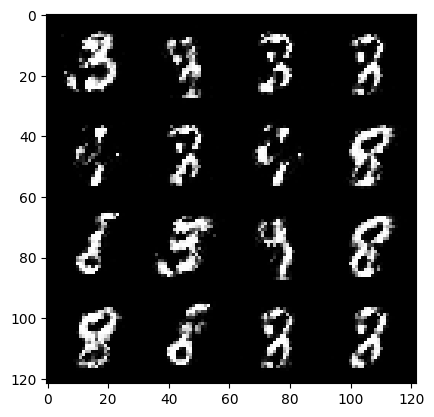

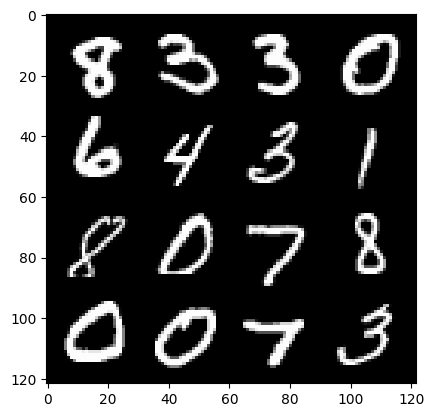

133: step 62400 / Gen loss: 3.4015457495053605 / disc_loss: 0.13749677707751595


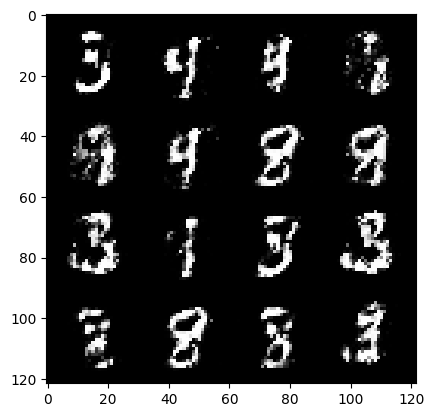

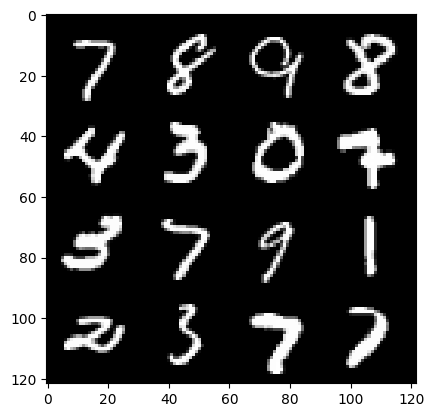

133: step 62700 / Gen loss: 3.3815571546554564 / disc_loss: 0.13806405593951546


  0%|          | 0/469 [00:00<?, ?it/s]

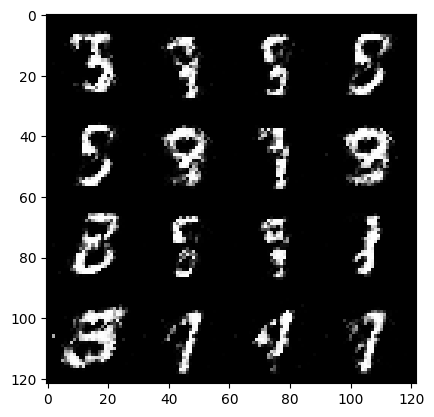

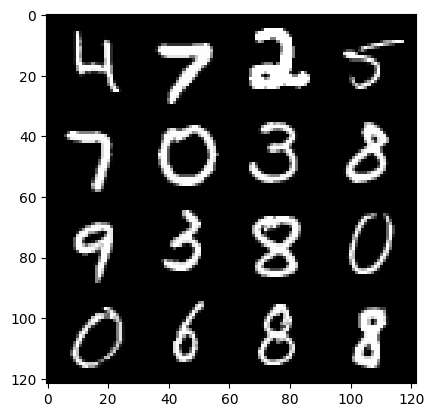

134: step 63000 / Gen loss: 3.491688651243848 / disc_loss: 0.13368191448350747


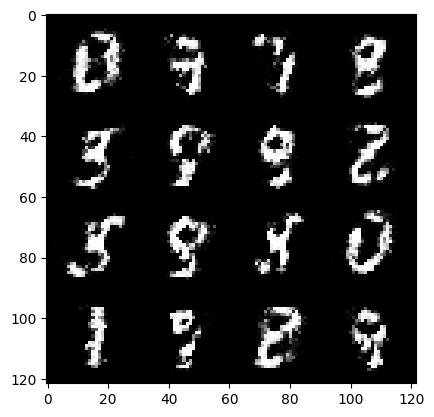

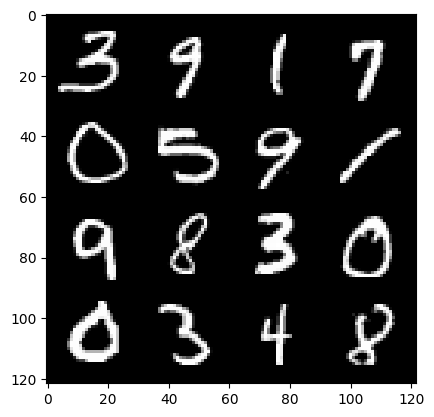

134: step 63300 / Gen loss: 3.3830762926737457 / disc_loss: 0.1586843056728441


  0%|          | 0/469 [00:00<?, ?it/s]

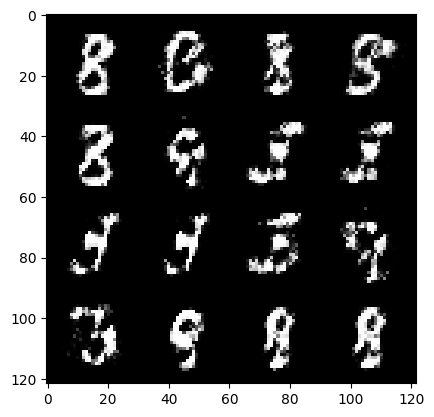

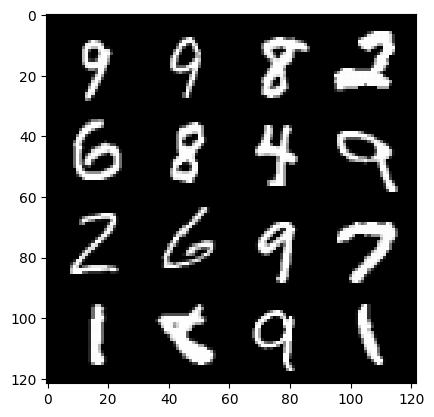

135: step 63600 / Gen loss: 3.2544280179341643 / disc_loss: 0.16169558331370362


  0%|          | 0/469 [00:00<?, ?it/s]

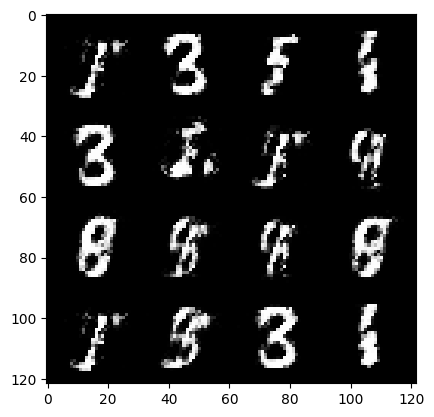

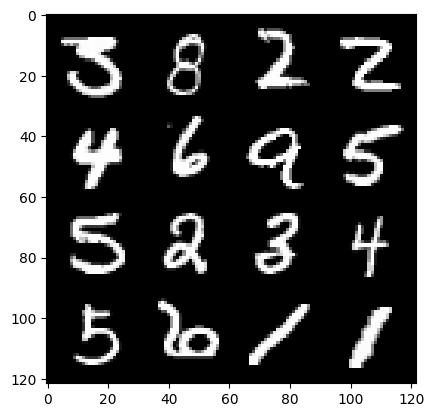

136: step 63900 / Gen loss: 3.1327043588956207 / disc_loss: 0.18733093363543354


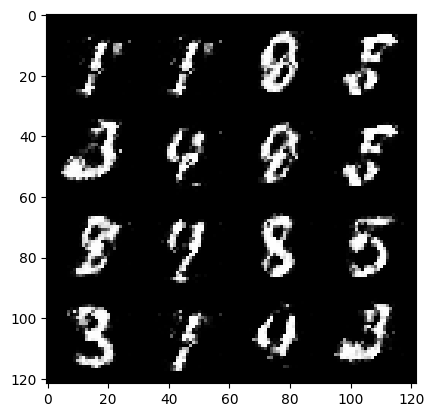

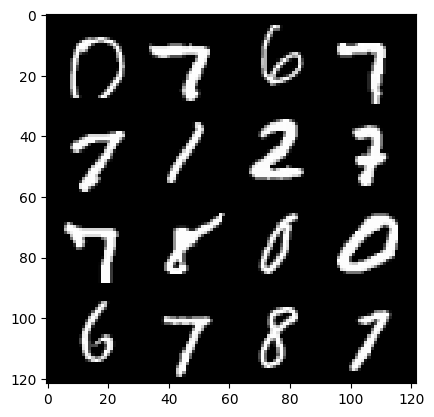

136: step 64200 / Gen loss: 3.051480276584624 / disc_loss: 0.17396765304108472


  0%|          | 0/469 [00:00<?, ?it/s]

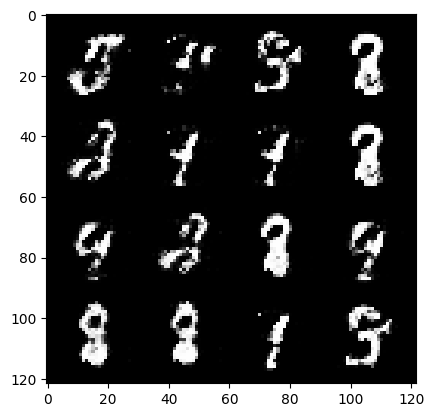

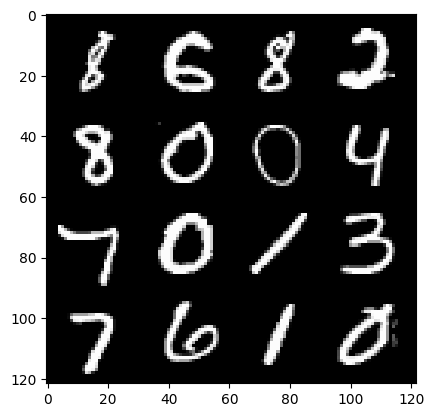

137: step 64500 / Gen loss: 3.259327786763509 / disc_loss: 0.16539169549942007


  0%|          | 0/469 [00:00<?, ?it/s]

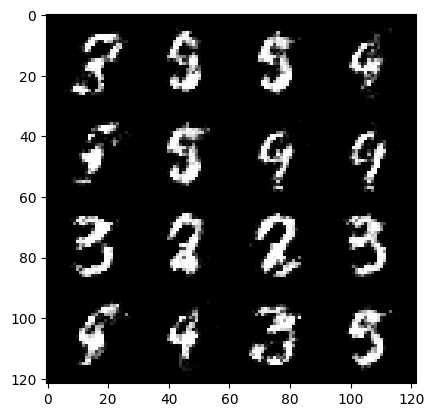

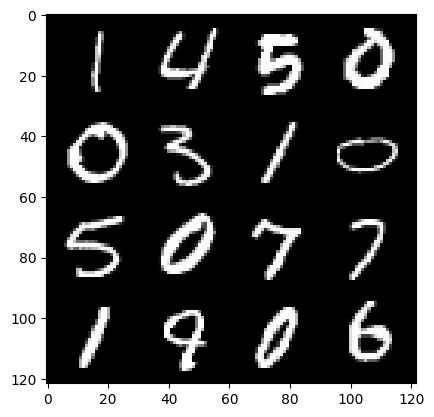

138: step 64800 / Gen loss: 2.9371600858370455 / disc_loss: 0.19404339693486675


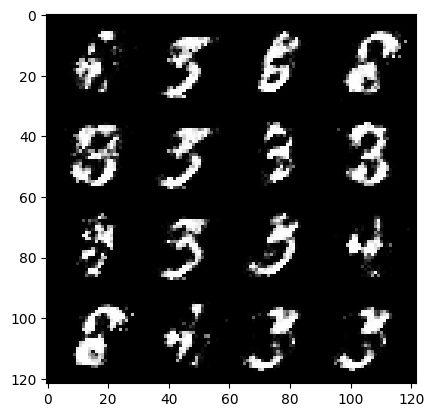

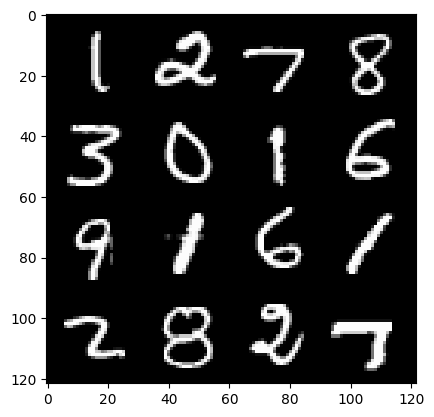

138: step 65100 / Gen loss: 2.896267727216082 / disc_loss: 0.1964214830845594


  0%|          | 0/469 [00:00<?, ?it/s]

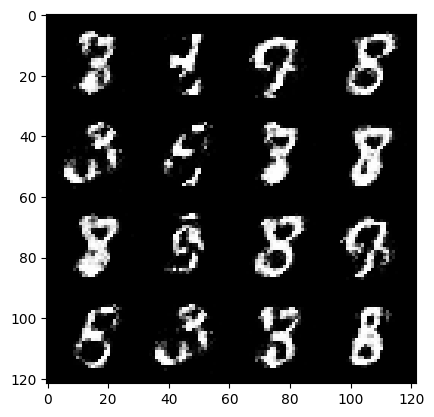

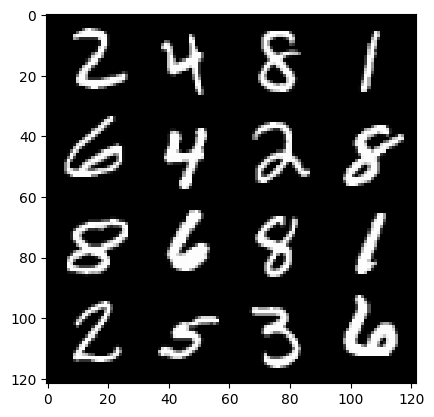

139: step 65400 / Gen loss: 3.0264172546068853 / disc_loss: 0.18053721219301214


  0%|          | 0/469 [00:00<?, ?it/s]

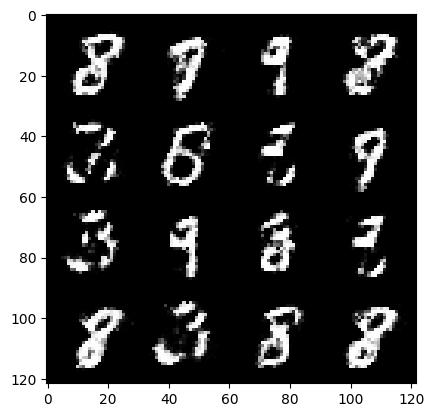

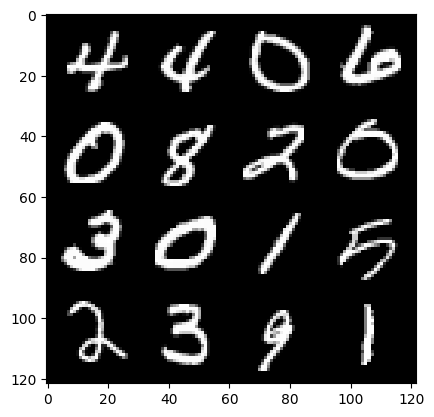

140: step 65700 / Gen loss: 2.899464066823327 / disc_loss: 0.20125605084002024


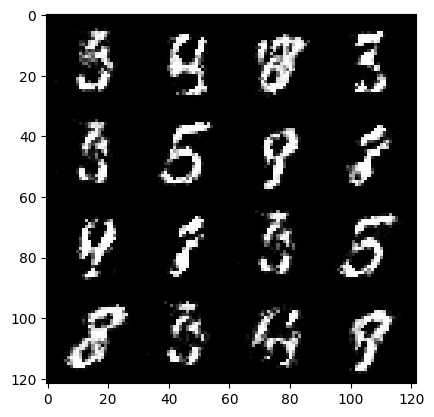

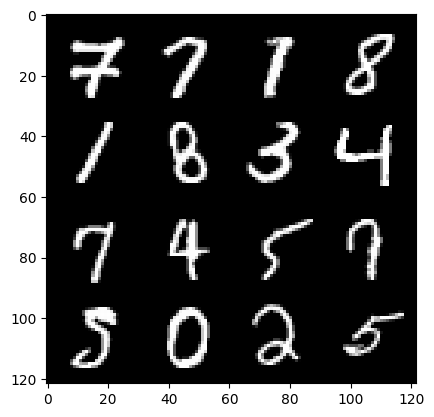

140: step 66000 / Gen loss: 3.0105151526133254 / disc_loss: 0.1784126882751782


  0%|          | 0/469 [00:00<?, ?it/s]

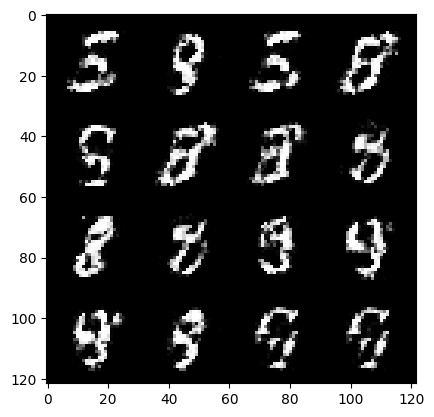

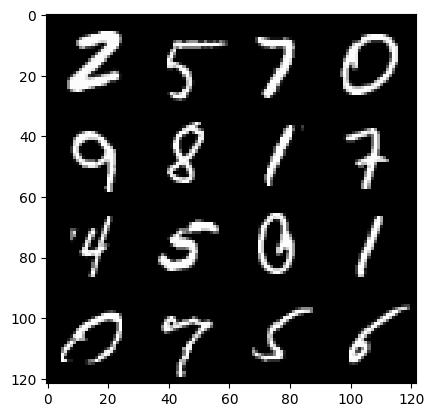

141: step 66300 / Gen loss: 2.863472057183584 / disc_loss: 0.18744691523412862


  0%|          | 0/469 [00:00<?, ?it/s]

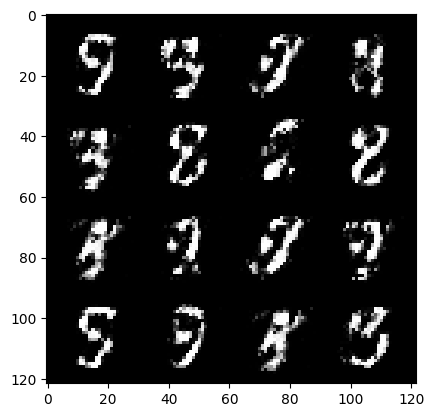

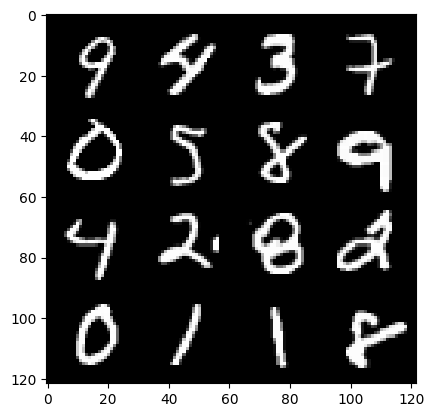

142: step 66600 / Gen loss: 3.0219110163052867 / disc_loss: 0.17541830435395234


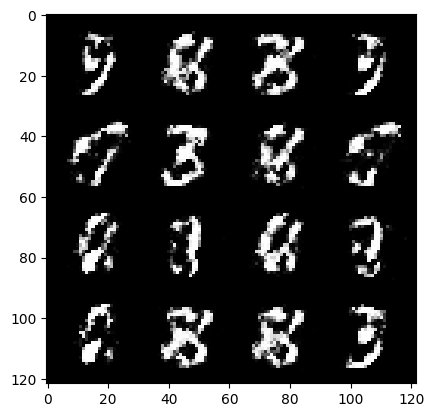

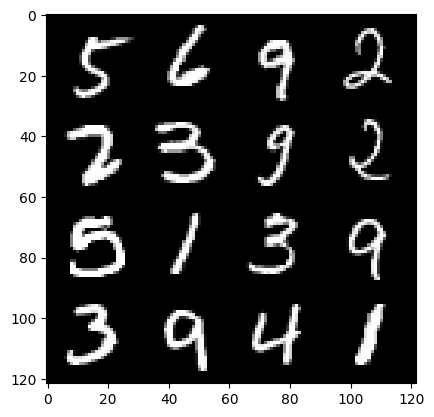

142: step 66900 / Gen loss: 3.0511135935783384 / disc_loss: 0.16615599413712825


  0%|          | 0/469 [00:00<?, ?it/s]

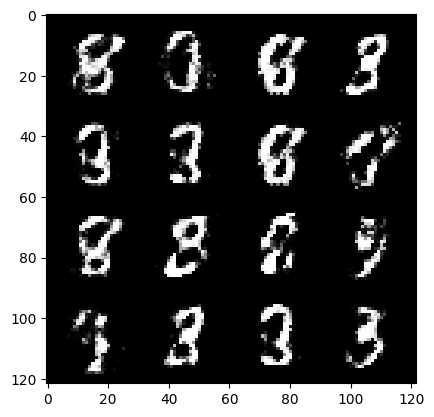

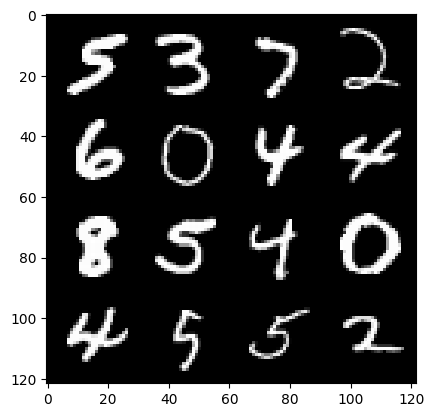

143: step 67200 / Gen loss: 3.2079310011863726 / disc_loss: 0.16659338521460682


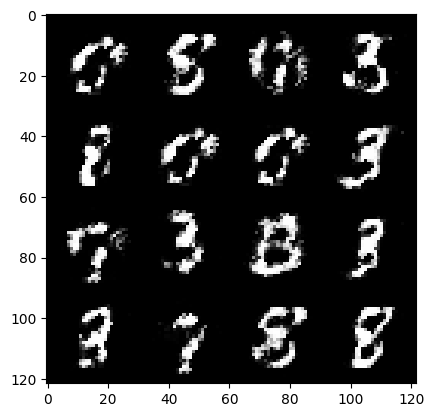

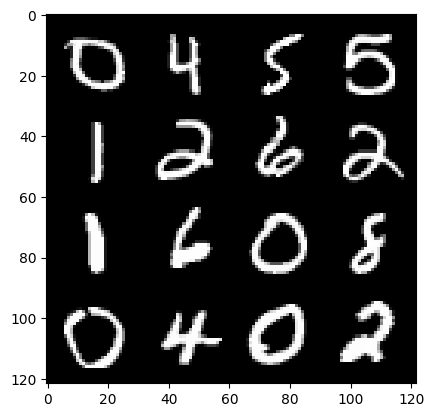

143: step 67500 / Gen loss: 3.292701242764789 / disc_loss: 0.15126045900086554


  0%|          | 0/469 [00:00<?, ?it/s]

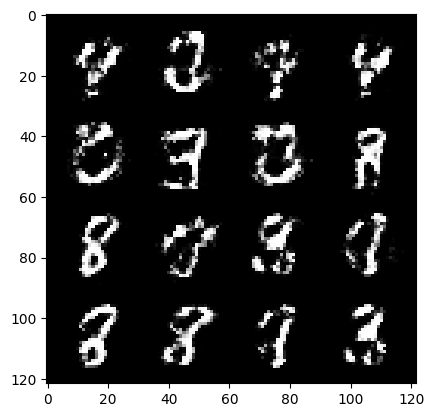

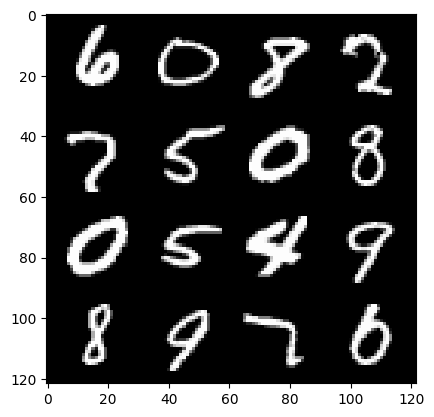

144: step 67800 / Gen loss: 2.927205265363062 / disc_loss: 0.18966308072209365


  0%|          | 0/469 [00:00<?, ?it/s]

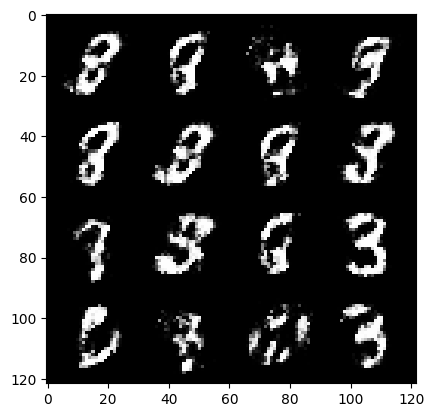

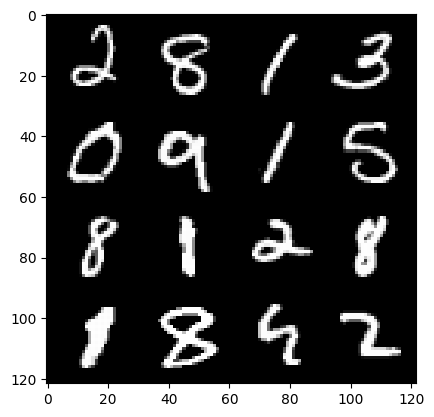

145: step 68100 / Gen loss: 2.832791129748025 / disc_loss: 0.20390019260346887


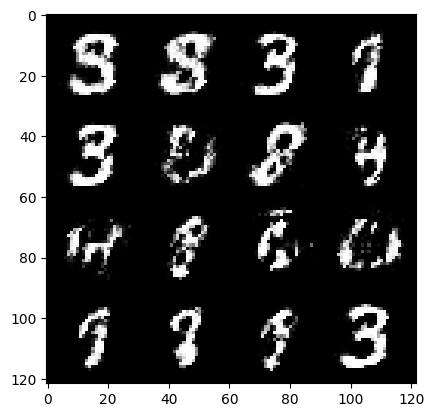

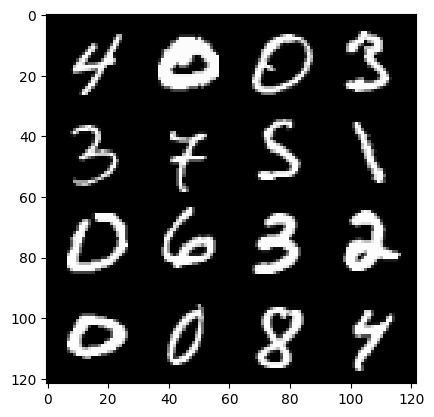

145: step 68400 / Gen loss: 2.9176780772209177 / disc_loss: 0.19282063156366372


  0%|          | 0/469 [00:00<?, ?it/s]

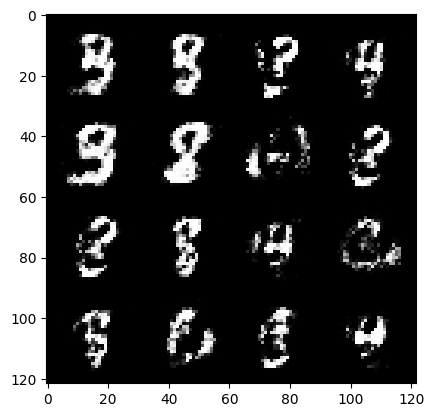

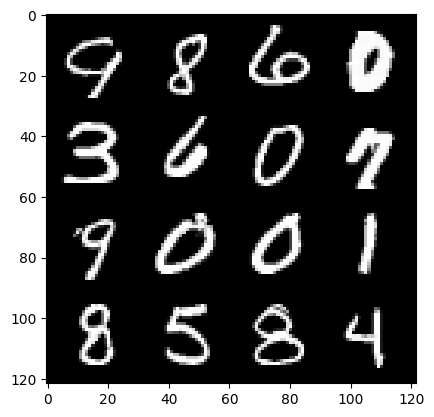

146: step 68700 / Gen loss: 2.9380631510416673 / disc_loss: 0.18577036902308453


  0%|          | 0/469 [00:00<?, ?it/s]

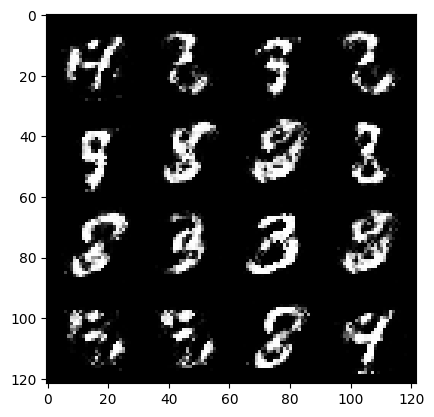

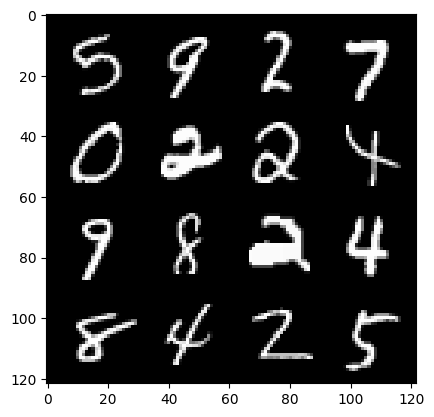

147: step 69000 / Gen loss: 2.9158250149091094 / disc_loss: 0.17907576965788996


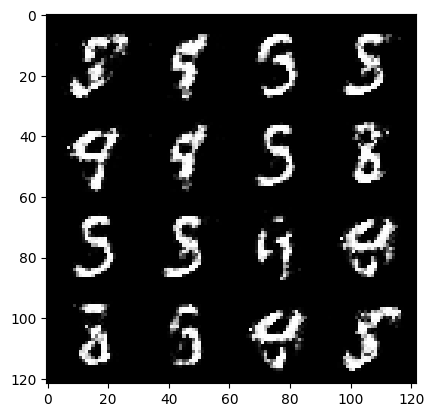

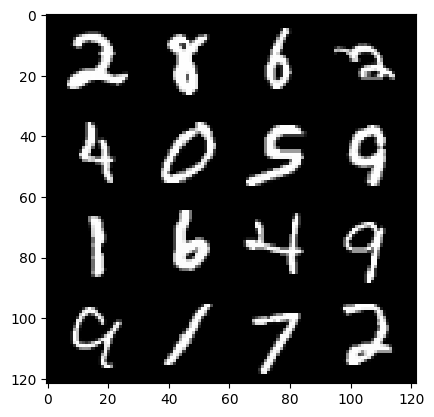

147: step 69300 / Gen loss: 2.833558995723723 / disc_loss: 0.21629641195138302


  0%|          | 0/469 [00:00<?, ?it/s]

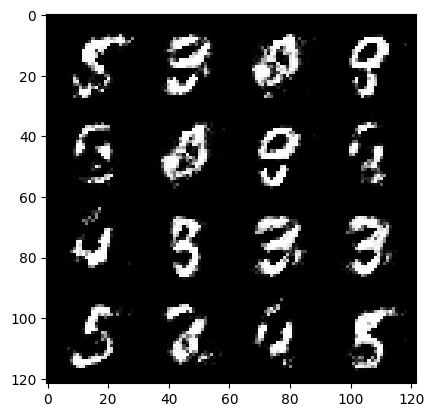

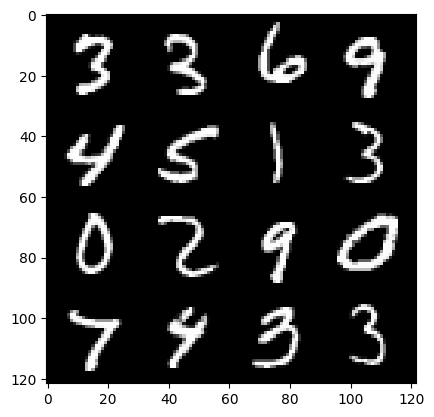

148: step 69600 / Gen loss: 2.8833518743515025 / disc_loss: 0.1944546353320281


  0%|          | 0/469 [00:00<?, ?it/s]

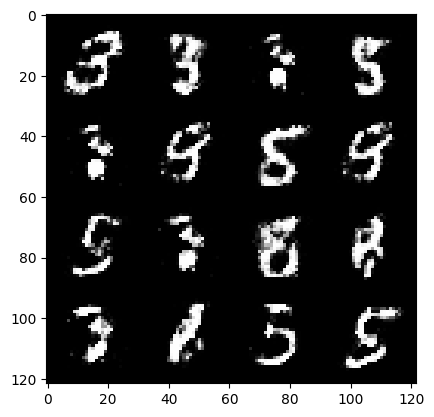

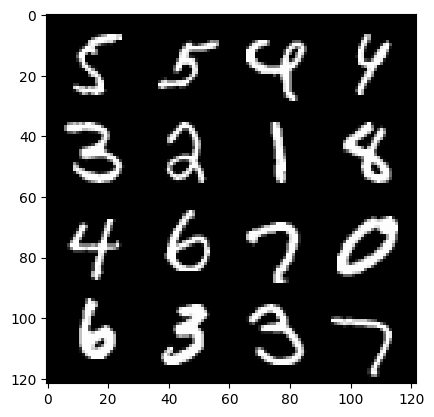

149: step 69900 / Gen loss: 2.8290058143933625 / disc_loss: 0.18561383917927743


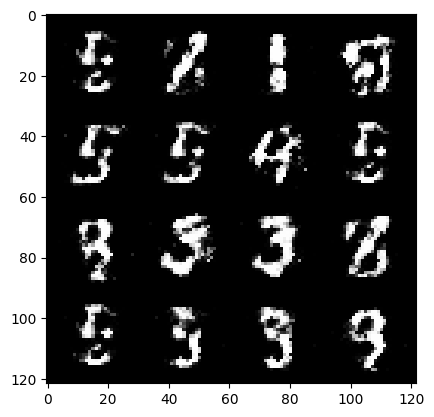

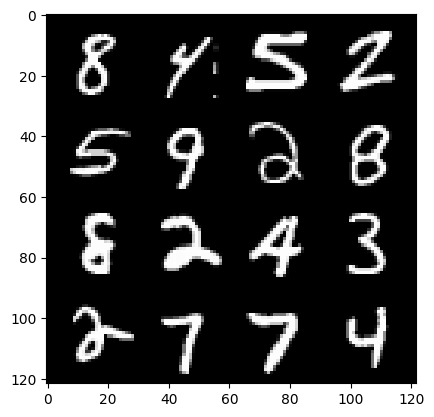

149: step 70200 / Gen loss: 2.9797577826182016 / disc_loss: 0.17160577612618605


  0%|          | 0/469 [00:00<?, ?it/s]

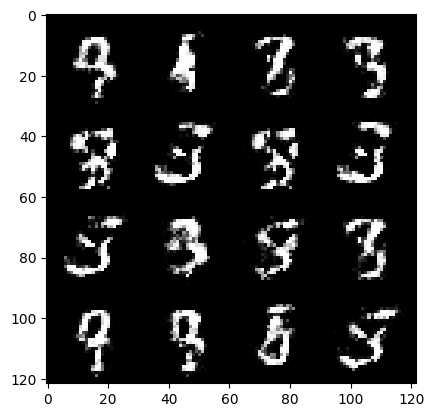

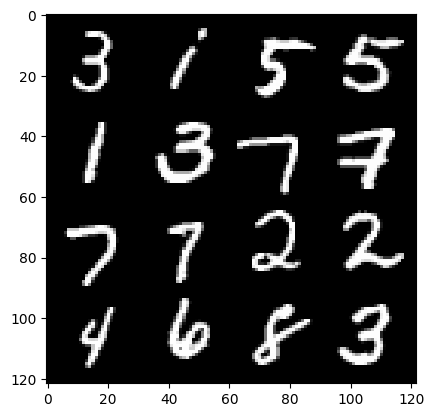

150: step 70500 / Gen loss: 3.0672952826817865 / disc_loss: 0.16430199635525544


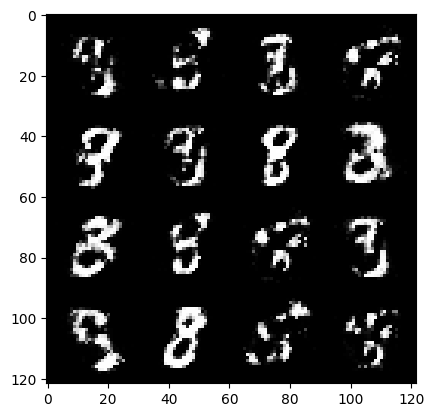

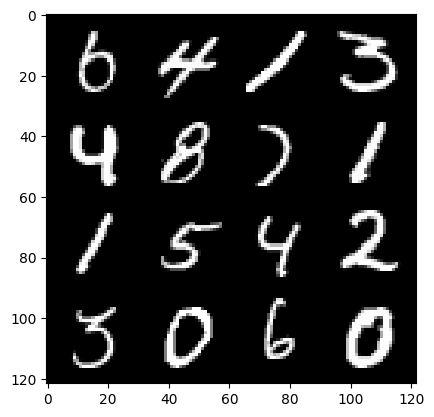

150: step 70800 / Gen loss: 2.948794040679933 / disc_loss: 0.18334068094690642


  0%|          | 0/469 [00:00<?, ?it/s]

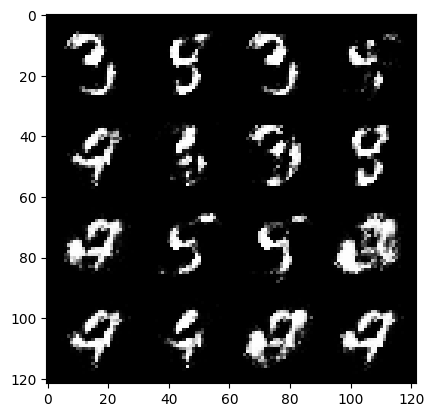

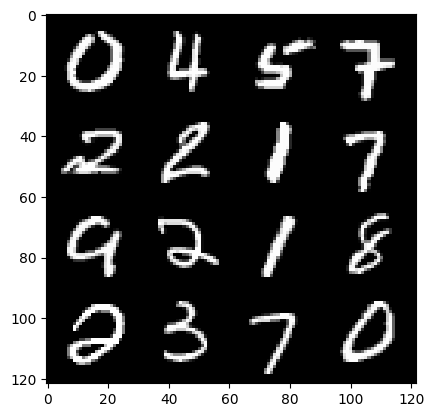

151: step 71100 / Gen loss: 2.8503053696950236 / disc_loss: 0.20274560856322457


  0%|          | 0/469 [00:00<?, ?it/s]

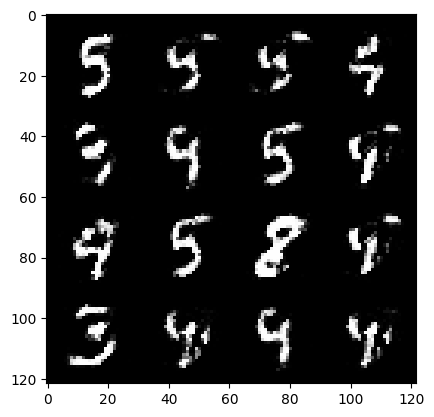

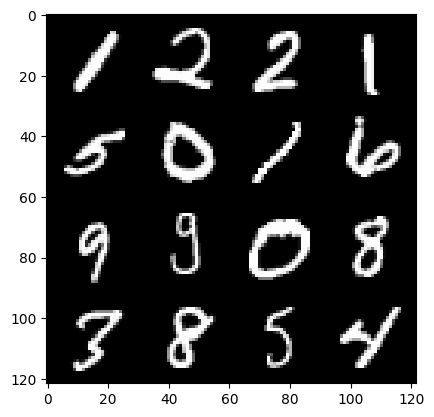

152: step 71400 / Gen loss: 3.0115637596448255 / disc_loss: 0.16571847461163988


In [ ]:
### 60000 / 128 = 468.75  = 469 steps in each epoch
### Each step is going to process 128 images = size of the batch (except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ### discriminator
    disc_opt.zero_grad()

    cur_bs=len(real) # real: 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)
    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    ### generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    ### visualization & stats
    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0,0
    cur_step+=1

In [1]:
exit